In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% height:100% !important; }</style>"))

# Baseline classifier: Wavelets and SVM

This notebook shows the steps we followed in order to implement a classification method based on Multiresolution Wavelet Decomposition as explained in 

The approach performs a 3 level Wavelet Packet decomposition on the images to produce the feature vectors that will be used to trained a classifier (usign Support Vector Machines).

In [2]:
# load libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.feature import hog
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC

import pywt as pywt
import cv2
import io
import os


Some functions and helpers :

In [3]:
def to_binary(img,threshold):
    img[img<threshold] = 0
    img[img>=threshold] = 1
    return img


In [4]:
def clipping_image( image ):
    '''
    Clip segmented imaged based on the contours of the leaf
    '''
    image = cv2.cvtColor( image, cv2.COLOR_BGR2GRAY );
    segmented, contours, hierarchy = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    x, y = [], []

    for contour_line in contours:
        for contour in contour_line:
            x.append(contour[0][0])
            y.append(contour[0][1])

    x1, x2, y1, y2 = min(x), max(x), min(y), max(y)

    clipped = segmented[y1:y2, x1:x2]

    return clipped

In [5]:
# from 5 classes to 3

def convert_to_3_classes(list_classes):
    classes_3=np.zeros(len(list_classes))

    classes_3 = np.where(np.array(list_classes)==1, 1 , 
                        np.where(np.array(list_classes)==2, 1 , 
                                np.where(np.array(list_classes)==3, 2 , 
                                        np.where(np.array(list_classes)==4, 2 , 
                                                np.where(np.array(list_classes)==5, 3 , 0)))))
    return classes_3

In [6]:
# select most important 20 features
def feature_selection(dataframe,classes, n_features):
    X, y = dataframe.values, classes
    Selector = SelectKBest(mutual_info_classif, k=n_features)
    Selector.fit(X, y)
    features_indices_new = Selector.get_support(indices=False)
    X_new = Selector.transform(X)
    return X_new

Loading and prepare the data:

In [12]:
# original database

territory = "carotid" #"carotid" or "femoral"


path_orig = "DATA/SEPARADES_FINALS_ID/parelles_pl/original/"
path_gt = "DATA/GT_PL_FINAL_20180607/"
path_bbdd = "DATA/dades_excels/"

# New database

if (territory == "carotid"):
    path_orig_new = "DATA/NEFRONA_crops/ACC/parelles_pl/original/"
    path_gt_new = "DATA/GT_ACC_PL_FINAL_20180619/"
else :
    path_orig_new = "DATA/NEFRONA_crops/FEM/parelles_pl/original/"
    path_gt_new = "DATA/GT_FEM_PL_FINAL_20180620/"
path_bbdd_new = "DATA/dades_excels/"

In [13]:
#data base load
bbdd_name = "base de dades estudiants (1).xlsx"
bbdd_name_new = "base de datos seguiments130618.xlsx"
bbdd = pd.read_excel(path_bbdd + bbdd_name)
bbdd_new = pd.read_excel(path_bbdd_new + bbdd_name_new)

In [14]:
# for testing purpose

img_name_original = "2230-AC_D_0.png"
img_name = "2230-AC_D_0_PL.png"



img_original = mpimg.imread(path_orig+img_name_original)
img_GT = mpimg.imread(path_gt+img_name)
im_GT_cv = cv2.imread(path_gt+img_name)
im_GT_cv_copy = np.uint8(im_GT_cv)
im_GT_cv_copy = to_binary(im_GT_cv_copy,1.1)




In [15]:
# prepare database with information we want:

df_new = bbdd_new[["Códigobiobanco","clasif_cc_d","clasif_cc_i","clasif_cc_d_24","clasif_cc_i_24",
                   "clasif_fem_sup_d","clasif_fem_sup_i","clasif_fem_sup_d_24","clasif_fem_sup_i_24",
                  "clasif_fem_com_d","clasif_fem_com_i","clasif_fem_com_d_24","clasif_fem_com_i_24"]]

### CAROTIDS IMAGES

1
3492-AC1_E_1
3492-AC1_E_1.png
3492
E
[ 4.]


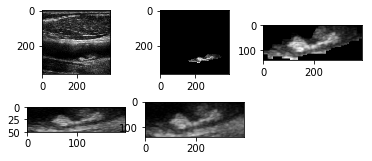

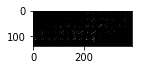

2
2636-AC2_D_2
2636-AC2_D_2.png
2636
D
[ 1.]


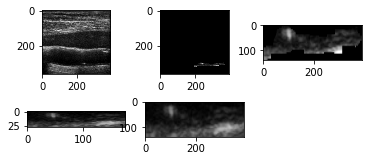

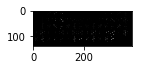

x 84
3708-AC_E_1
3708-AC_E_1.png
3708
E
[ 4.]


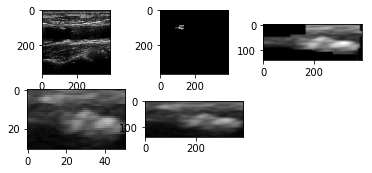

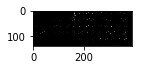

2
3123-AC2_D_0
3123-AC2_D_0.png
3123
D
[ 1.]


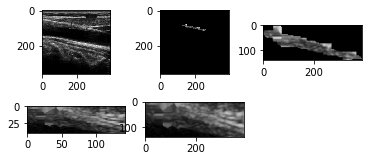

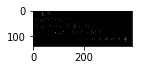

2
3416-AC2_D_2
3416-AC2_D_2.png
3416
D
[ 1.]


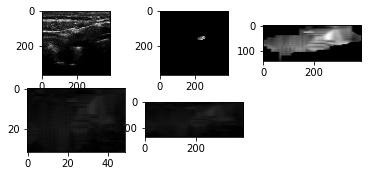

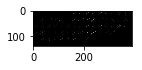

x 11
2586-AC_D_0
2586-AC_D_0.png
2586
D
[ nan]


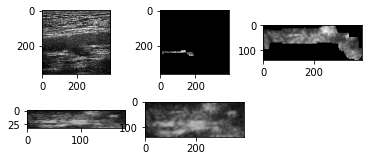

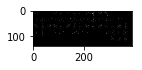

2
1808-AC2_D_1
1808-AC2_D_1.png
1808
D
[ 4.]


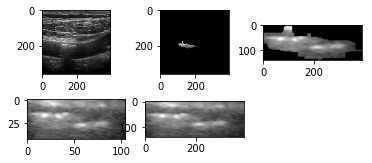

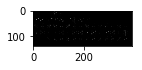

2
3836-AC2_E_0
3836-AC2_E_0.png
3836
E
[ 2.]


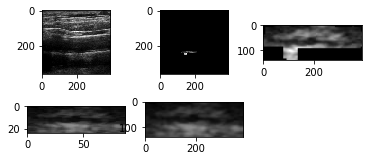

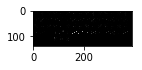

x 83
4083-AC_D_0
4083-AC_D_0.png
4083
D
[ 1.]


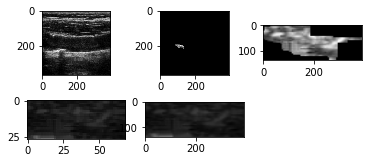

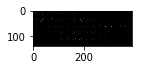

x 29
2042-AC_E_0
2042-AC_E_0.png
2042
E
[ 3.]


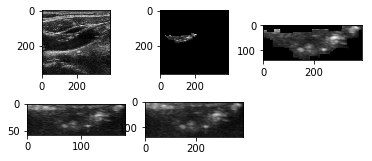

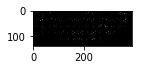

2
2559-AC2_E_1
2559-AC2_E_1.png
2559
E
[ 3.]


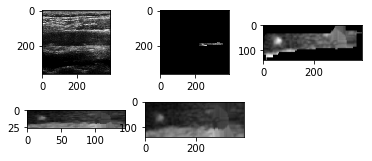

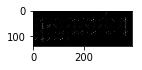

x 194
2634-AC_E_0
2634-AC_E_0.png
2634
E
[ 4.]


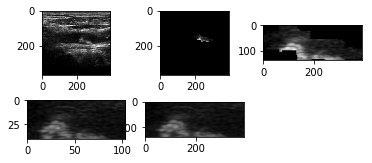

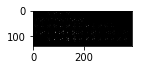

2
1859-AC2_E_0
1859-AC2_E_0.png
1859
E
[ nan]


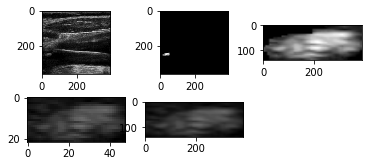

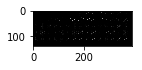

1
2421-AC1_E_2
2421-AC1_E_2.png
2421
E
[ 3.]


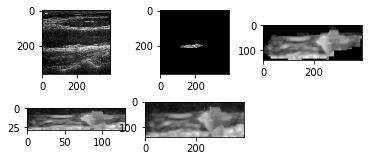

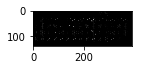

2
3118-AC2_D_2
3118-AC2_D_2.png
3118
D
[ 3.]


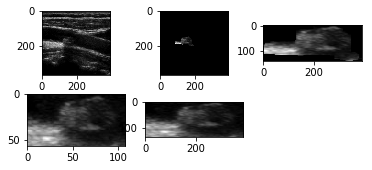

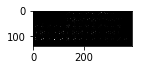

x 47
2974-AC_E_3
2974-AC_E_3.png
2974
E
[ 1.]


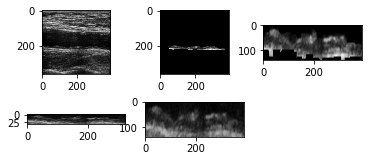

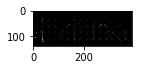

2
2421-AC2_D_2
2421-AC2_D_2.png
2421
D
[ 3.]


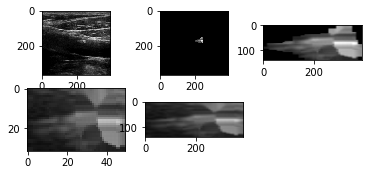

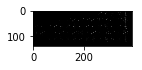

x 7
3933-AC_E_0
3933-AC_E_0.png
3933
E
[ 1.]


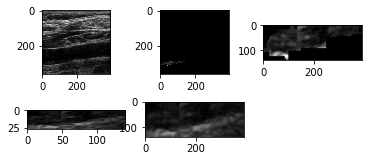

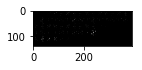

x 120
2289-AC_E_0
2289-AC_E_0.png
2289
E
[ 2.]


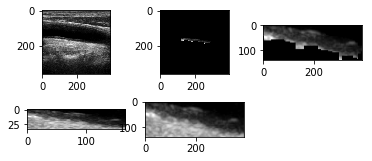

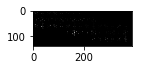

2
3118-AC2_D_3
3118-AC2_D_3.png
3118
D
[ 3.]


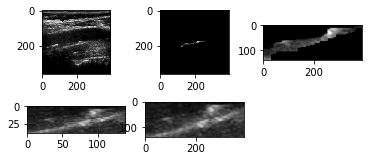

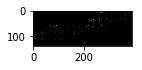

2
2341-AC2_D_0
2341-AC2_D_0.png
2341
D
[ 3.]


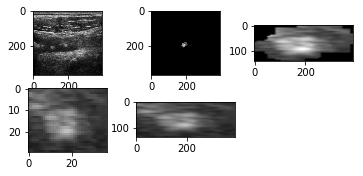

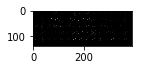

x 138
2208-AC_E_1
2208-AC_E_1.png
2208
E
[ 1.]


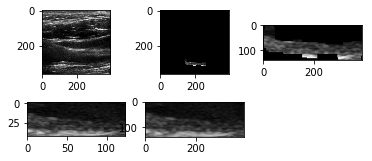

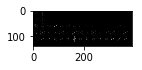

1
2507-AC1_D_0
2507-AC1_D_0.png
2507
D
[ nan]


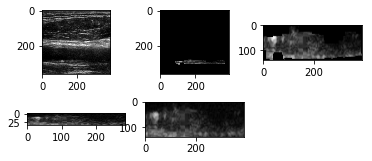

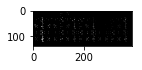

1
1814-AC1_E_1
1814-AC1_E_1.png
1814
E
[ nan]


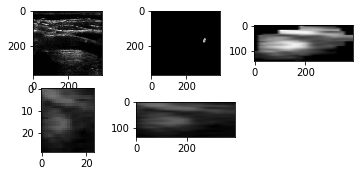

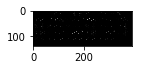

2
2850-AC2_D_0
2850-AC2_D_0.png
2850
D
[ 3.]


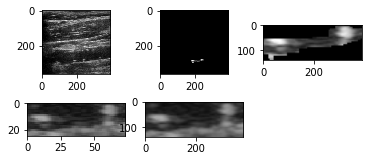

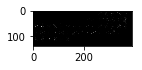

x 140
2230-AC_D_0
2230-AC_D_0.png
2230
D
[ 4.]


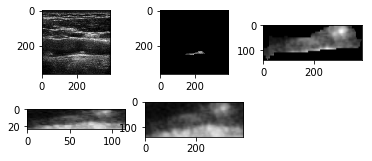

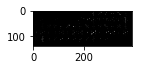

2
2507-AC2_E_0
2507-AC2_E_0.png
2507
E
[ 3.]


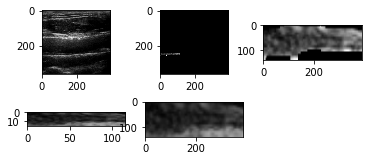

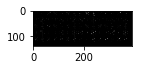

2
3645-AC2_E_0
3645-AC2_E_0.png
3645
E
[ 3.]


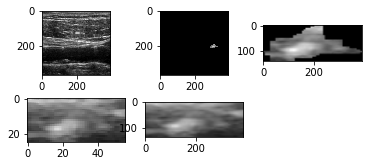

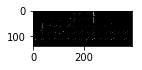

x 114
2313-AC_D_0
2313-AC_D_0.png
2313
D
[ nan]


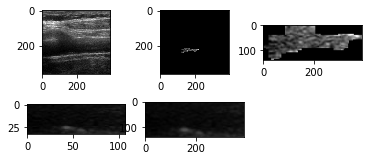

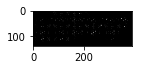

2
1808-AC2_D_0
1808-AC2_D_0.png
1808
D
[ 4.]


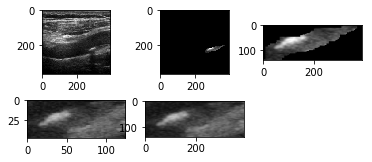

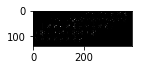

x 120
3285-AC_D_1
3285-AC_D_1.png
3285
D
[ 3.]


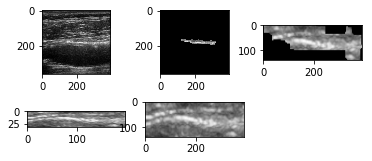

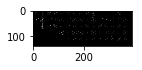

1
2850-AC1_E_0
2850-AC1_E_0.png
2850
E
[ nan]


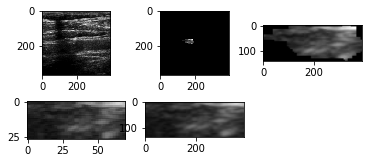

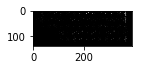

2
3306-AC2_D_0
3306-AC2_D_0.png
3306
D
[ 2.]


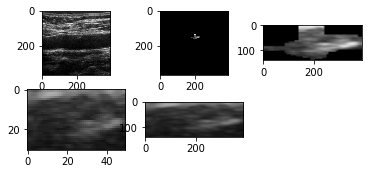

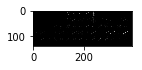

x 70
2400-AC_E_0
2400-AC_E_0.png
2400
E
[ 2.]


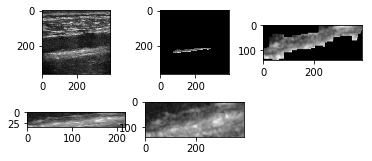

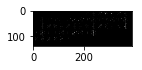

x 247
2849-AC_D_1
2849-AC_D_1.png
2849
D
[ 3.]


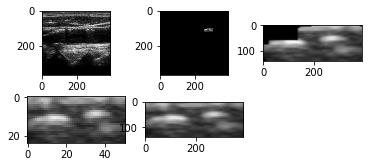

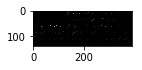

2
3492-AC2_D_0
3492-AC2_D_0.png
3492
D
[ 2.]


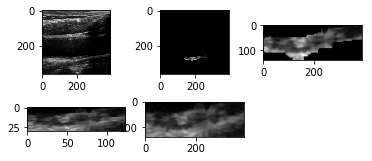

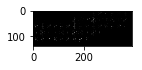

x 211
2392-AC_D_1
2392-AC_D_1.png
2392
D
[ 1.]


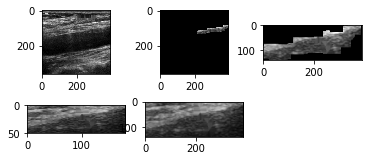

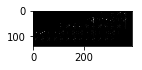

x 43
3708-AC_E_0
3708-AC_E_0.png
3708
E
[ 4.]


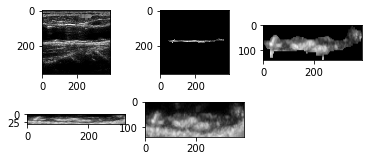

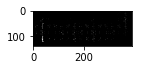

1
3492-AC1_E_2
3492-AC1_E_2.png
3492
E
[ 4.]


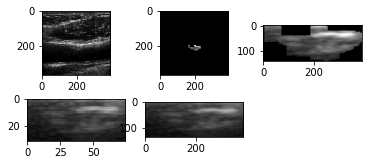

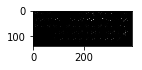

1
2927-AC1_E_0
2927-AC1_E_0.png
2927
E
[ 5.]


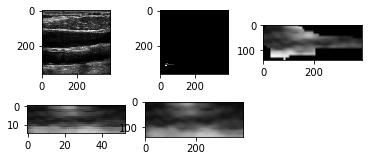

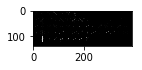

1
2754-AC1_E_1
2754-AC1_E_1.png
2754
E
[ nan]


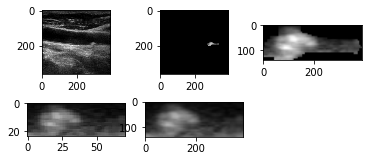

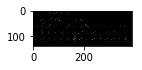

x 48
3708-AC_E_2
3708-AC_E_2.png
3708
E
[ 4.]


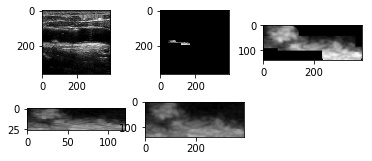

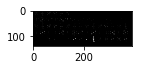

2
2636-AC2_D_1
2636-AC2_D_1.png
2636
D
[ 1.]


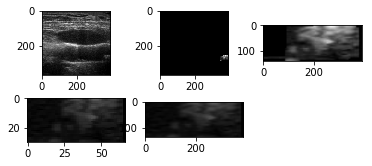

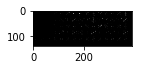

x 120
3456-AC_E_2
3456-AC_E_2.png
3456
E
[ 3.]


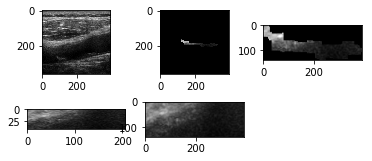

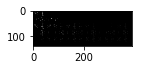

2
2754-AC2_D_1
2754-AC2_D_1.png
2754
D
[ 3.]


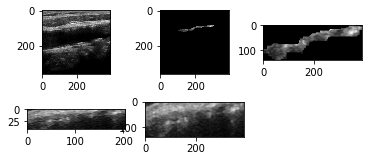

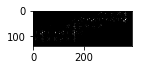

1
2636-AC1_E_1
2636-AC1_E_1.png
2636
E
[ 3.]


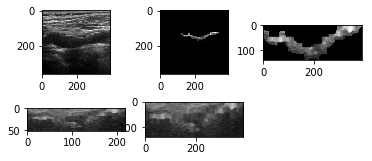

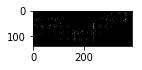

1
2845-AC1_E_0
2845-AC1_E_0.png
2845
E
[ 1.]


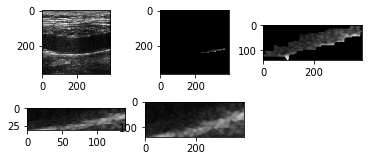

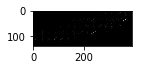

x 193
3068-AC_D_0
3068-AC_D_0.png
3068
D
[ 2.]


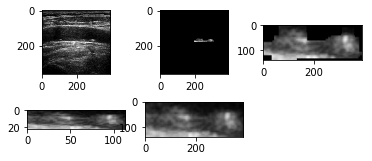

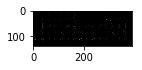

2
2507-AC2_E_2
2507-AC2_E_2.png
2507
E
[ 3.]


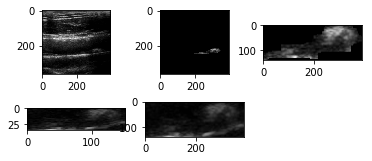

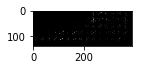

2
2835-AC2_D_0
2835-AC2_D_0.png
2835
D
[ 4.]


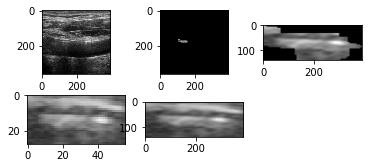

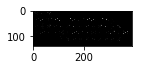

x 171
2205-AC_E_0
2205-AC_E_0.png
2205
E
[ 4.]


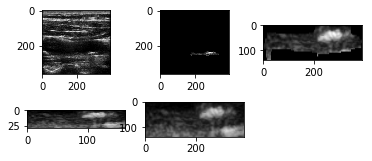

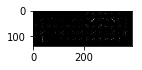

2
2400-AC2_E_0
2400-AC2_E_0.png
2400
E
[ 2.]


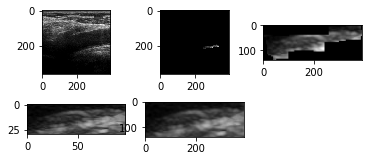

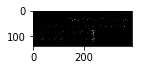

x 168
2216-AC_D_0
2216-AC_D_0.png
2216
D
[ 4.]


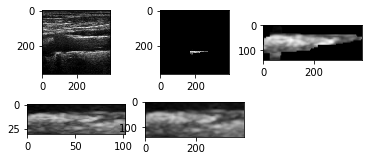

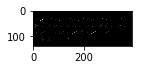

2
3840-AC2_D_1
3840-AC2_D_1.png
3840
D
[ 1.]


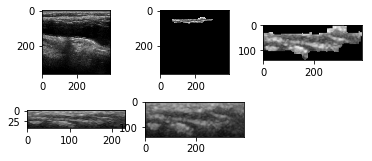

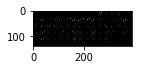

x 206
3412-AC_E_0
3412-AC_E_0.png
3412
E
[ 3.]


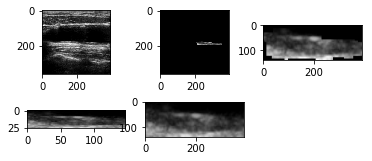

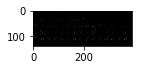

1
2835-AC1_E_0
2835-AC1_E_0.png
2835
E
[ nan]


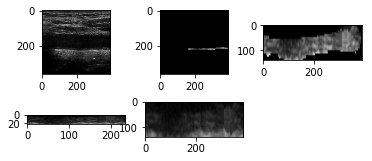

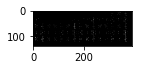

1
2400-AC1_D_0
2400-AC1_D_0.png
2400
D
[ 1.]


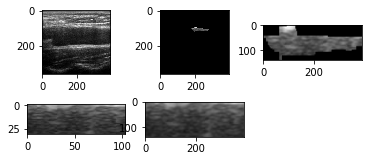

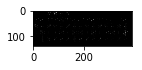

x 193
3690-AC_E_0
3690-AC_E_0.png
3690
E
[ 1.]


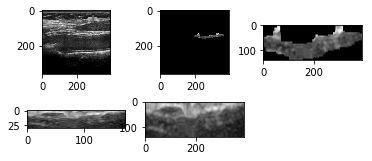

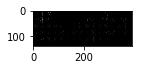

2
4003-AC2_D_1
4003-AC2_D_1.png
4003
D
[ 1.]


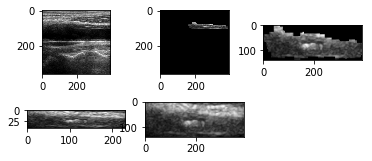

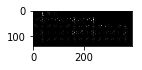

x 152
2921-AC_E_0
2921-AC_E_0.png
2921
E
[ 5.]


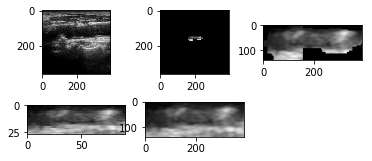

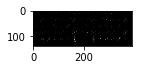

2
3087-AC2_D_1
3087-AC2_D_1.png
3087
D
[ 3.]


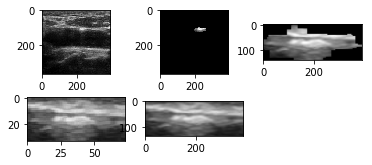

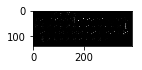

2
3118-AC2_D_1
3118-AC2_D_1.png
3118
D
[ 3.]


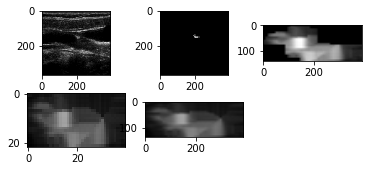

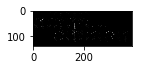

x 157
3339-AC_E_1
3339-AC_E_1.png
3339
E
[ 2.]


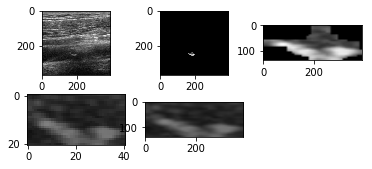

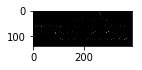

x 296
2787-AC_E_0
2787-AC_E_0.png
2787
E
[ 3.]


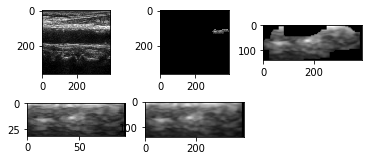

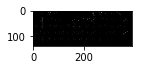

x 284
2974-AC_E_0
2974-AC_E_0.png
2974
E
[ 1.]


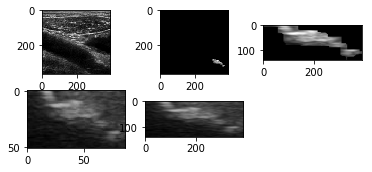

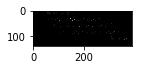

x 120
4123-AC_E_0
4123-AC_E_0.png
4123
E
[ 5.]


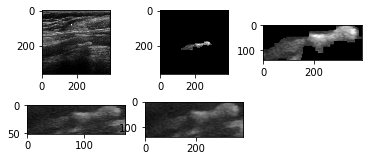

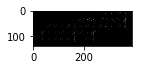

2
2171-AC2_D_1
2171-AC2_D_1.png
2171
D
[ 2.]


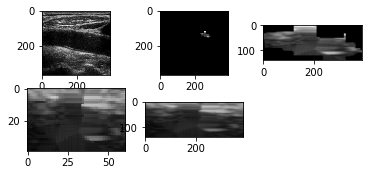

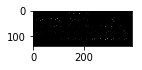

2
2421-AC2_D_1
2421-AC2_D_1.png
2421
D
[ 3.]


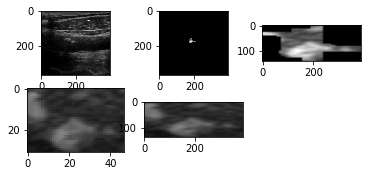

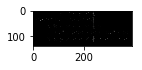

2
2171-AC2_D_0
2171-AC2_D_0.png
2171
D
[ 2.]


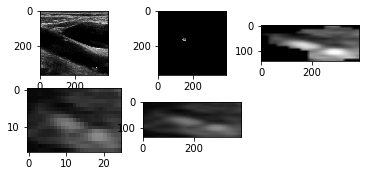

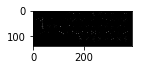

2
3087-AC2_D_0
3087-AC2_D_0.png
3087
D
[ 3.]


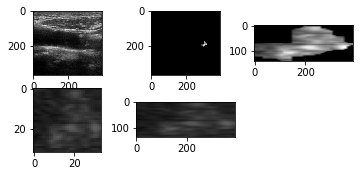

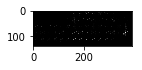

x 216
3940-AC_E_1
3940-AC_E_1.png
3940
E
[ 2.]


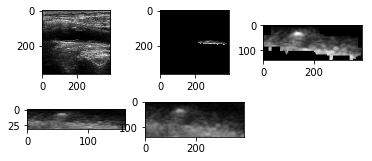

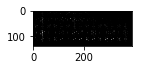

2
4003-AC2_D_0
4003-AC2_D_0.png
4003
D
[ 1.]


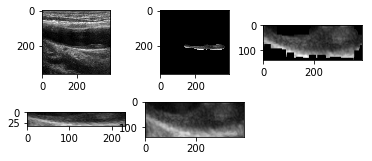

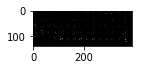

1
2347-AC1_D_1
2347-AC1_D_1.png
2347
D
[ nan]


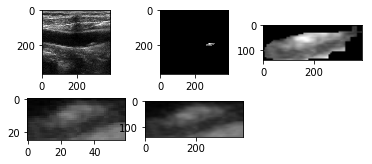

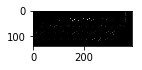

x 176
4062-AC_E_1
4062-AC_E_1.png
4062
E
[ 5.]


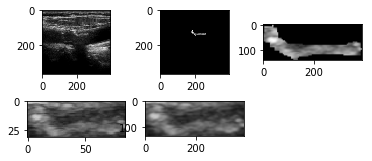

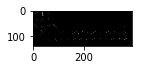

x 48
3264-AC_E_1
3264-AC_E_1.png
3264
E
[ 5.]


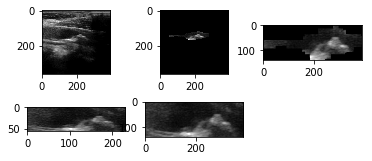

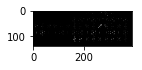

2
4052-AC2_E_1
4052-AC2_E_1.png
4052
E
[ 2.]


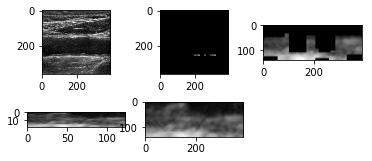

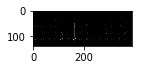

x 102
4049-AC_E_0
4049-AC_E_0.png
4049
E
[ 1.]


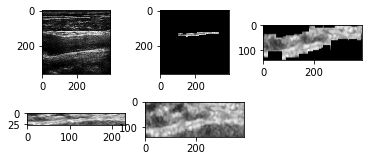

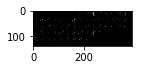

2
3419-AC2_E_1
3419-AC2_E_1.png
3419
E
[ 4.]


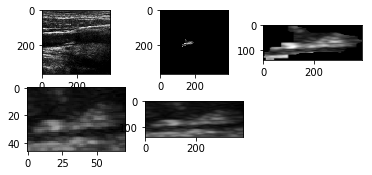

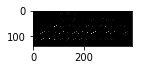

2
3830-AC2_D_0
3830-AC2_D_0.png
3830
D
[ 3.]


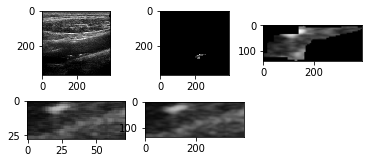

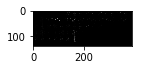

2
1906-AC2_D_2
1906-AC2_D_2.png
1906
D
[ 3.]


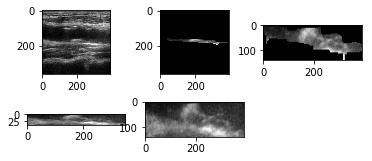

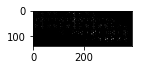

x 11
1983-AC_E_2
1983-AC_E_2.png
1983
E
[ 4.]


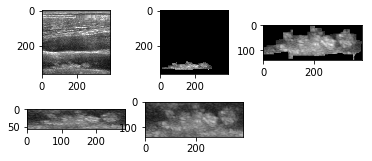

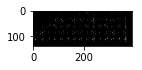

1
2754-AC1_E_0
2754-AC1_E_0.png
2754
E
[ nan]


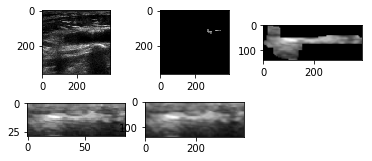

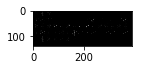

1
1801-AC1_E_0
1801-AC1_E_0.png
1801
E
[ nan]


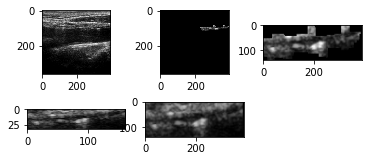

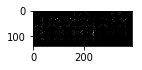

x 148
2175-AC_E_1
2175-AC_E_1.png
2175
E
[ 4.]


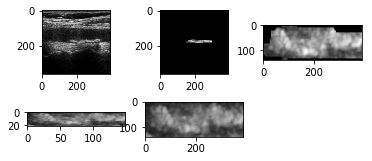

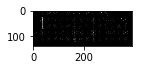

2
3236-AC2_D_1
3236-AC2_D_1.png
3236
D
[ 3.]


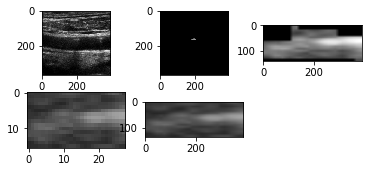

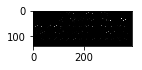

2
2332-AC2_E_0
2332-AC2_E_0.png
2332
E
[ 1.]


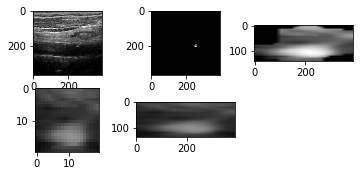

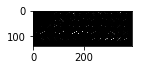

2
2700-AC2_E_0
2700-AC2_E_0.png
2700
E
[ 2.]


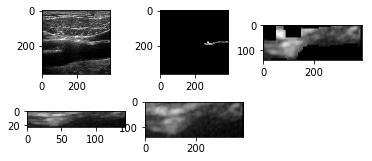

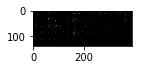

x 102
3866-AC_E_0
3866-AC_E_0.png
3866
E
[ 1.]


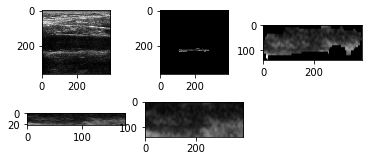

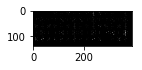

x 195
2513-AC_D_0
2513-AC_D_0.png
2513
D
[ 3.]


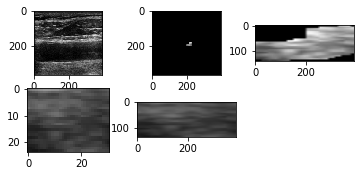

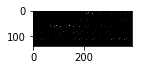

1
2290-AC1_E_0
2290-AC1_E_0.png
2290
E
[ nan]


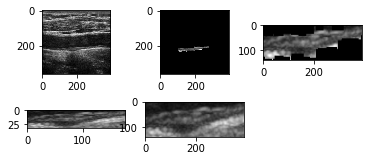

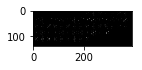

2
3752-AC2_E_2
3752-AC2_E_2.png
3752
E
[ 4.]


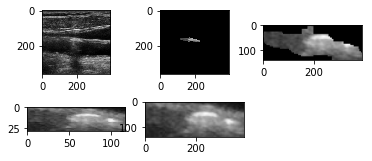

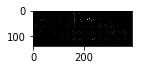

x 248
2441-AC_E_0
2441-AC_E_0.png
2441
E
[ 5.]


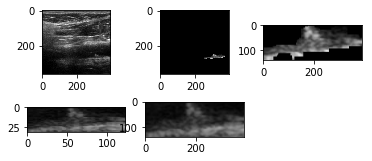

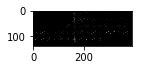

2
1817-AC2_E_1
1817-AC2_E_1.png
1817
E
[ 4.]


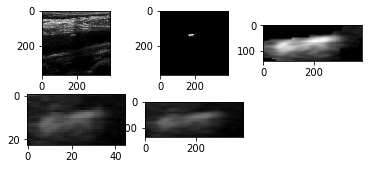

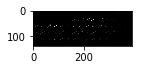

2
2853-AC2_E_0
2853-AC2_E_0.png
2853
E
[ 1.]


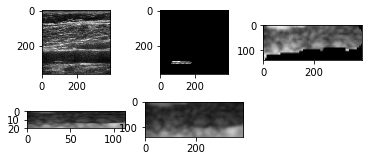

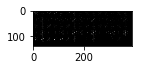

2
4027-AC2_E_0
4027-AC2_E_0.png
4027
E
[ 2.]


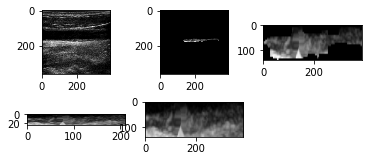

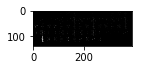

2
3958-AC2_E_0
3958-AC2_E_0.png
3958
E
[ 2.]


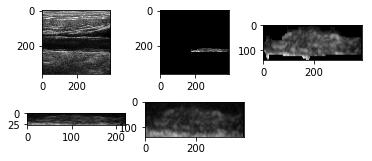

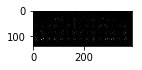

x 102
3291-AC_D_1
3291-AC_D_1.png
3291
D
[ 3.]


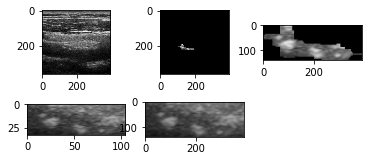

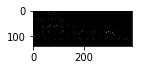

2
2370-AC2_E_0
2370-AC2_E_0.png
2370
E
[ 1.]


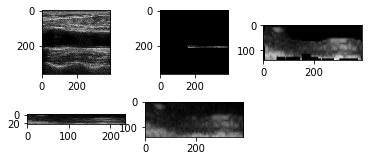

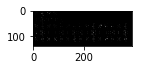

2
2518-AC2_D_0
2518-AC2_D_0.png
2518
D
[ nan]


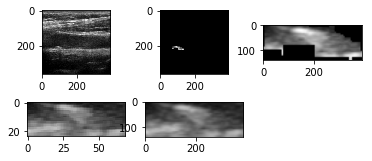

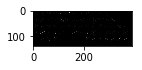

x 252
2441-AC_E_1
2441-AC_E_1.png
2441
E
[ 5.]


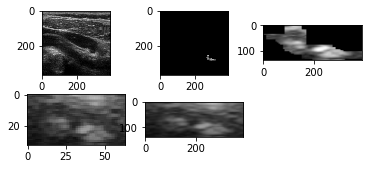

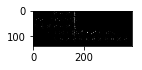

2
3752-AC2_E_3
3752-AC2_E_3.png
3752
E
[ 4.]


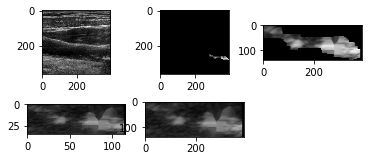

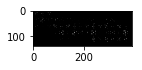

2
2586-AC2_E_0
2586-AC2_E_0.png
2586
E
[ 3.]


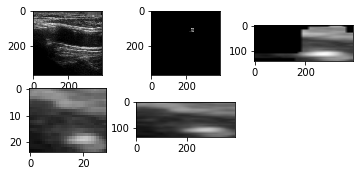

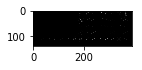

x 68
3496-AC_E_0
3496-AC_E_0.png
3496
E
[ 5.]


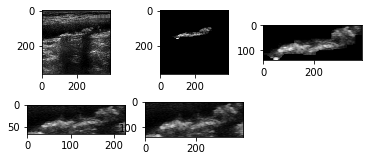

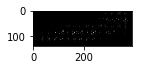

2
1919-AC2_E_1
1919-AC2_E_1.png
1919
E
[ 1.]


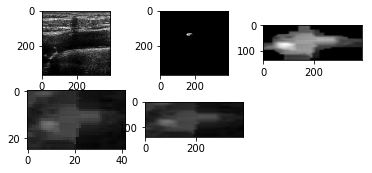

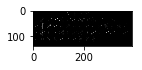

2
3145-AC2_E_2
3145-AC2_E_2.png
3145
E
[ 3.]


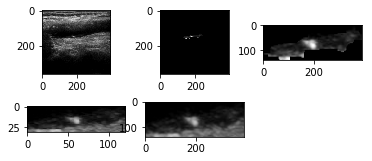

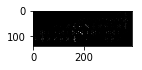

x 60
1890-AC_D_0
1890-AC_D_0.png
1890
D
[ 2.]


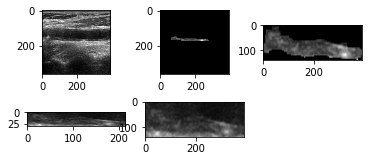

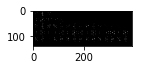

1
2586-AC1_D_0
2586-AC1_D_0.png
2586
D
[ nan]


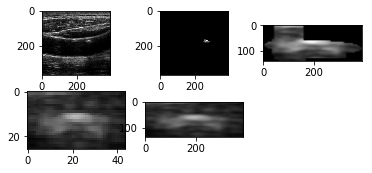

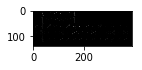

1
2830-AC1_E_1
2830-AC1_E_1.png
2830
E
[ nan]


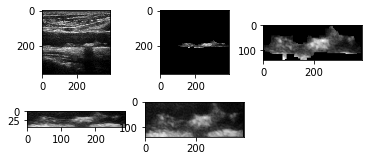

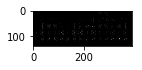

x 175
3071-AC_D_0
3071-AC_D_0.png
3071
D
[ 4.]


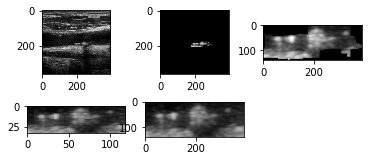

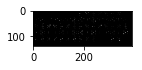

1
2811-AC1_D_0
2811-AC1_D_0.png
2811
D
[ nan]


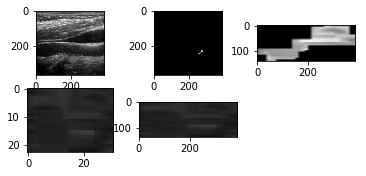

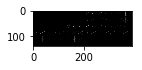

2
4084-AC2_E_1
4084-AC2_E_1.png
4084
E
[ 1.]


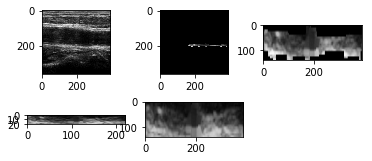

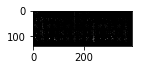

2
2174-AC2_D_0
2174-AC2_D_0.png
2174
D
[ 1.]


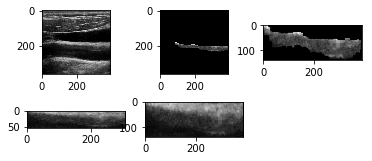

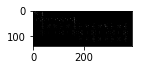

x 120
4084-AC_E_0
4084-AC_E_0.png
4084
E
[ 4.]


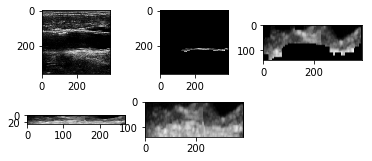

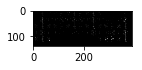

1
2441-AC1_E_0
2441-AC1_E_0.png
2441
E
[ 5.]


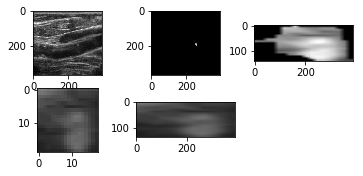

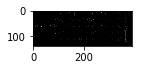

2
3428-AC2_D_0
3428-AC2_D_0.png
3428
D
[ 4.]


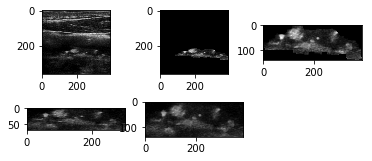

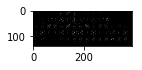

2
4183-AC2_E_1
4183-AC2_E_1.png
4183
E
[ 5.]


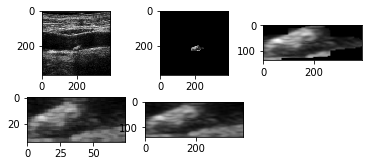

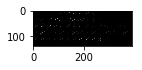

2
2452-AC2_E_0
2452-AC2_E_0.png
2452
E
[ 1.]


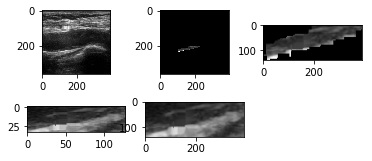

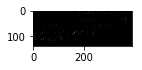

x 156
1908-AC_D_0
1908-AC_D_0.png
1908
D
[ 5.]


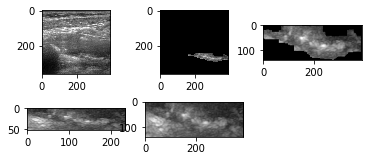

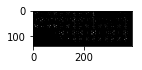

x 247
3702-AC_D_0
3702-AC_D_0.png
3702
D
[ 4.]


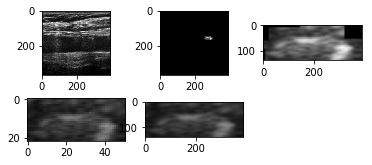

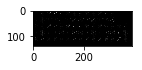

x 266
3912-AC_D_1
3912-AC_D_1.png
3912
D
[ 3.]


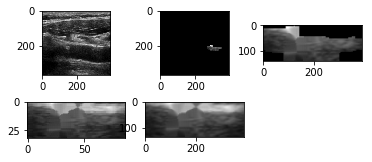

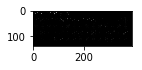

x 138
2025-AC_E_0
2025-AC_E_0.png
2025
E
[ 2.]


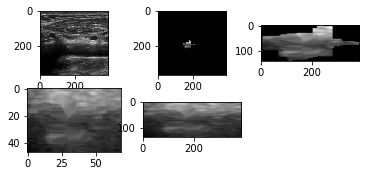

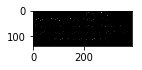

2
3272-AC2_E_1
3272-AC2_E_1.png
3272
E
[ 2.]


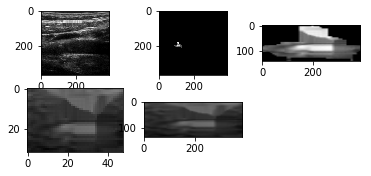

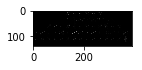

2
2365-AC2_E_0
2365-AC2_E_0.png
2365
E
[ 2.]


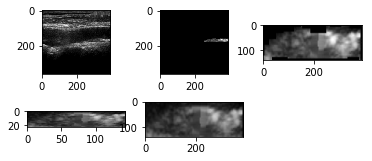

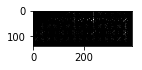

x 302
3236-AC_D_1
3236-AC_D_1.png
3236
D
[ 4.]


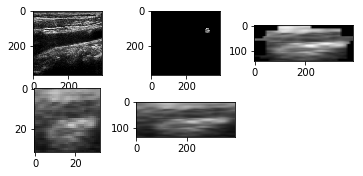

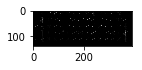

x 193
2109-AC_D_1
2109-AC_D_1.png
2109
D
[ 2.]


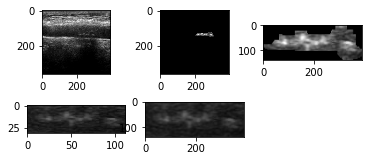

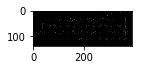

1
2855-AC1_E_1
2855-AC1_E_1.png
2855
E
[ 5.]


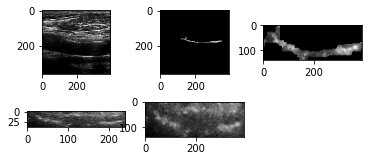

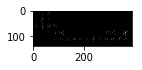

x 11
3487-AC_E_0
3487-AC_E_0.png
3487
E
[ nan]


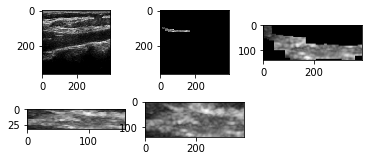

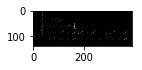

x 185
4149-AC_E_0
4149-AC_E_0.png
4149
E
[ nan]


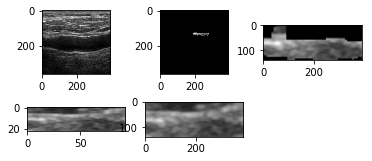

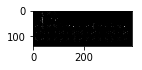

2
2948-AC2_E_0
2948-AC2_E_0.png
2948
E
[ 4.]


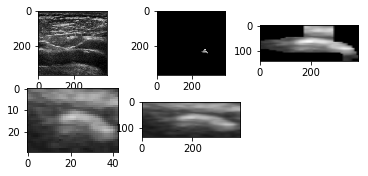

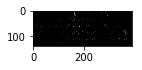

x 194
3387-AC_E_0
3387-AC_E_0.png
3387
E
[ 2.]


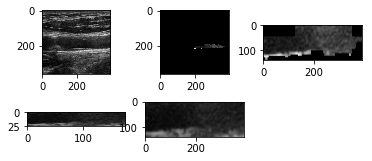

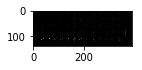

x 48
3387-AC_E_1
3387-AC_E_1.png
3387
E
[ 2.]


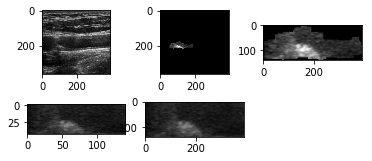

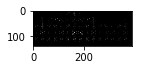

2
3129-AC2_E_0
3129-AC2_E_0.png
3129
E
[ 1.]


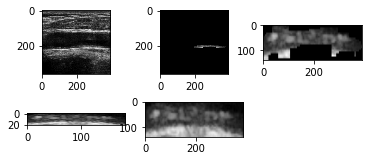

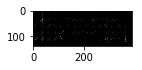

2
2561-AC2_D_0
2561-AC2_D_0.png
2561
D
[ 2.]


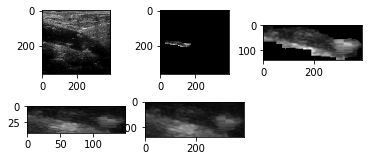

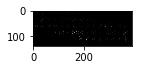

2
2309-AC2_E_0
2309-AC2_E_0.png
2309
E
[ 1.]


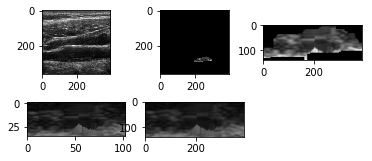

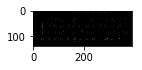

2
3752-AC2_E_0
3752-AC2_E_0.png
3752
E
[ 4.]


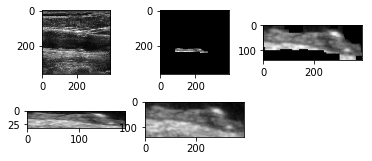

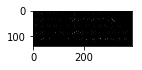

2
3145-AC2_E_1
3145-AC2_E_1.png
3145
E
[ 3.]


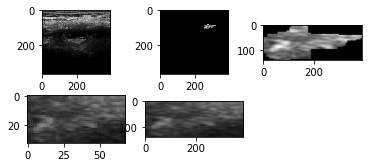

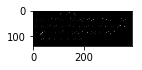

2
2511-AC2_D_0
2511-AC2_D_0.png
2511
D
[ 3.]


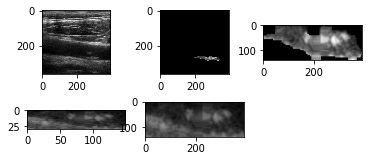

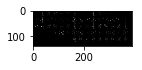

1
3156-AC1_E_1
3156-AC1_E_1.png
3156
E
[ nan]


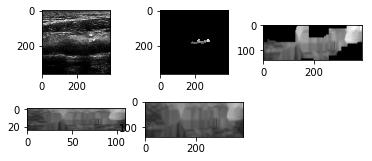

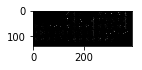

2
3272-AC2_E_0
3272-AC2_E_0.png
3272
E
[ 2.]


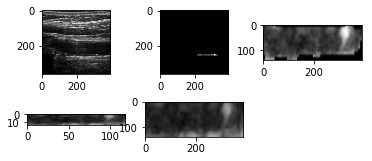

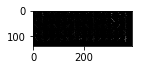

x 193
2874-AC_E_0
2874-AC_E_0.png
2874
E
[ 2.]


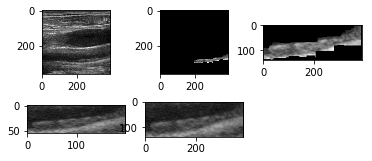

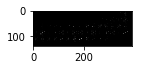

x 120
3621-AC_D_1
3621-AC_D_1.png
3621
D
[ 5.]


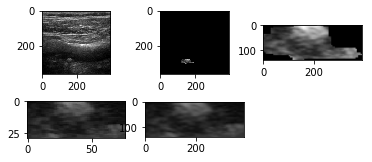

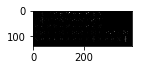

x 233
3815-AC_E_0
3815-AC_E_0.png
3815
E
[ 2.]


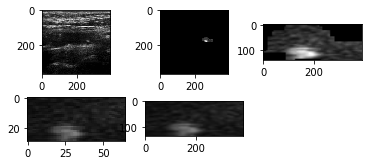

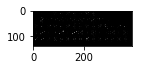

x 11
3090-AC_E_0
3090-AC_E_0.png
3090
E
[ 5.]


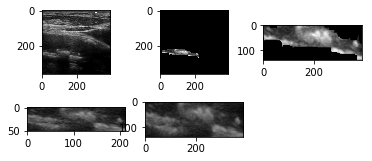

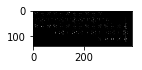

x 247
2754-AC_D_1
2754-AC_D_1.png
2754
D
[ 4.]


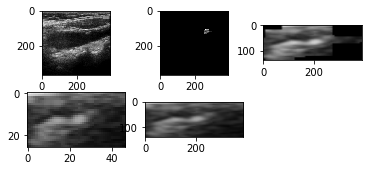

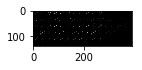

2
4084-AC2_E_2
4084-AC2_E_2.png
4084
E
[ 1.]


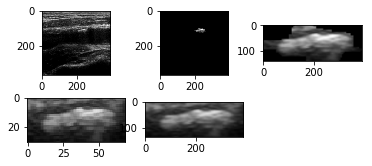

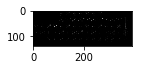

x 47
2468-AC_D_1
2468-AC_D_1.png
2468
D
[ 3.]


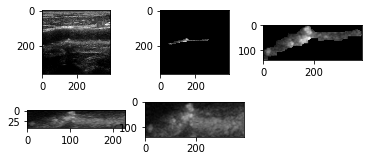

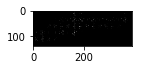

2
3612-AC2_D_1
3612-AC2_D_1.png
3612
D
[ 1.]


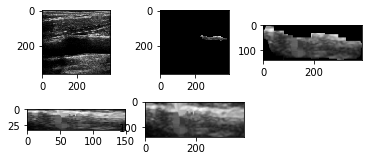

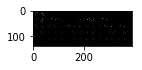

2
3087-AC2_E_1
3087-AC2_E_1.png
3087
E
[ 3.]


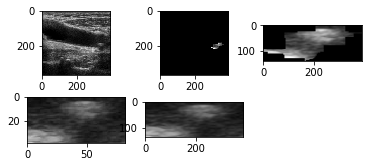

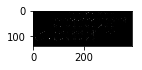

2
2183-AC2_D_0
2183-AC2_D_0.png
2183
D
[ 2.]


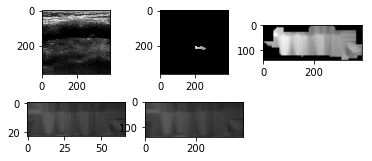

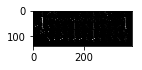

x 138
4000-AC_D_0
4000-AC_D_0.png
4000
D
[ nan]


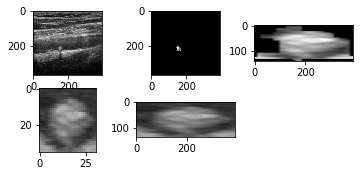

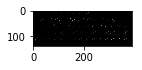

1
1850-AC1_E_0
1850-AC1_E_0.png
1850
E
[ 4.]


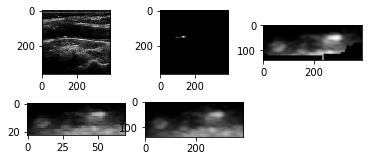

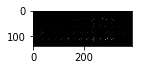

x 102
4013-AC_E_0
4013-AC_E_0.png
4013
E
[ 1.]


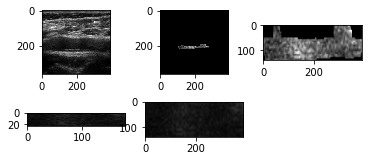

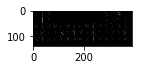

x 84
2855-AC_E_2
2855-AC_E_2.png
2855
E
[ 5.]


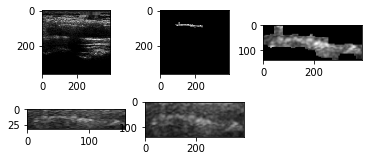

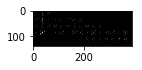

x 175
2943-AC_D_0
2943-AC_D_0.png
2943
D
[ 3.]


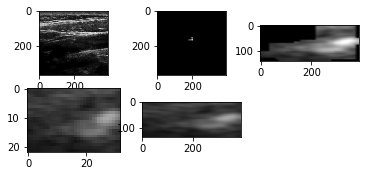

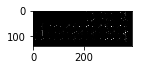

2
2421-AC2_E_1
2421-AC2_E_1.png
2421
E
[ 4.]


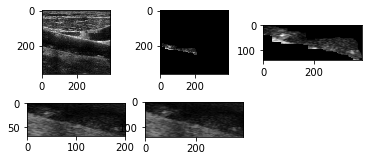

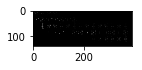

x 234
2883-AC_D_1
2883-AC_D_1.png
2883
D
[ 4.]


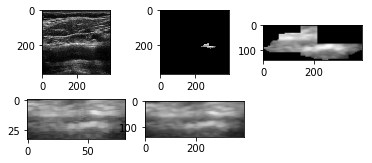

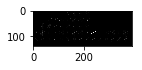

x 0
2094-AC_E_0
2094-AC_E_0.png
2094
E
[ 5.]


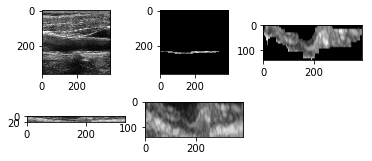

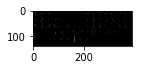

x 225
3690-AC_D_0
3690-AC_D_0.png
3690
D
[ 3.]


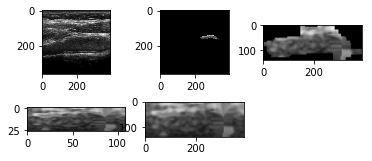

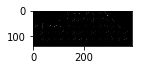

2
2906-AC2_D_1
2906-AC2_D_1.png
2906
D
[ 3.]


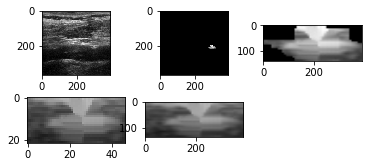

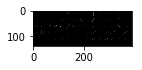

x 120
4062-AC_D_0
4062-AC_D_0.png
4062
D
[ 4.]


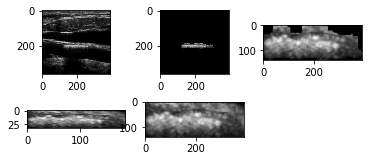

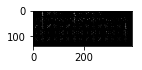

x 29
2916-AC_D_0
2916-AC_D_0.png
2916
D
[ nan]


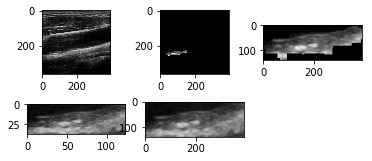

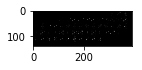

x 190
2087-AC_D_0
2087-AC_D_0.png
2087
D
[ 4.]


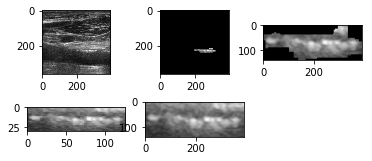

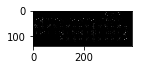

2
4003-AC2_E_1
4003-AC2_E_1.png
4003
E
[ 1.]


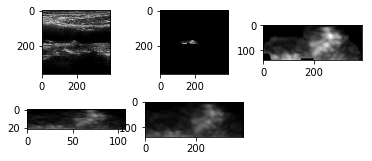

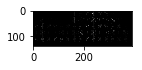

x 157
3940-AC_D_0
3940-AC_D_0.png
3940
D
[ 4.]


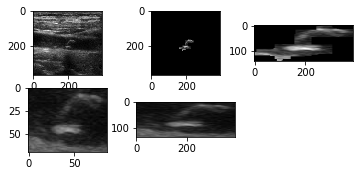

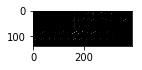

x 164
2921-AC_D_0
2921-AC_D_0.png
2921
D
[ 5.]


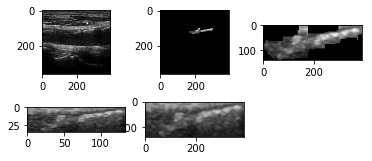

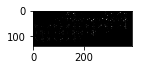

2
2286-AC2_D_0
2286-AC2_D_0.png
2286
D
[ 1.]


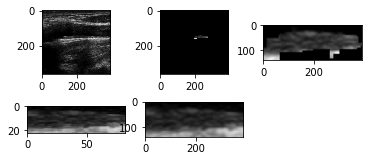

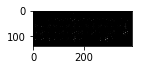

x 158
3129-AC_E_0
3129-AC_E_0.png
3129
E
[ 1.]


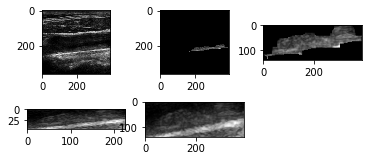

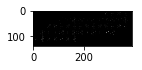

1
2373-AC1_D_3
2373-AC1_D_3.png
2373
D
[ 3.]


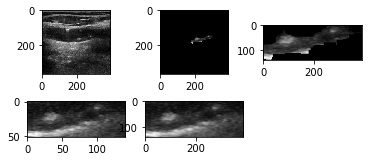

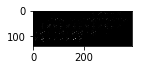

2
4123-AC2_E_0
4123-AC2_E_0.png
4123
E
[ 5.]


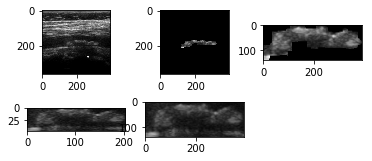

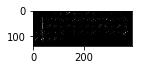

x 183
2483-AC_E_1
2483-AC_E_1.png
2483
E
[ 2.]


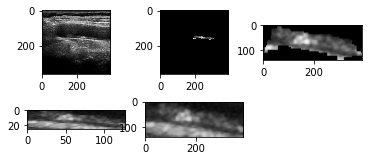

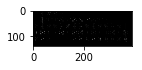

2
3840-AC2_E_1
3840-AC2_E_1.png
3840
E
[ 1.]


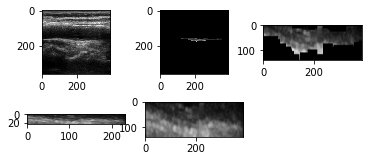

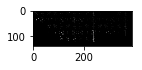

1
2400-AC1_E_0
2400-AC1_E_0.png
2400
E
[ 2.]


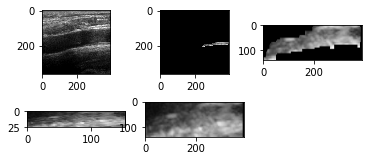

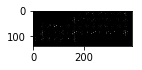

x 163
2267-AC_D_0
2267-AC_D_0.png
2267
D
[ 2.]


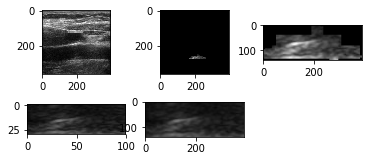

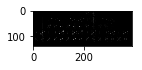

x 84
1852-AC_D_0
1852-AC_D_0.png
1852
D
[ nan]


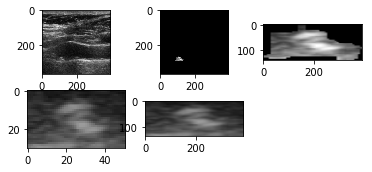

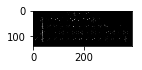

2
3492-AC2_E_2
3492-AC2_E_2.png
3492
E
[ 3.]


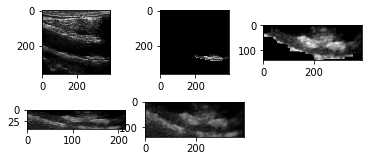

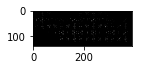

2
2512-AC2_D_0
2512-AC2_D_0.png
2512
D
[ 4.]


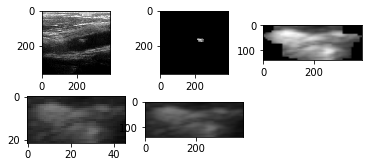

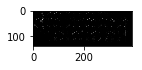

2
3416-AC2_E_1
3416-AC2_E_1.png
3416
E
[ 4.]


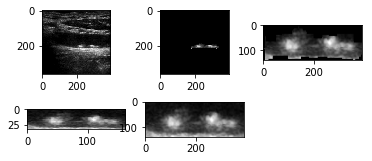

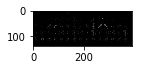

2
3830-AC2_E_1
3830-AC2_E_1.png
3830
E
[ 3.]


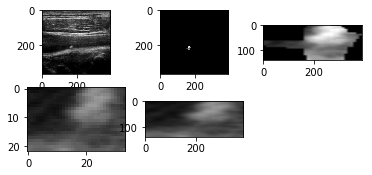

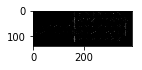

1
2636-AC1_D_1
2636-AC1_D_1.png
2636
D
[ 5.]


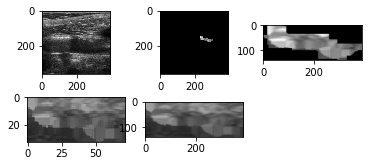

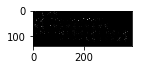

x 139
2373-AC_D_1
2373-AC_D_1.png
2373
D
[ 3.]


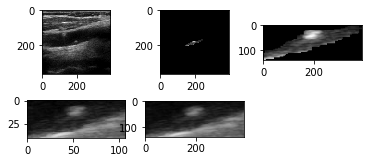

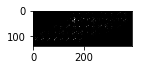

x 106
3068-AC_E_1
3068-AC_E_1.png
3068
E
[ 2.]


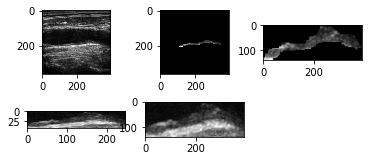

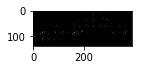

2
3830-AC2_E_0
3830-AC2_E_0.png
3830
E
[ 3.]


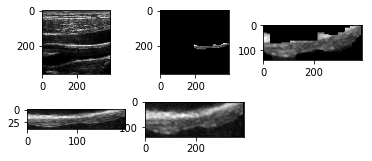

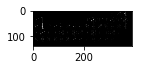

2
2204-AC2_E_0
2204-AC2_E_0.png
2204
E
[ 4.]


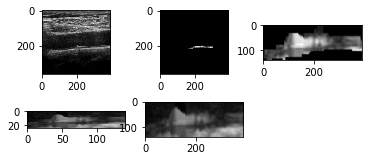

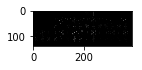

2
2927-AC2_E_1
2927-AC2_E_1.png
2927
E
[ 4.]


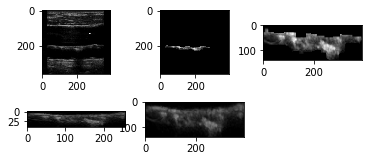

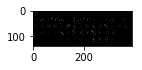

2
2754-AC2_E_0
2754-AC2_E_0.png
2754
E
[ 4.]


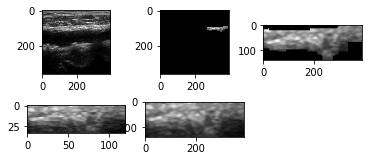

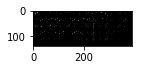

x 88
1983-AC_D_2
1983-AC_D_2.png
1983
D
[ 5.]


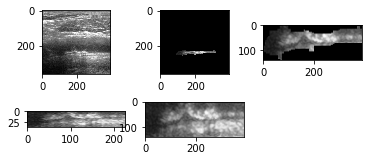

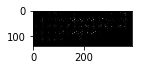

2
2400-AC2_D_1
2400-AC2_D_1.png
2400
D
[ 1.]


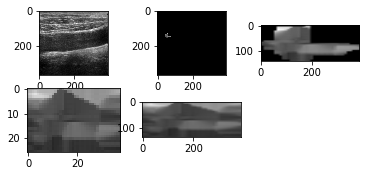

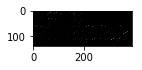

2
2835-AC2_E_1
2835-AC2_E_1.png
2835
E
[ 2.]


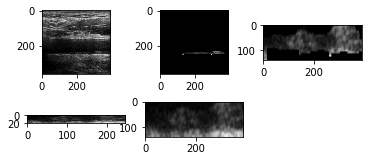

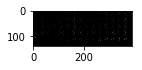

2
2289-AC2_E_0
2289-AC2_E_0.png
2289
E
[ 2.]


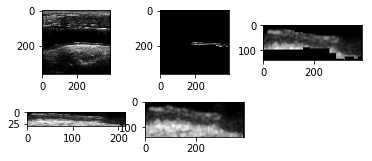

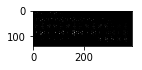

x 110
2921-AC_D_1
2921-AC_D_1.png
2921
D
[ 5.]


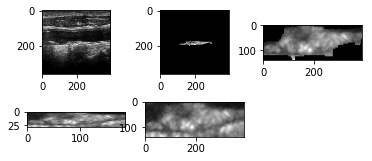

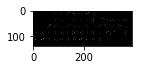

2
2348-AC2_E_0
2348-AC2_E_0.png
2348
E
[ 1.]


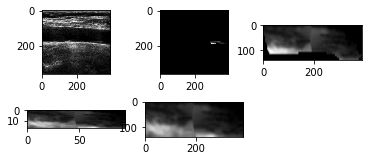

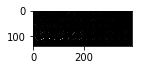

2
4003-AC2_E_0
4003-AC2_E_0.png
4003
E
[ 1.]


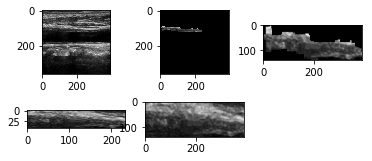

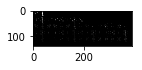

1
2347-AC1_E_1
2347-AC1_E_1.png
2347
E
[ nan]


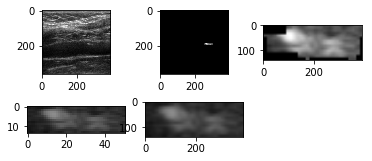

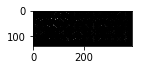

x 241
2163-AC_E_0
2163-AC_E_0.png
2163
E
[ 2.]


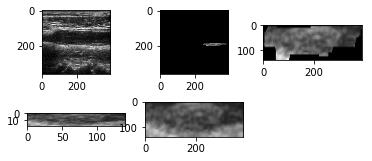

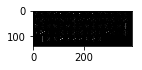

x 102
2636-AC_E_0
2636-AC_E_0.png
2636
E
[ 3.]


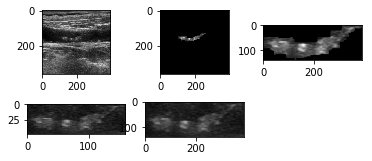

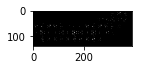

2
2421-AC2_E_0
2421-AC2_E_0.png
2421
E
[ 4.]


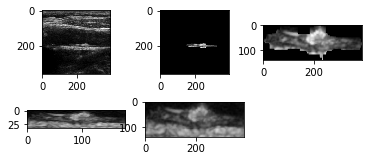

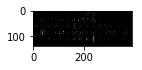

2
2171-AC2_E_0
2171-AC2_E_0.png
2171
E
[ 4.]


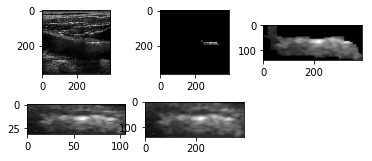

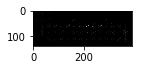

x 66
2984-AC_E_0
2984-AC_E_0.png
2984
E
[ 5.]


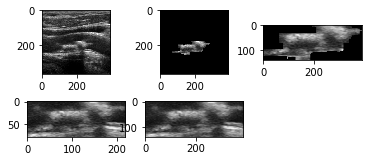

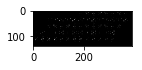

x 194
2974-AC_D_1
2974-AC_D_1.png
2974
D
[ 3.]


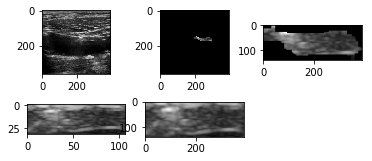

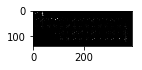

2
3118-AC2_E_0
3118-AC2_E_0.png
3118
E
[ 2.]


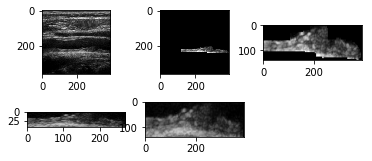

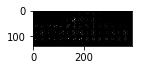

x 124
2974-AC_D_3
2974-AC_D_3.png
2974
D
[ 3.]


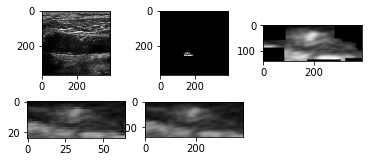

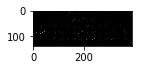

2
3664-AC2_E_0
3664-AC2_E_0.png
3664
E
[ 4.]


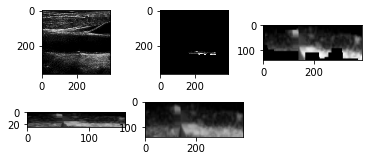

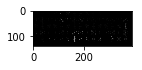

2
2076-AC2_E_0
2076-AC2_E_0.png
2076
E
[ 4.]


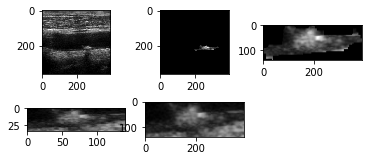

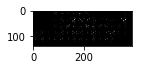

x 89
2634-AC_D_0
2634-AC_D_0.png
2634
D
[ 4.]


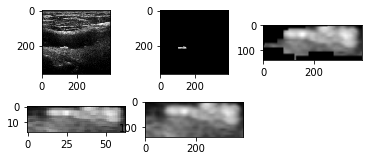

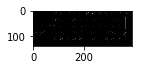

1
2850-AC1_D_1
2850-AC1_D_1.png
2850
D
[ nan]


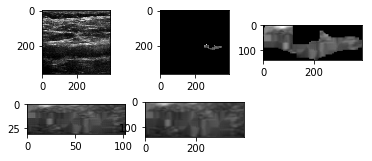

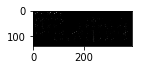

2
1808-AC2_E_1
1808-AC2_E_1.png
1808
E
[ 1.]


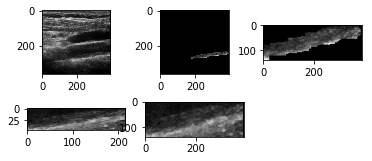

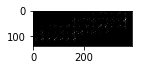

2
3659-AC2_D_0
3659-AC2_D_0.png
3659
D
[ 1.]


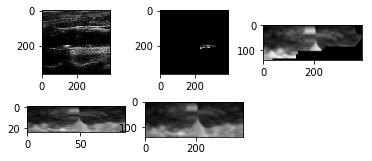

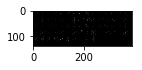

x 142
2230-AC_E_1
2230-AC_E_1.png
2230
E
[ 4.]


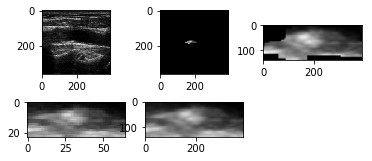

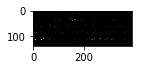

2
2850-AC2_E_1
2850-AC2_E_1.png
2850
E
[ 5.]


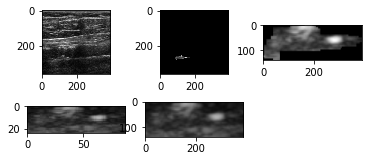

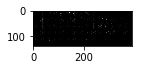

x 6
3708-AC_D_1
3708-AC_D_1.png
3708
D
[ 5.]


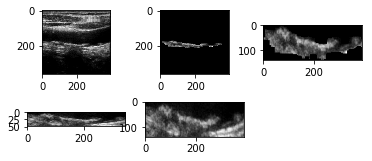

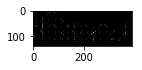

2
2261-AC2_E_0
2261-AC2_E_0.png
2261
E
[ 4.]


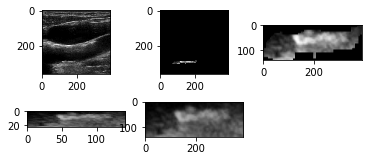

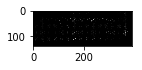

x 0
1884-AC_E_0
1884-AC_E_0.png
1884
E
[ 4.]


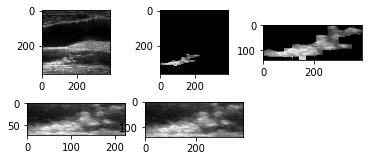

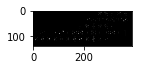

1
3130-AC1_E_0
3130-AC1_E_0.png
3130
E
[ nan]


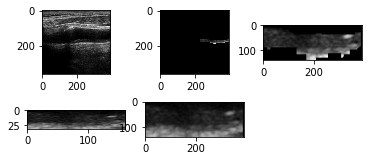

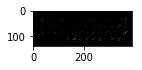

x 230
2400-AC_D_0
2400-AC_D_0.png
2400
D
[ 1.]


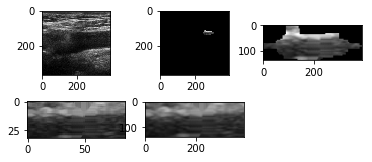

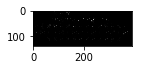

x 0
3828-AC_E_1
3828-AC_E_1.png
3828
E
[ 2.]


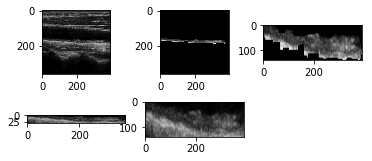

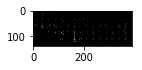

x 114
1850-AC_E_0
1850-AC_E_0.png
1850
E
[ 4.]


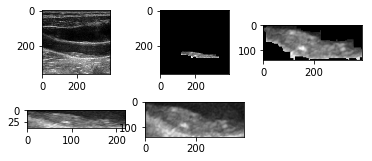

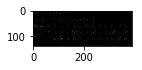

x 230
2849-AC_E_1
2849-AC_E_1.png
2849
E
[ 3.]


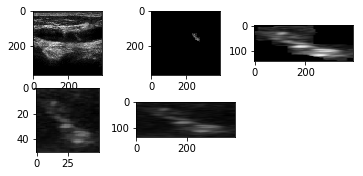

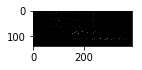

2
3492-AC2_E_0
3492-AC2_E_0.png
3492
E
[ 3.]


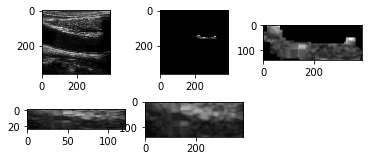

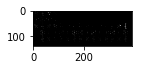

x 175
2530-AC_E_0
2530-AC_E_0.png
2530
E
[ 1.]


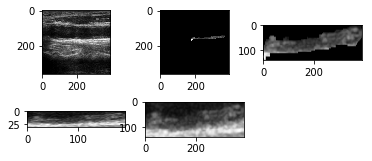

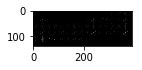

x 265
2392-AC_E_1
2392-AC_E_1.png
2392
E
[ 3.]


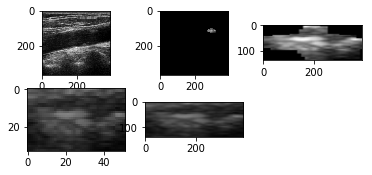

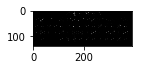

2
2261-AC2_E_1
2261-AC2_E_1.png
2261
E
[ 4.]


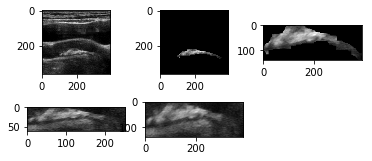

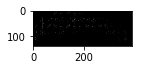

x 143
1884-AC_E_1
1884-AC_E_1.png
1884
E
[ 4.]


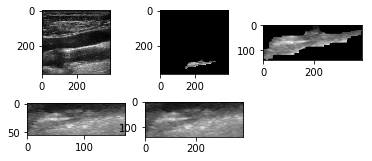

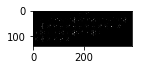

1
2507-AC1_E_0
2507-AC1_E_0.png
2507
E
[ nan]


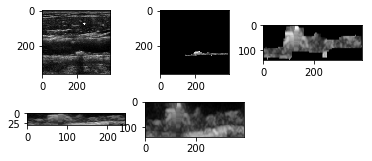

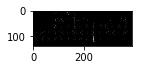

2
2850-AC2_E_0
2850-AC2_E_0.png
2850
E
[ 5.]


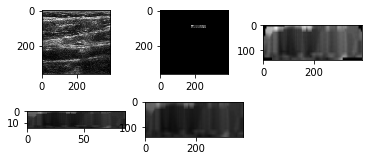

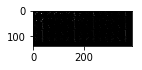

x 0
2455-AC_D_0
2455-AC_D_0.png
2455
D
[ 5.]


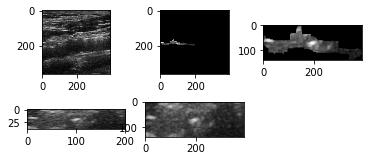

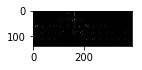

2
2507-AC2_D_0
2507-AC2_D_0.png
2507
D
[ 3.]


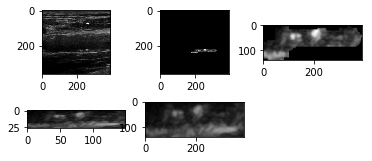

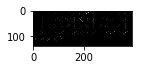

2
3403-AC2_E_1
3403-AC2_E_1.png
3403
E
[ 5.]


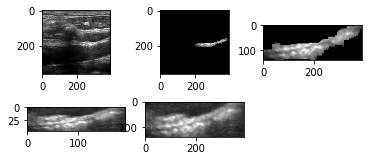

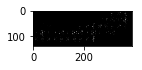

x 68
3410-AC_E_0
3410-AC_E_0.png
3410
E
[ 4.]


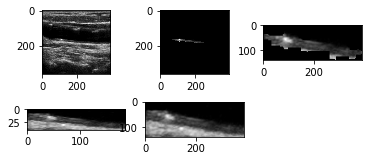

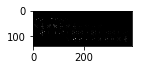

x 211
2586-AC_E_1
2586-AC_E_1.png
2586
E
[ 4.]


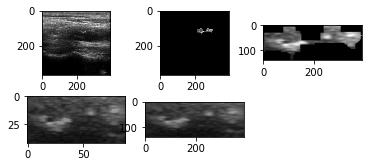

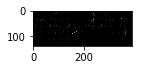

x 70
2634-AC_D_1
2634-AC_D_1.png
2634
D
[ 4.]


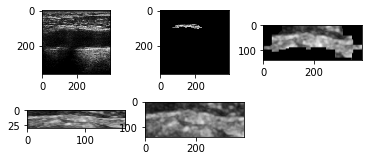

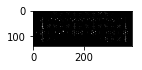

2
2427-AC2_D_1
2427-AC2_D_1.png
2427
D
[ 5.]


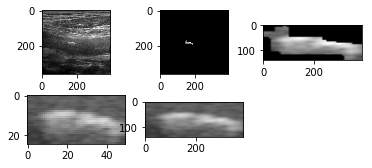

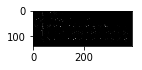

x 302
4083-AC_E_1
4083-AC_E_1.png
4083
E
[ 1.]


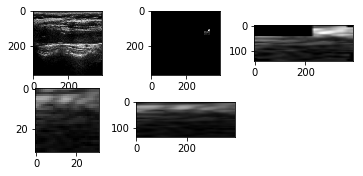

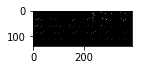

x 212
3690-AC_D_2
3690-AC_D_2.png
3690
D
[ 3.]


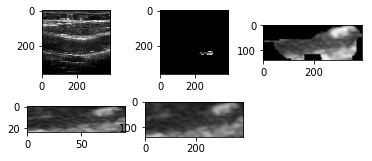

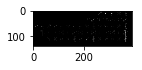

x 120
2338-AC_E_1
2338-AC_E_1.png
2338
E
[ 2.]


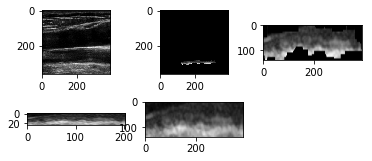

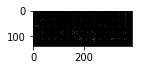

1
2760-AC1_E_0
2760-AC1_E_0.png
2760
E
[ 3.]


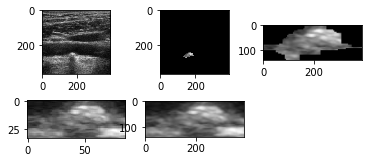

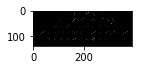

1
3498-AC1_E_0
3498-AC1_E_0.png
3498
E
[ 1.]


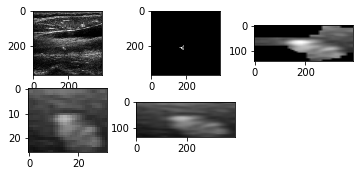

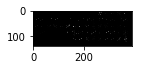

x 138
3387-AC_D_0
3387-AC_D_0.png
3387
D
[ 3.]


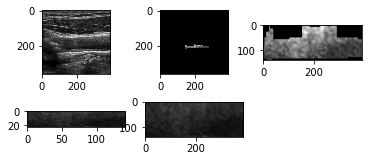

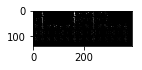

2
2511-AC2_E_1
2511-AC2_E_1.png
2511
E
[ 3.]


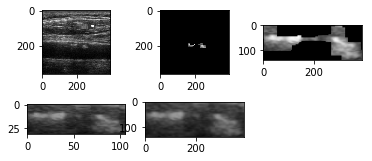

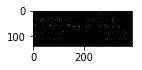

x 84
2109-AC_E_1
2109-AC_E_1.png
2109
E
[ 2.]


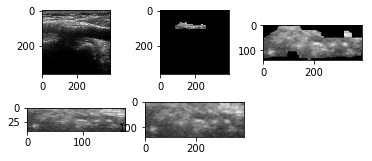

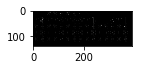

2
3145-AC2_D_0
3145-AC2_D_0.png
3145
D
[ 3.]


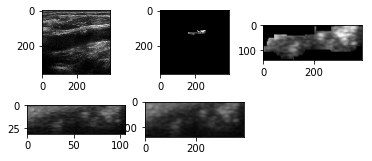

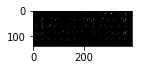

1
2460-AC1_E_1
2460-AC1_E_1.png
2460
E
[ 1.]


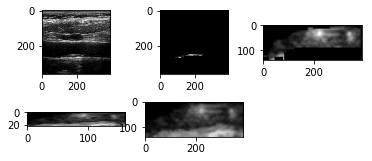

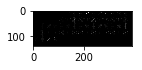

x 102
2421-AC_E_1
2421-AC_E_1.png
2421
E
[ 3.]


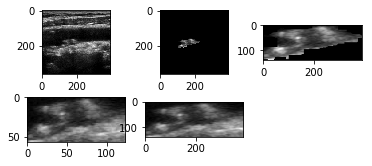

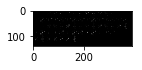

x 235
3198-AC_D_0
3198-AC_D_0.png
3198
D
[ 4.]


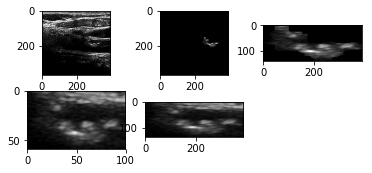

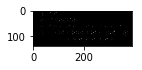

x 121
3071-AC_E_2
3071-AC_E_2.png
3071
E
[ 3.]


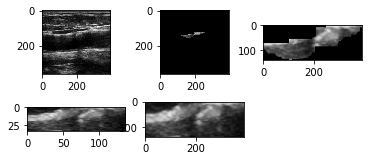

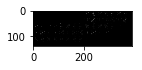

x 102
3046-AC_E_2
3046-AC_E_2.png
3046
E
[ 2.]


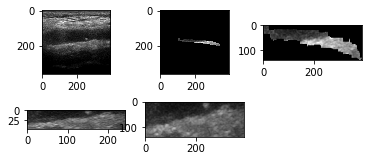

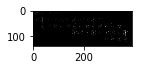

x 65
3806-AC_E_1
3806-AC_E_1.png
3806
E
[ 4.]


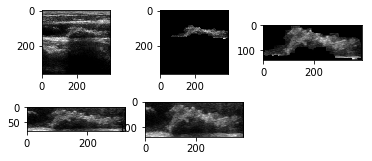

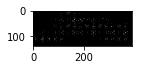

x 11
2025-AC_D_0
2025-AC_D_0.png
2025
D
[ 4.]


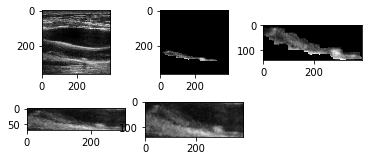

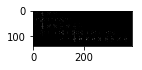

2
3428-AC2_E_0
3428-AC2_E_0.png
3428
E
[ 3.]


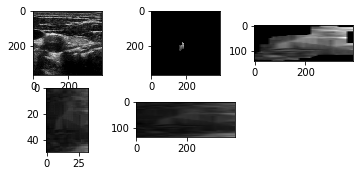

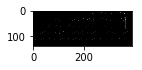

1
2441-AC1_D_0
2441-AC1_D_0.png
2441
D
[ 2.]


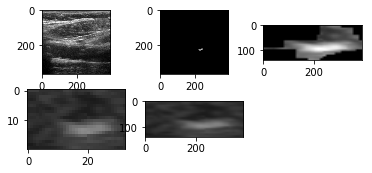

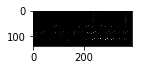

x 158
4052-AC_E_1
4052-AC_E_1.png
4052
E
[ 4.]


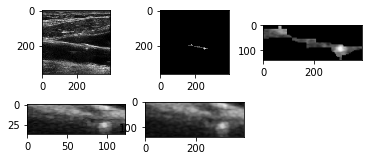

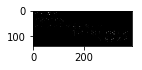

x 110
2468-AC_E_0
2468-AC_E_0.png
2468
E
[ 3.]


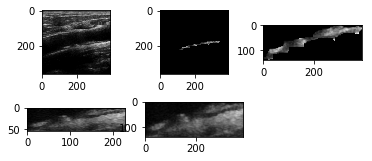

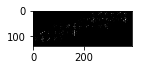

2
2441-AC2_E_0
2441-AC2_E_0.png
2441
E
[ 3.]


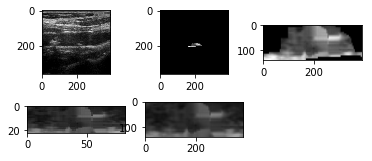

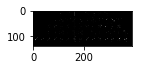

x 236
1908-AC_E_0
1908-AC_E_0.png
1908
E
[ 5.]


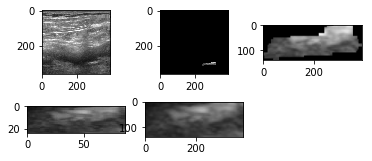

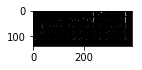

x 265
1908-AC_E_1
1908-AC_E_1.png
1908
E
[ 5.]


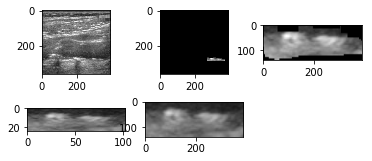

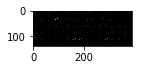

2
2092-AC2_E_0
2092-AC2_E_0.png
2092
E
[ 3.]


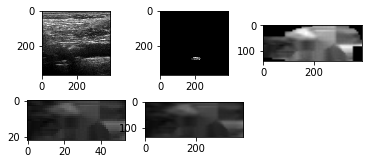

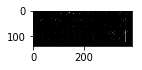

x 105
2631-AC_D_1
2631-AC_D_1.png
2631
D
[ 2.]


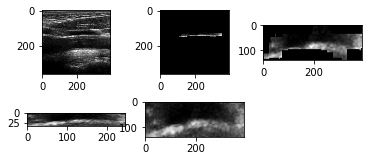

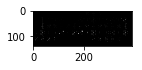

1
2441-AC1_D_1
2441-AC1_D_1.png
2441
D
[ 2.]


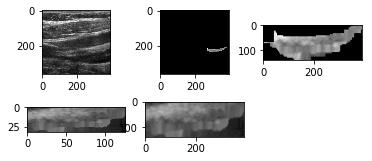

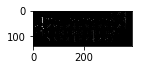

2
3428-AC2_E_1
3428-AC2_E_1.png
3428
E
[ 3.]


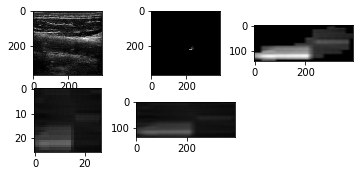

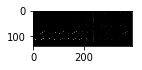

1
2700-AC1_E_2
2700-AC1_E_2.png
2700
E
[ nan]


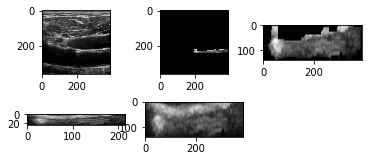

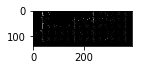

2
4063-AC2_E_1
4063-AC2_E_1.png
4063
E
[ 3.]


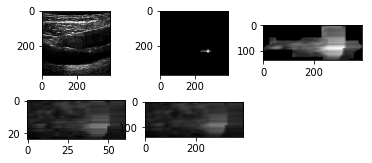

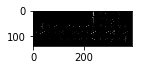

x 102
3488-AC_E_0
3488-AC_E_0.png
3488
E
[ 1.]


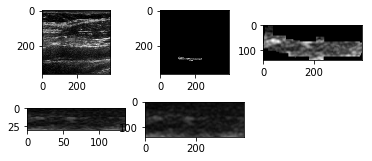

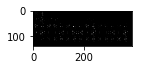

x 211
3806-AC_E_0
3806-AC_E_0.png
3806
E
[ 4.]


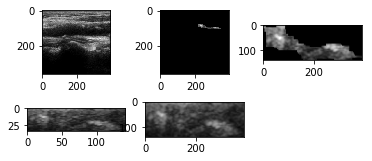

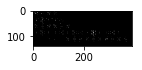

x 200
2109-AC_E_0
2109-AC_E_0.png
2109
E
[ 2.]


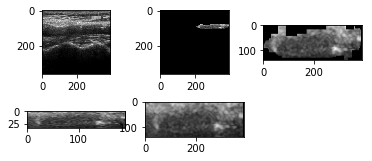

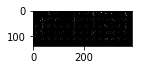

2
3145-AC2_D_1
3145-AC2_D_1.png
3145
D
[ 3.]


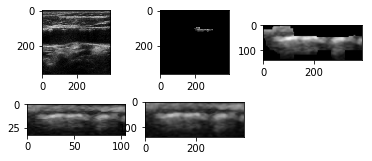

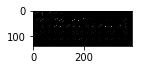

1
3156-AC1_D_1
3156-AC1_D_1.png
3156
D
[ 4.]


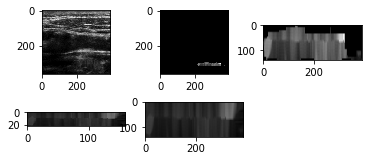

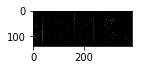

1
3498-AC1_E_1
3498-AC1_E_1.png
3498
E
[ 1.]


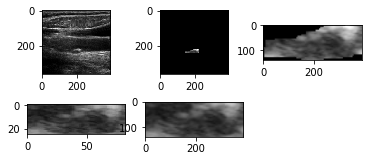

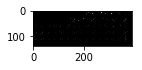

1
3752-AC1_E_0
3752-AC1_E_0.png
3752
E
[ nan]


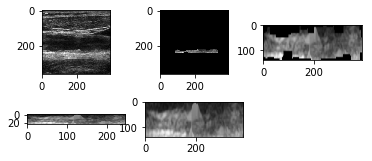

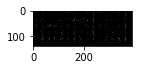

2
3752-AC2_D_0
3752-AC2_D_0.png
3752
D
[ 3.]


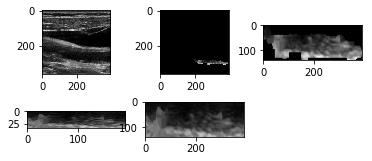

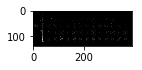

x 314
1921-AC_D_0
1921-AC_D_0.png
1921
D
[ 4.]


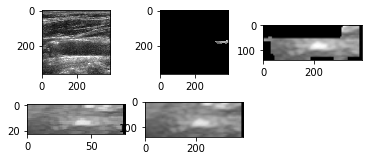

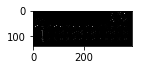

x 167
2441-AC_D_0
2441-AC_D_0.png
2441
D
[ 2.]


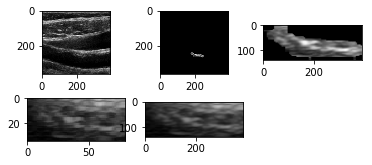

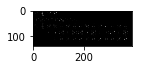

1
3752-AC1_E_2
3752-AC1_E_2.png
3752
E
[ nan]


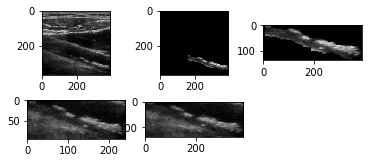

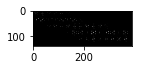

1
1818-AC1_D_0
1818-AC1_D_0.png
1818
D
[ nan]


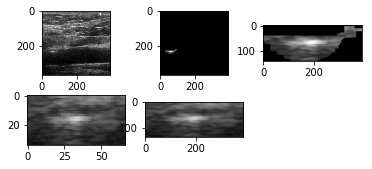

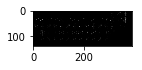

2
2561-AC2_E_2
2561-AC2_E_2.png
2561
E
[ 3.]


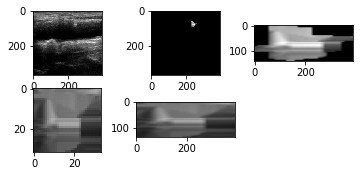

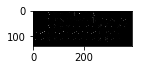

1
1817-AC1_E_1
1817-AC1_E_1.png
1817
E
[ 4.]


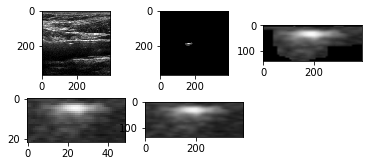

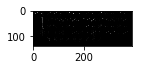

x 157
1905-AC_E_0
1905-AC_E_0.png
1905
E
[ 3.]


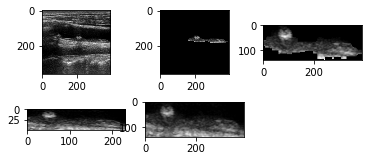

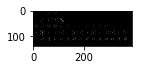

x 24
2271-AC_E_0
2271-AC_E_0.png
2271
E
[ 3.]


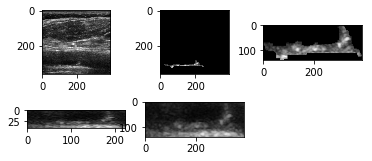

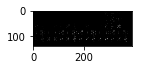

x 85
2365-AC_E_0
2365-AC_E_0.png
2365
E
[ 5.]


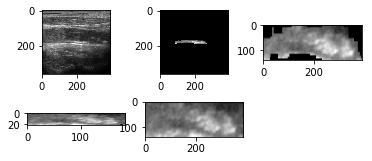

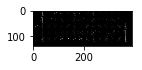

2
2586-AC2_D_1
2586-AC2_D_1.png
2586
D
[ 3.]


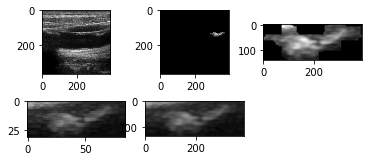

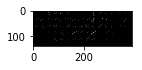

2
2290-AC2_E_0
2290-AC2_E_0.png
2290
E
[ 1.]


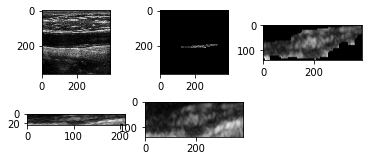

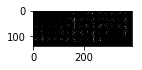

2
3249-AC2_D_0
3249-AC2_D_0.png
3249
D
[ 4.]


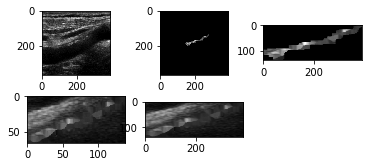

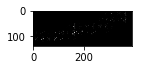

2
4164-AC2_E_1
4164-AC2_E_1.png
4164
E
[ 1.]


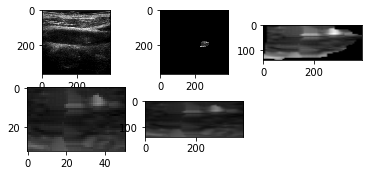

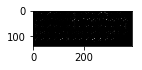

x 265
4183-AC_E_1
4183-AC_E_1.png
4183
E
[ 4.]


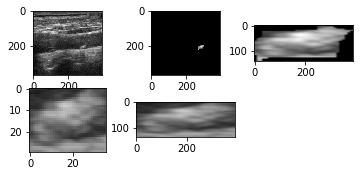

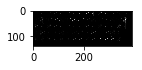

2
2174-AC2_E_1
2174-AC2_E_1.png
2174
E
[ 4.]


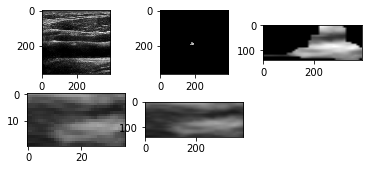

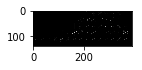

2
2546-AC2_E_1
2546-AC2_E_1.png
2546
E
[ 2.]


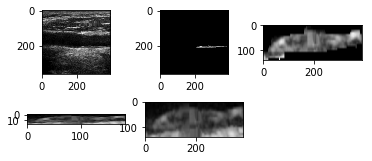

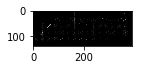

x 154
1919-AC_E_1
1919-AC_E_1.png
1919
E
[ 3.]


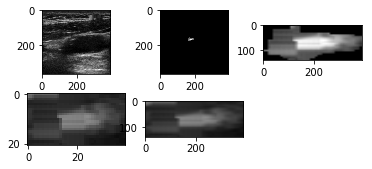

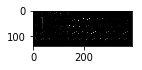

2
4114-AC2_E_1
4114-AC2_E_1.png
4114
E
[ 4.]


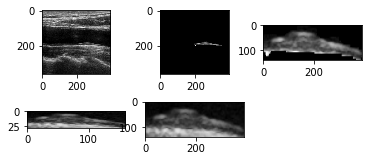

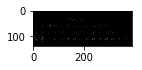

2
4097-AC2_E_1
4097-AC2_E_1.png
4097
E
[ 2.]


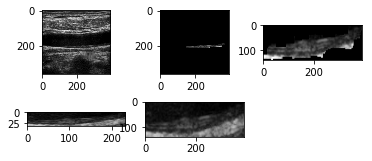

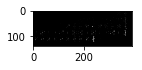

x 142
4097-AC_E_0
4097-AC_E_0.png
4097
E
[ 1.]


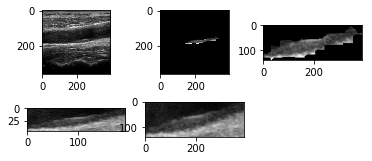

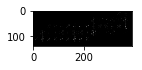

2
4084-AC2_D_1
4084-AC2_D_1.png
4084
D
[ 2.]


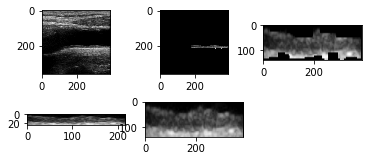

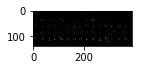

x 150
4084-AC_D_0
4084-AC_D_0.png
4084
D
[ 4.]


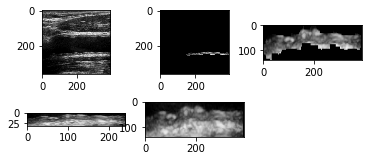

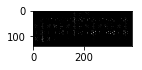

1
2700-AC1_E_1
2700-AC1_E_1.png
2700
E
[ nan]


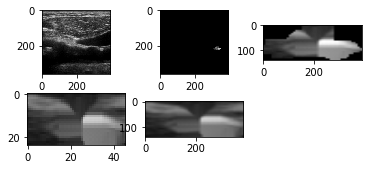

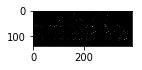

x 13
2175-AC_D_0
2175-AC_D_0.png
2175
D
[ 4.]


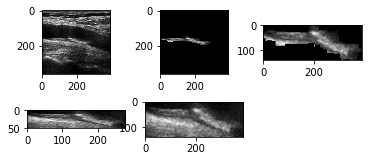

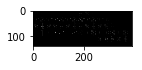

2
2069-AC2_D_1
2069-AC2_D_1.png
2069
D
[ 1.]


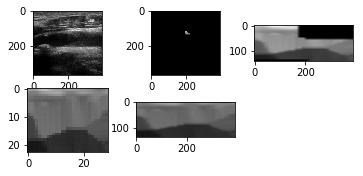

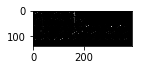

2
1954-AC2_E_1
1954-AC2_E_1.png
1954
E
[ 4.]


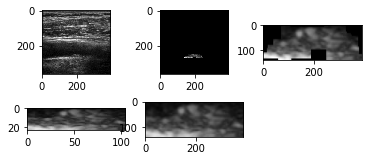

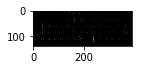

2
3394-AC2_D_0
3394-AC2_D_0.png
3394
D
[ 3.]


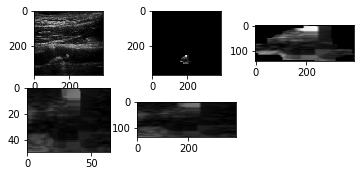

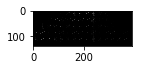

2
1919-AC2_D_1
1919-AC2_D_1.png
1919
D
[ 3.]


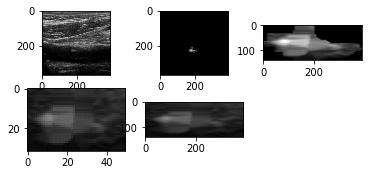

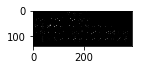

2
3927-AC2_E_0
3927-AC2_E_0.png
3927
E
[ 3.]


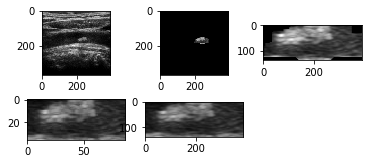

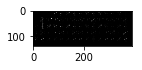

1
2586-AC1_E_0
2586-AC1_E_0.png
2586
E
[ 4.]


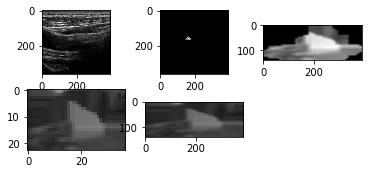

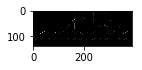

x 78
2386-AC_E_0
2386-AC_E_0.png
2386
E
[ 2.]


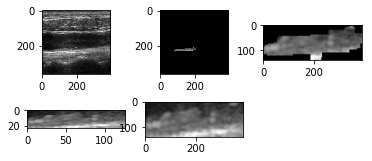

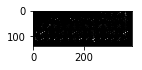

x 6
2513-AC_E_1
2513-AC_E_1.png
2513
E
[ 2.]


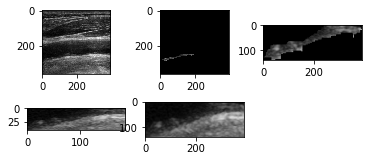

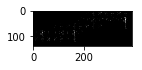

x 47
3291-AC_E_0
3291-AC_E_0.png
3291
E
[ 5.]


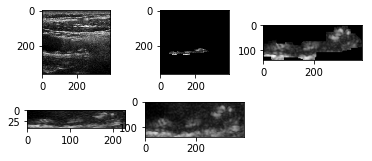

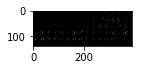

x 177
2465-AC_E_1
2465-AC_E_1.png
2465
E
[ 1.]


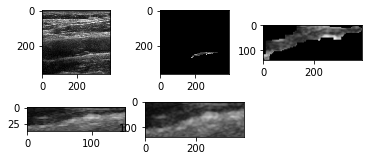

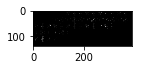

2
1817-AC2_D_0
1817-AC2_D_0.png
1817
D
[ 2.]


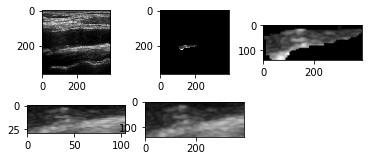

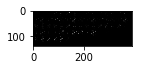

1
2853-AC1_E_1
2853-AC1_E_1.png
2853
E
[ nan]


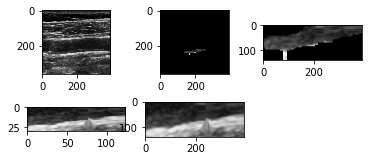

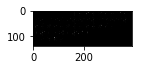

x 138
2512-AC_D_0
2512-AC_D_0.png
2512
D
[ 2.]


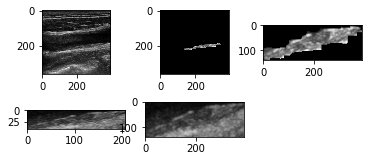

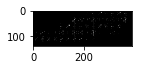

1
2831-AC1_E_2
2831-AC1_E_2.png
2831
E
[ 4.]


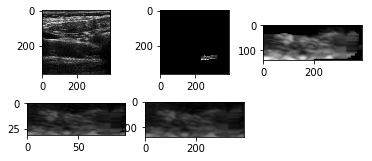

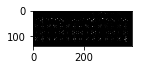

2
1980-AC2_E_0
1980-AC2_E_0.png
1980
E
[ 2.]


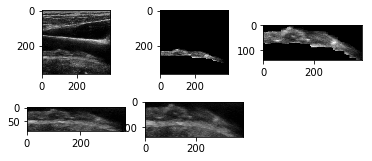

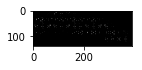

1
2634-AC1_D_1
2634-AC1_D_1.png
2634
D
[ 4.]


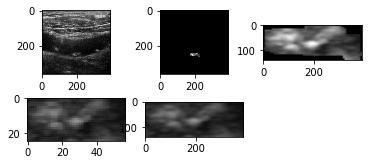

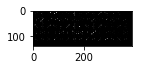

x 162
2254-AC_E_0
2254-AC_E_0.png
2254
E
[ 4.]


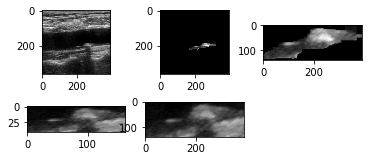

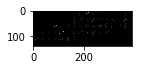

x 102
2561-AC_D_2
2561-AC_D_2.png
2561
D
[ 5.]


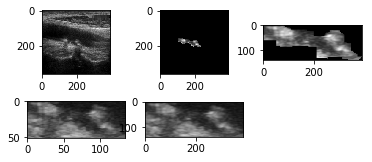

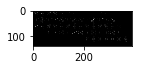

x 265
3118-AC_E_2
3118-AC_E_2.png
3118
E
[ 1.]


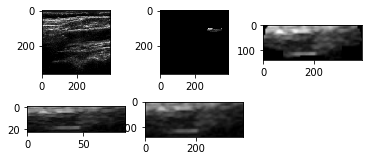

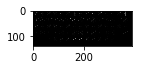

x 117
3283-AC_E_1
3283-AC_E_1.png
3283
E
[ 1.]


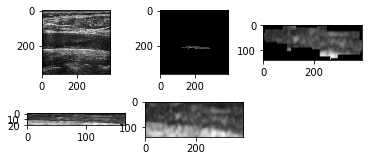

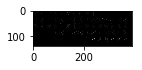

2
4163-AC2_E_1
4163-AC2_E_1.png
4163
E
[ 2.]


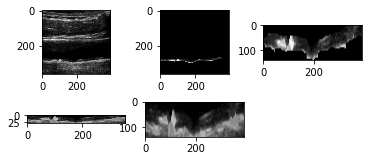

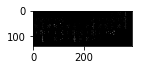

x 91
2831-AC_E_0
2831-AC_E_0.png
2831
E
[ 4.]


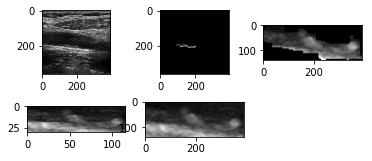

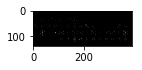

2
2609-AC2_D_1
2609-AC2_D_1.png
2609
D
[ 1.]


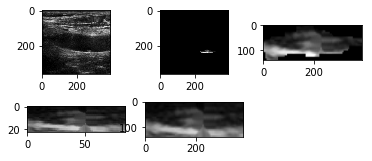

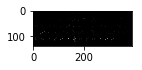

2
3198-AC2_D_0
3198-AC2_D_0.png
3198
D
[ 4.]


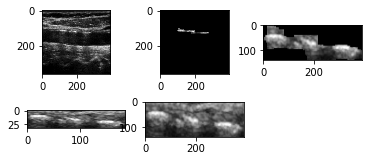

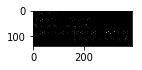

x 177
3911-AC_E_0
3911-AC_E_0.png
3911
E
[ 3.]


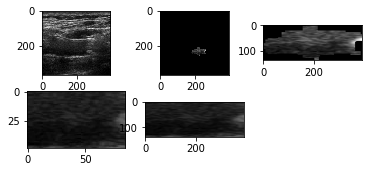

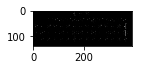

2
3912-AC2_E_0
3912-AC2_E_0.png
3912
E
[ 3.]


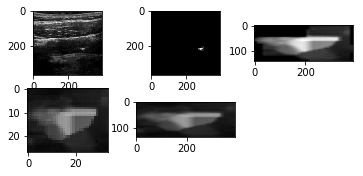

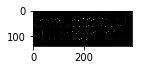

2
4062-AC2_D_0
4062-AC2_D_0.png
4062
D
[ 5.]


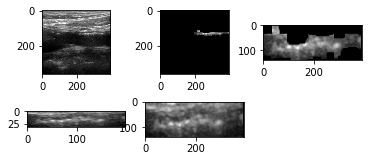

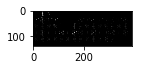

2
2816-AC2_D_0
2816-AC2_D_0.png
2816
D
[ 2.]


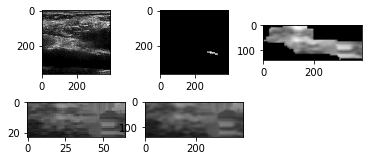

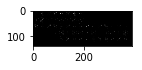

2
3761-AC2_E_0
3761-AC2_E_0.png
3761
E
[ 1.]


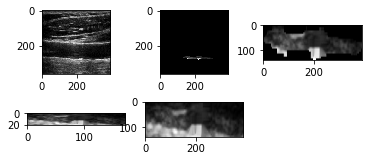

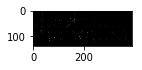

x 0
3832-AC_E_1
3832-AC_E_1.png
3832
E
[ 3.]


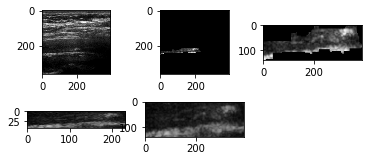

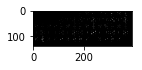

x 11
3701-AC_E_0
3701-AC_E_0.png
3701
E
[ 1.]


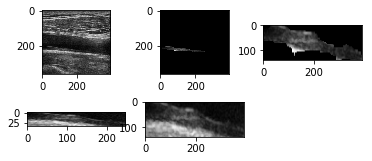

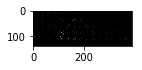

x 12
2773-AC_D_0
2773-AC_D_0.png
2773
D
[ 5.]


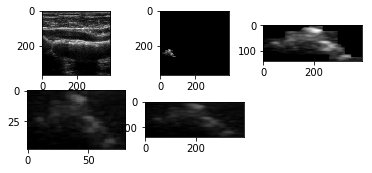

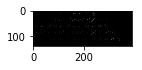

x 43
1859-AC_D_0
1859-AC_D_0.png
1859
D
[ nan]


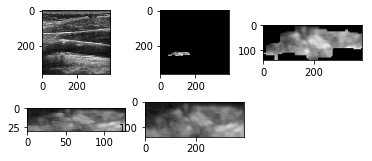

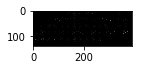

2
2011-AC2_E_0
2011-AC2_E_0.png
2011
E
[ 3.]


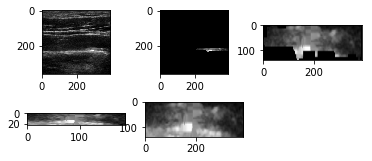

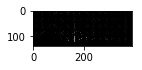

x 193
3960-AC_D_1
3960-AC_D_1.png
3960
D
[ 1.]


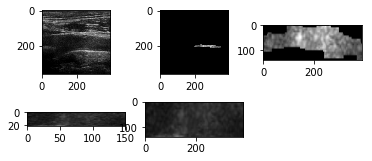

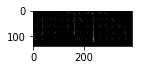

x 157
3131-AC_D_0
3131-AC_D_0.png
3131
D
[ 1.]


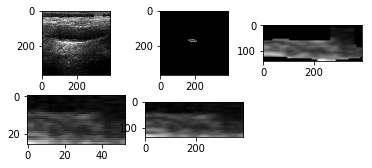

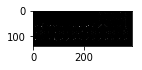

x 77
2831-AC_E_1
2831-AC_E_1.png
2831
E
[ 4.]


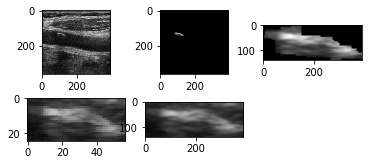

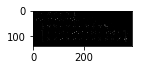

x 231
4066-AC_E_1
4066-AC_E_1.png
4066
E
[ 5.]


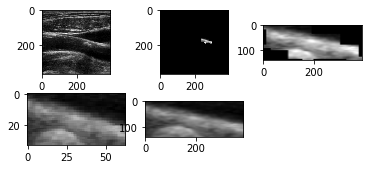

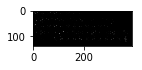

1
2609-AC1_E_0
2609-AC1_E_0.png
2609
E
[ nan]


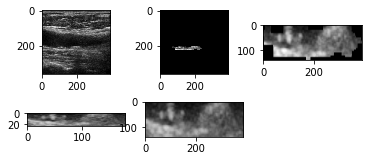

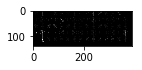

2
2279-AC2_D_1
2279-AC2_D_1.png
2279
D
[ 4.]


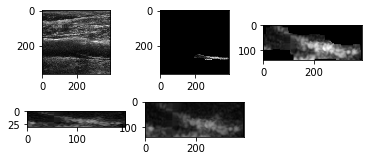

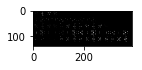

2
3499-AC2_E_0
3499-AC2_E_0.png
3499
E
[ 1.]


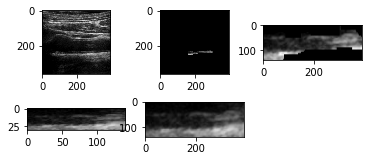

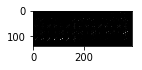

2
3832-AC2_E_0
3832-AC2_E_0.png
3832
E
[ 2.]


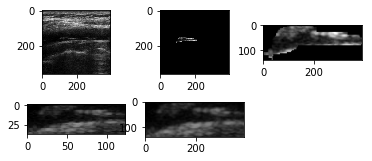

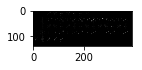

2
1980-AC2_E_1
1980-AC2_E_1.png
1980
E
[ 2.]


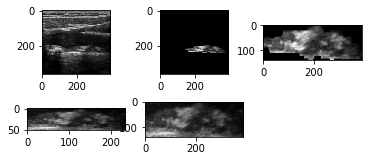

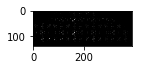

1
2480-AC1_D_0
2480-AC1_D_0.png
2480
D
[ 5.]


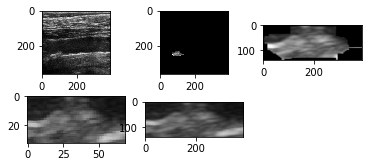

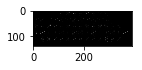

x 138
2534-AC_D_1
2534-AC_D_1.png
2534
D
[ 1.]


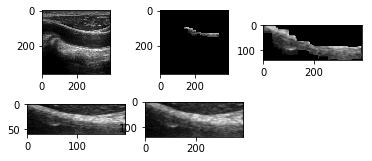

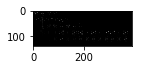

1
2831-AC1_E_1
2831-AC1_E_1.png
2831
E
[ 4.]


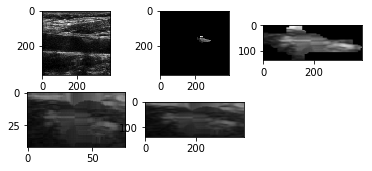

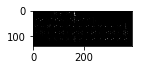

2
2822-AC2_E_1
2822-AC2_E_1.png
2822
E
[ 4.]


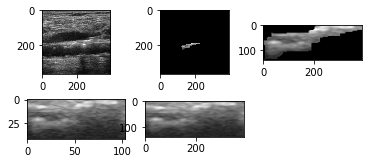

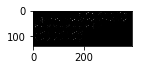

x 199
3271-AC_E_1
3271-AC_E_1.png
3271
E
[ 4.]


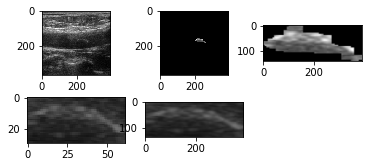

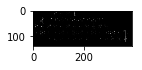

2
2468-AC2_E_0
2468-AC2_E_0.png
2468
E
[ 5.]


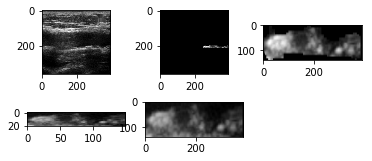

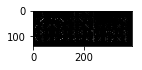

2
2632-AC2_D_0
2632-AC2_D_0.png
2632
D
[ 2.]


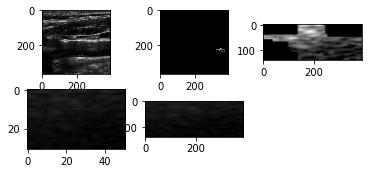

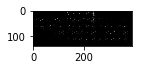

x 261
3666-AC_E_0
3666-AC_E_0.png
3666
E
[ 3.]


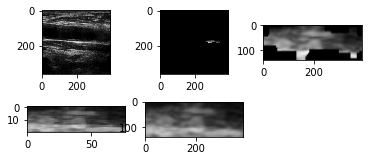

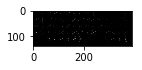

2
3907-AC2_E_1
3907-AC2_E_1.png
3907
E
[ 1.]


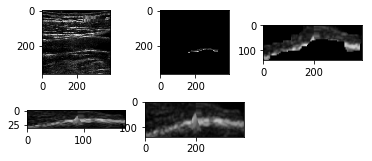

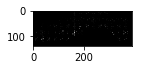

x 297
4163-AC_E_1
4163-AC_E_1.png
4163
E
[ 4.]


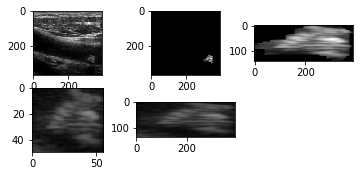

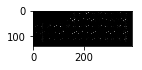

2
4099-AC2_E_0
4099-AC2_E_0.png
4099
E
[ 3.]


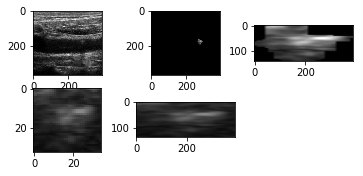

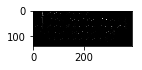

x 193
2141-AC_D_0
2141-AC_D_0.png
2141
D
[ 4.]


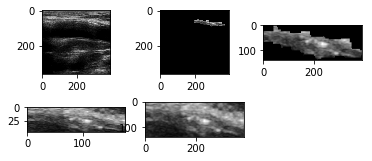

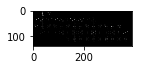

x 11
2773-AC_D_2
2773-AC_D_2.png
2773
D
[ 5.]


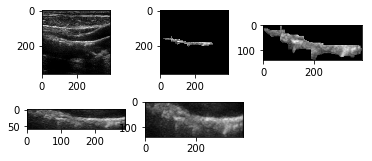

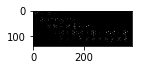

x 29
1988-AC_D_1
1988-AC_D_1.png
1988
D
[ 4.]


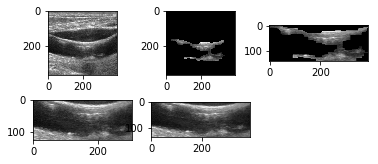

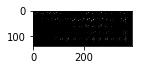

x 193
3703-AC_D_0
3703-AC_D_0.png
3703
D
[ 5.]


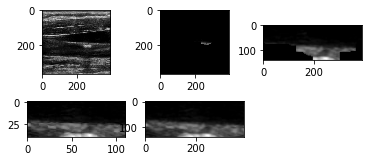

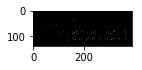

2
3806-AC2_D_0
3806-AC2_D_0.png
3806
D
[ 2.]


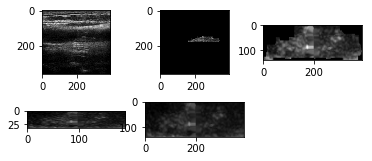

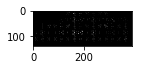

x 213
2954-AC_D_2
2954-AC_D_2.png
2954
D
[ 4.]


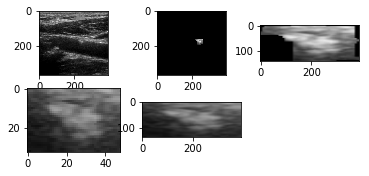

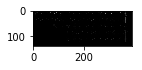

2
2860-AC2_E_1
2860-AC2_E_1.png
2860
E
[ 2.]


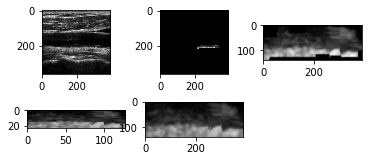

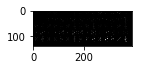

x 213
2762-AC_D_1
2762-AC_D_1.png
2762
D
[ 3.]


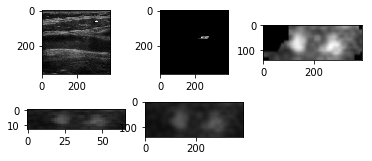

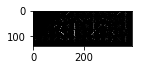

x 193
1988-AC_D_0
1988-AC_D_0.png
1988
D
[ 4.]


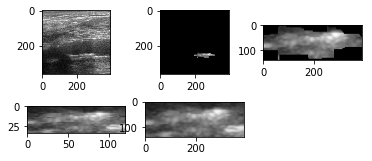

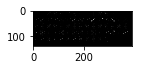

2
3198-AC2_D_2
3198-AC2_D_2.png
3198
D
[ 4.]


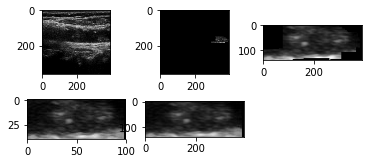

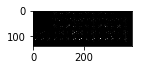

x 138
2092-AC_E_0
2092-AC_E_0.png
2092
E
[ 3.]


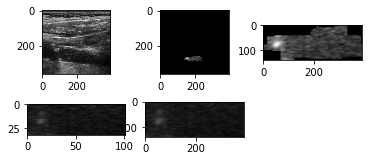

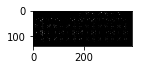

1
3450-AC1_E_0
3450-AC1_E_0.png
3450
E
[ nan]


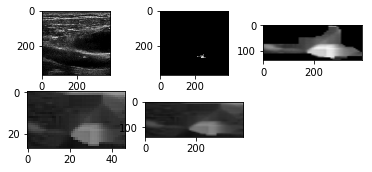

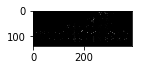

x 137
2545-AC_E_0
2545-AC_E_0.png
2545
E
[ 2.]


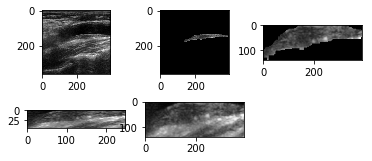

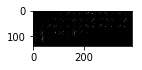

x 121
3118-AC_E_0
3118-AC_E_0.png
3118
E
[ 1.]


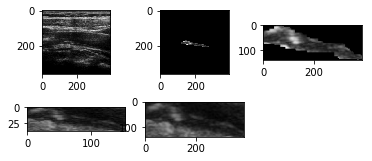

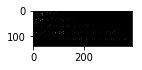

x 47
3486-AC_E_1
3486-AC_E_1.png
3486
E
[ 1.]


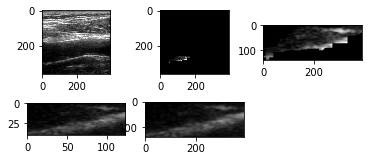

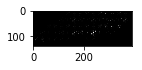

2
2822-AC2_E_0
2822-AC2_E_0.png
2822
E
[ 4.]


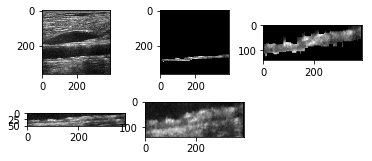

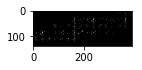

1
2822-AC1_D_0
2822-AC1_D_0.png
2822
D
[ nan]


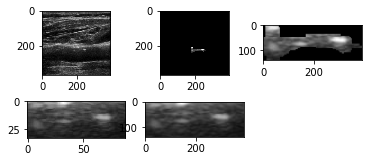

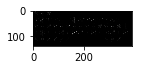

x 102
2043-AC_E_0
2043-AC_E_0.png
2043
E
[ 2.]


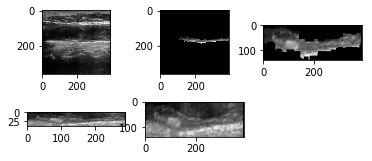

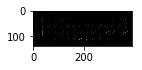

x 229
3967-AC_E_1
3967-AC_E_1.png
3967
E
[ 4.]


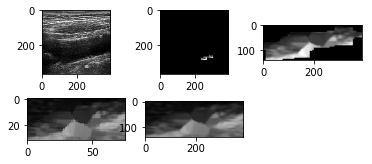

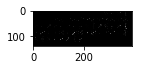

2
2349-AC2_D_0
2349-AC2_D_0.png
2349
D
[ 2.]


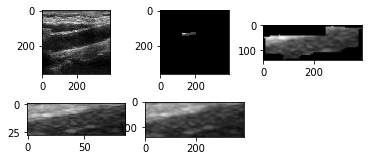

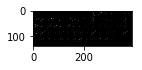

2
4011-AC2_E_0
4011-AC2_E_0.png
4011
E
[ 2.]


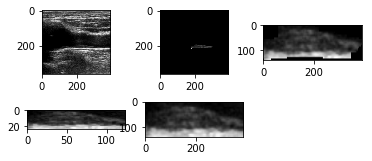

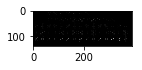

1
2815-AC1_D_0
2815-AC1_D_0.png
2815
D
[ nan]


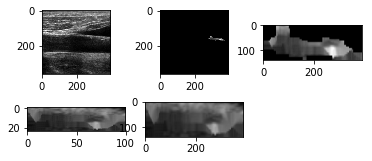

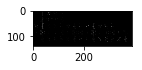

2
2163-AC2_E_0
2163-AC2_E_0.png
2163
E
[ 2.]


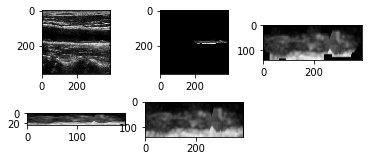

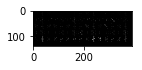

x 107
4003-AC_D_1
4003-AC_D_1.png
4003
D
[ 2.]


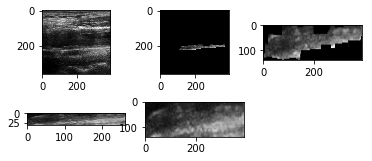

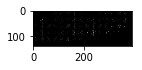

2
3068-AC2_E_0
3068-AC2_E_0.png
3068
E
[ 3.]


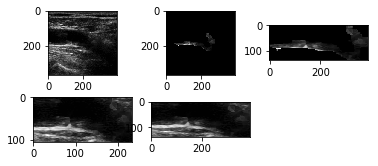

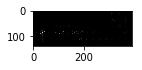

2
3892-AC2_D_0
3892-AC2_D_0.png
3892
D
[ nan]


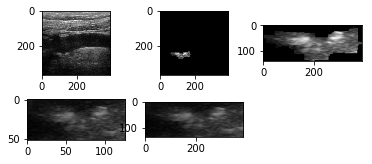

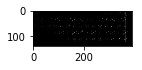

x 84
3483-AC_E_0
3483-AC_E_0.png
3483
E
[ 1.]


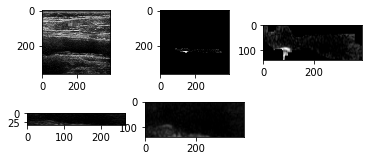

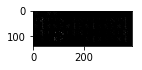

1
2483-AC1_E_0
2483-AC1_E_0.png
2483
E
[ 2.]


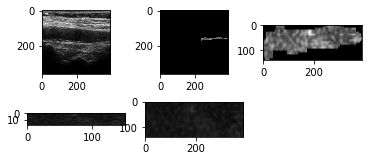

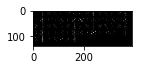

2
3940-AC2_E_0
3940-AC2_E_0.png
3940
E
[ 3.]


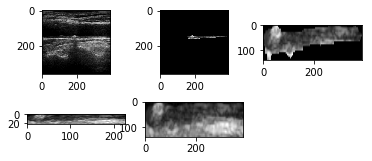

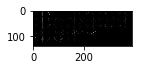

x 102
1866-AC_D_1
1866-AC_D_1.png
1866
D
[ 4.]


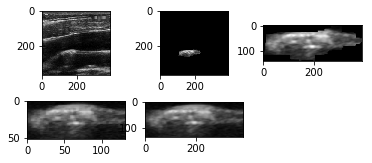

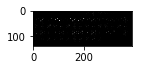

x 211
2393-AC_D_0
2393-AC_D_0.png
2393
D
[ 1.]


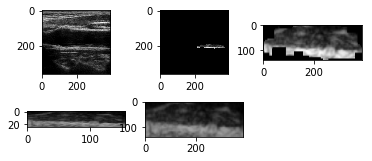

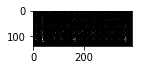

2
2513-AC2_E_1
2513-AC2_E_1.png
2513
E
[ 2.]


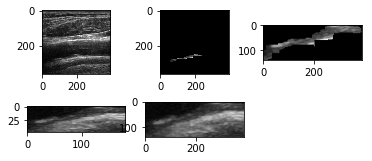

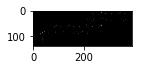

x 208
2506-AC_D_1
2506-AC_D_1.png
2506
D
[ 4.]


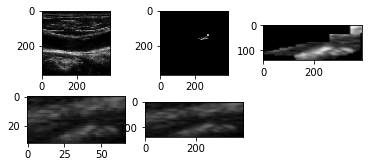

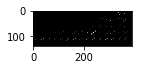

1
2844-AC1_E_1
2844-AC1_E_1.png
2844
E
[ nan]


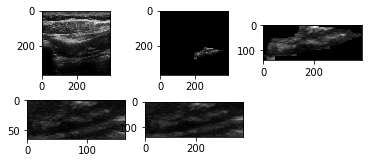

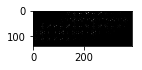

2
2736-AC2_E_1
2736-AC2_E_1.png
2736
E
[ 2.]


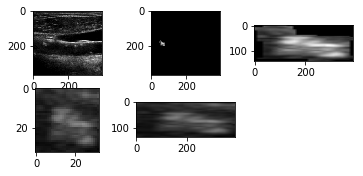

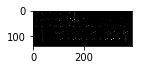

2
2020-AC2_D_0
2020-AC2_D_0.png
2020
D
[ 3.]


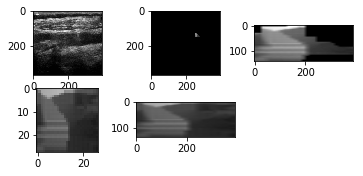

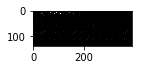

x 216
2068-AC_E_0
2068-AC_E_0.png
2068
E
[ 3.]


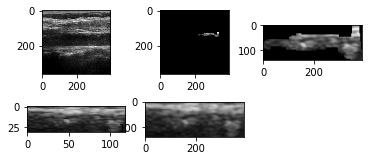

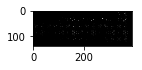

2
3291-AC2_D_1
3291-AC2_D_1.png
3291
D
[ 4.]


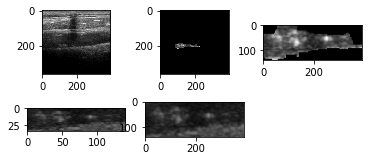

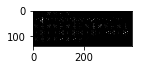

2
1983-AC2_D_0
1983-AC2_D_0.png
1983
D
[ 4.]


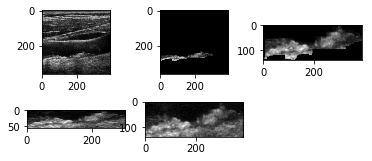

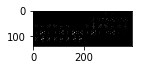

1
2500-AC1_E_0
2500-AC1_E_0.png
2500
E
[ nan]


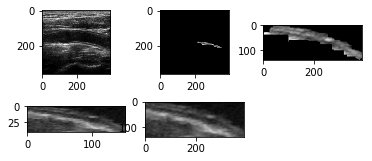

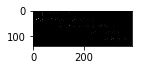

x 138
4003-AC_D_0
4003-AC_D_0.png
4003
D
[ 2.]


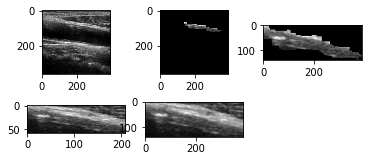

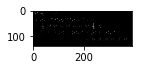

1
2254-AC1_D_0
2254-AC1_D_0.png
2254
D
[ nan]


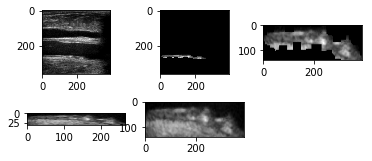

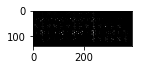

x 156
2032-AC_D_1
2032-AC_D_1.png
2032
D
[ 3.]


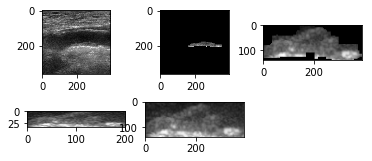

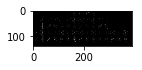

x 316
3087-AC_D_0
3087-AC_D_0.png
3087
D
[ 3.]


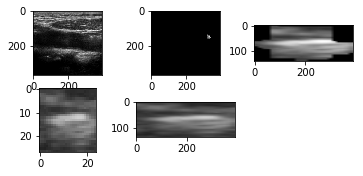

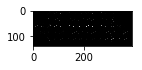

1
2355-AC1_E_0
2355-AC1_E_0.png
2355
E
[ 3.]


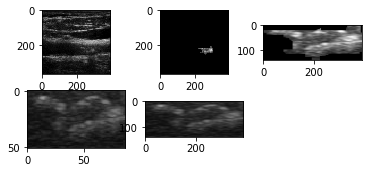

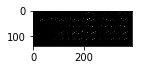

x 177
3691-AC_E_0
3691-AC_E_0.png
3691
E
[ 2.]


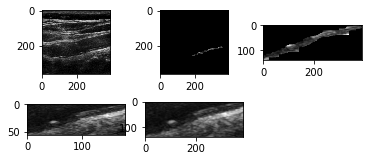

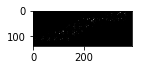

x 185
2834-AC_E_0
2834-AC_E_0.png
2834
E
[ 4.]


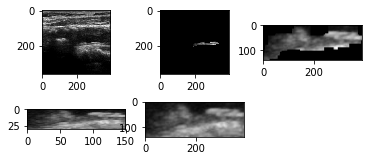

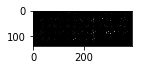

x 203
3682-AC_D_0
3682-AC_D_0.png
3682
D
[ 2.]


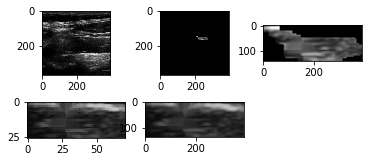

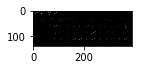

x 120
4177-AC_E_0
4177-AC_E_0.png
4177
E
[ 3.]


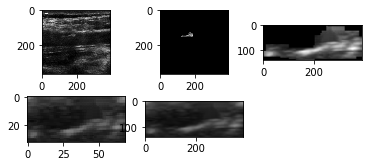

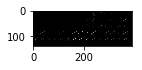

x 193
2692-AC_E_0
2692-AC_E_0.png
2692
E
[ 3.]


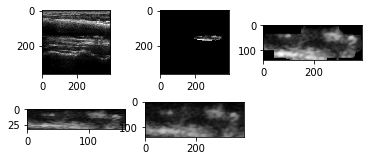

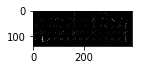

x 32
4131-AC_D_0
4131-AC_D_0.png
4131
D
[ nan]


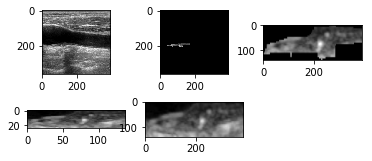

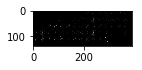

2
2901-AC2_D_1
2901-AC2_D_1.png
2901
D
[ 1.]


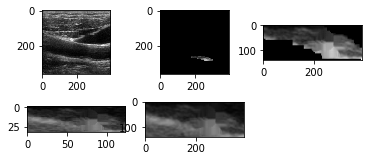

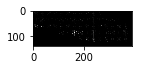

2
3986-AC2_E_1
3986-AC2_E_1.png
3986
E
[ 1.]


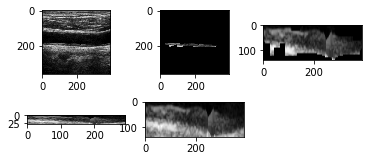

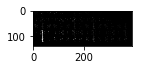

x 230
3172-AC_E_1
3172-AC_E_1.png
3172
E
[ 2.]


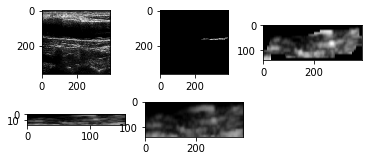

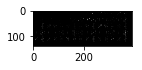

2
2844-AC2_D_2
2844-AC2_D_2.png
2844
D
[ 5.]


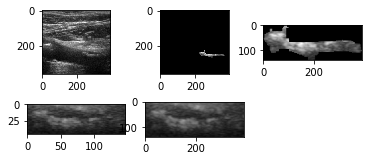

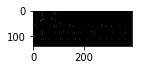

2
2509-AC2_D_1
2509-AC2_D_1.png
2509
D
[ 2.]


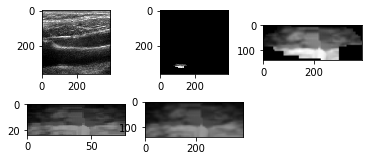

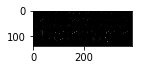

2
2393-AC2_D_0
2393-AC2_D_0.png
2393
D
[ 1.]


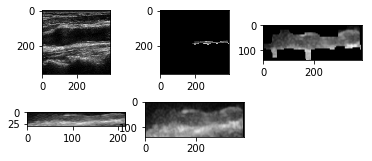

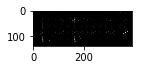

2
2464-AC2_E_0
2464-AC2_E_0.png
2464
E
[ 3.]


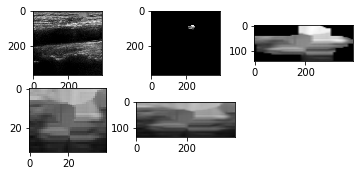

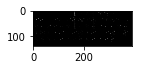

x 66
3346-AC_E_0
3346-AC_E_0.png
3346
E
[ nan]


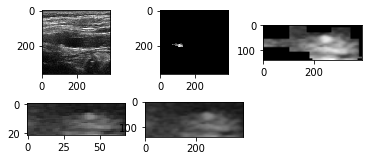

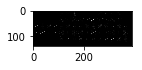

1
2393-AC1_E_0
2393-AC1_E_0.png
2393
E
[ 1.]


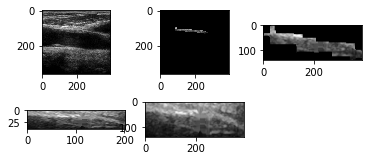

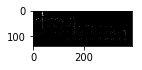

1
2933-AC1_E_1
2933-AC1_E_1.png
2933
E
[ 3.]


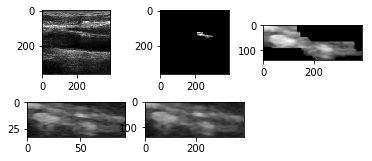

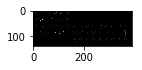

x 84
2585-AC_E_0
2585-AC_E_0.png
2585
E
[ 1.]


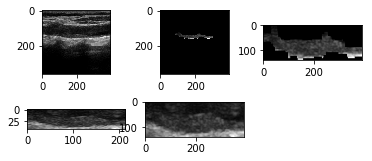

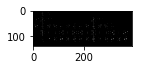

x 193
2566-AC_E_1
2566-AC_E_1.png
2566
E
[ 4.]


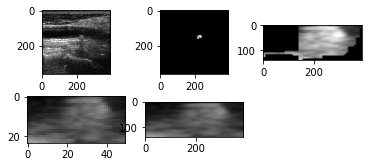

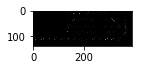

x 211
2480-AC_E_2
2480-AC_E_2.png
2480
E
[ 5.]


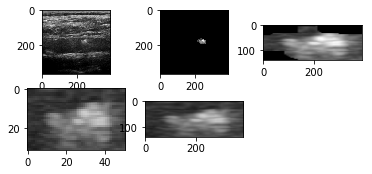

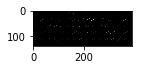

x 120
2233-AC_E_1
2233-AC_E_1.png
2233
E
[ 3.]


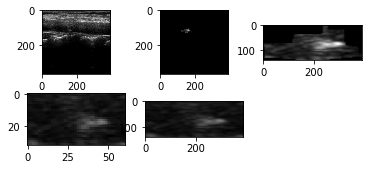

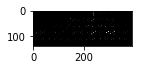

2
1908-AC2_E_1
1908-AC2_E_1.png
1908
E
[ 4.]


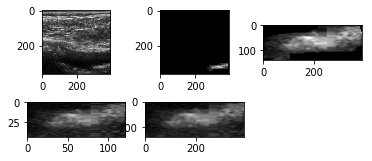

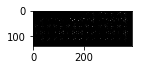

2
2821-AC2_D_1
2821-AC2_D_1.png
2821
D
[ 2.]


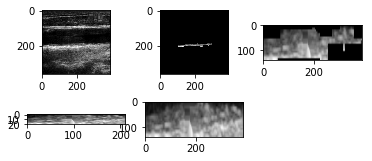

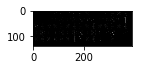

2
3122-AC2_D_0
3122-AC2_D_0.png
3122
D
[ 1.]


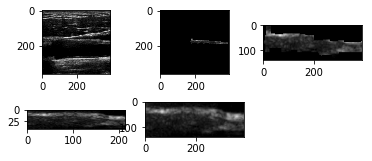

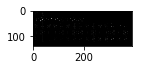

x 124
1853-AC_E_1
1853-AC_E_1.png
1853
E
[ nan]


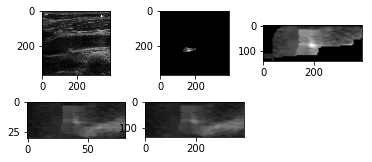

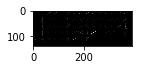

2
1828-AC2_E_0
1828-AC2_E_0.png
1828
E
[ nan]


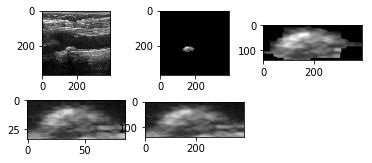

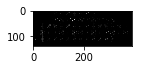

2
3805-AC2_E_1
3805-AC2_E_1.png
3805
E
[ 4.]


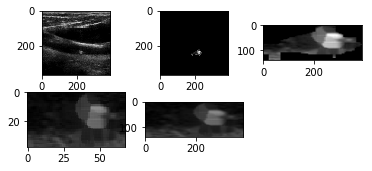

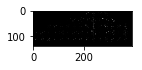

x 147
2030-AC_E_0
2030-AC_E_0.png
2030
E
[ 3.]


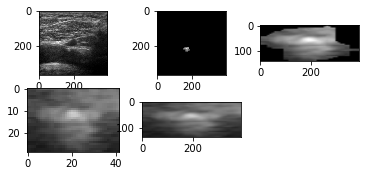

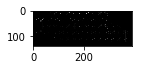

x 94
3986-AC_D_0
3986-AC_D_0.png
3986
D
[ 4.]


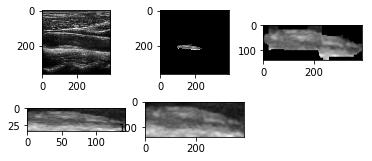

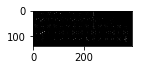

x 102
4187-AC_D_0
4187-AC_D_0.png
4187
D
[ 3.]


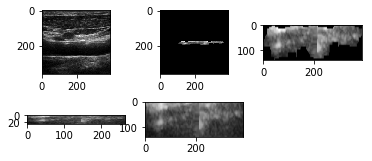

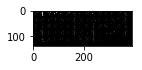

x 102
3995-AC_E_0
3995-AC_E_0.png
3995
E
[ nan]


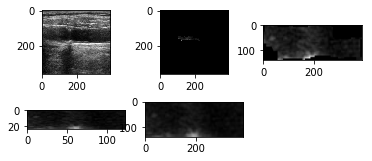

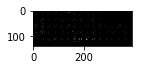

2
2426-AC2_E_0
2426-AC2_E_0.png
2426
E
[ 1.]


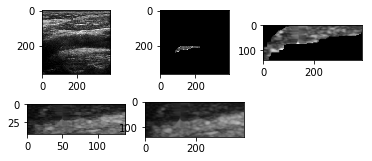

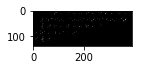

x 29
1988-AC_E_1
1988-AC_E_1.png
1988
E
[ 4.]


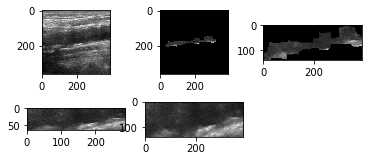

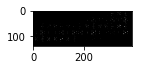

2
3675-AC2_E_0
3675-AC2_E_0.png
3675
E
[ 4.]


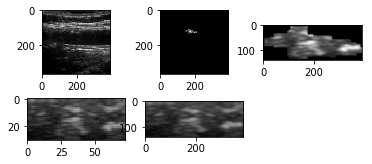

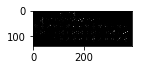

2
3806-AC2_E_1
3806-AC2_E_1.png
3806
E
[ 3.]


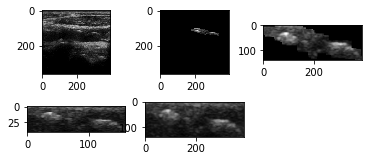

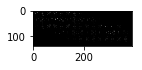

2
4062-AC2_E_2
4062-AC2_E_2.png
4062
E
[ 5.]


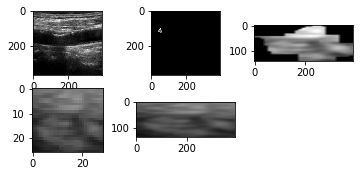

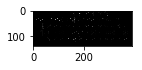

1
2860-AC1_E_0
2860-AC1_E_0.png
2860
E
[ nan]


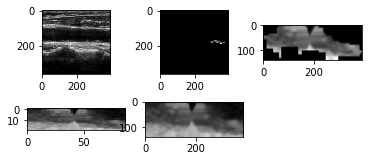

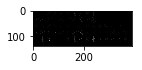

x 302
3249-AC_E_0
3249-AC_E_0.png
3249
E
[ 3.]


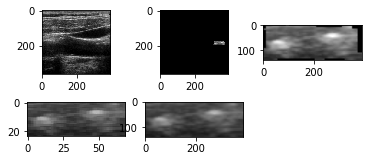

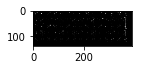

x 157
2927-AC_E_1
2927-AC_E_1.png
2927
E
[ 5.]


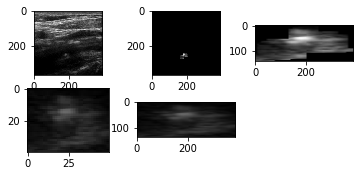

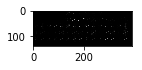

x 51
3118-AC_D_1
3118-AC_D_1.png
3118
D
[ 4.]


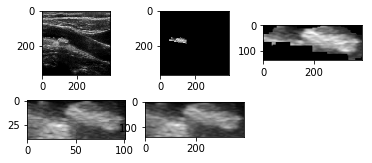

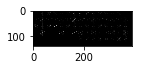

x 0
1906-AC_D_1
1906-AC_D_1.png
1906
D
[ 3.]


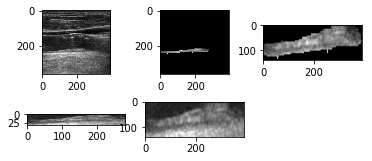

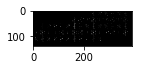

2
2468-AC2_D_0
2468-AC2_D_0.png
2468
D
[ 3.]


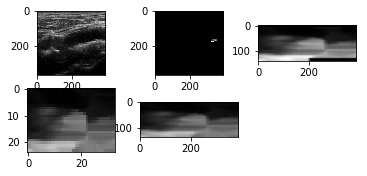

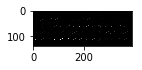

x 12
1863-AC_E_1
1863-AC_E_1.png
1863
E
[ 3.]


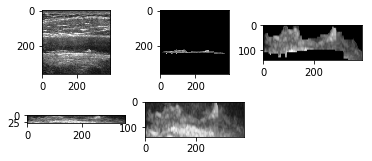

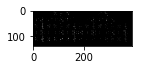

2
1980-AC2_D_3
1980-AC2_D_3.png
1980
D
[ 3.]


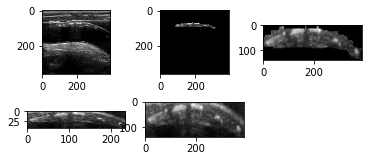

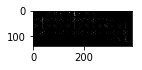

1
2720-AC1_D_0
2720-AC1_D_0.png
2720
D
[ nan]


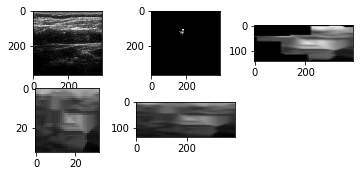

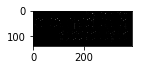

2
2831-AC2_E_1
2831-AC2_E_1.png
2831
E
[ 4.]


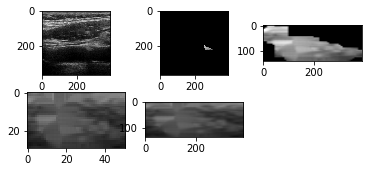

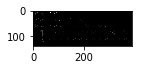

2
2822-AC2_D_0
2822-AC2_D_0.png
2822
D
[ 4.]


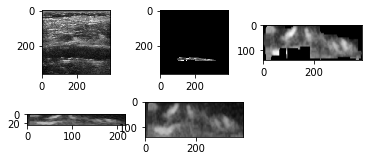

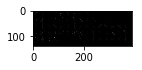

1
2587-AC1_E_1
2587-AC1_E_1.png
2587
E
[ 5.]


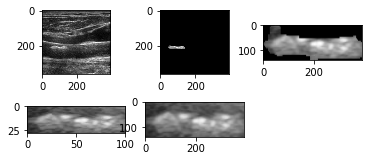

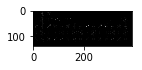

x 139
2545-AC_D_0
2545-AC_D_0.png
2545
D
[ 2.]


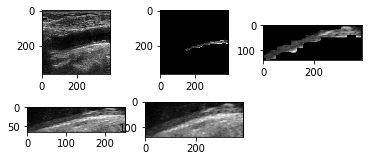

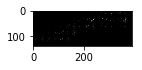

x 124
1922-AC_E_0
1922-AC_E_0.png
1922
E
[ 5.]


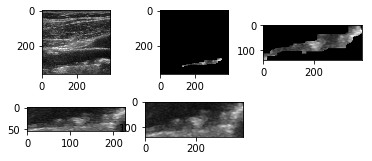

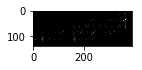

x 102
3395-AC_E_1
3395-AC_E_1.png
3395
E
[ 2.]


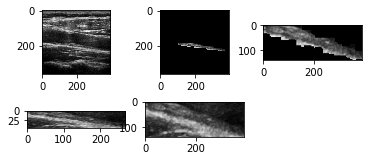

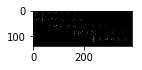

1
2632-AC1_D_1
2632-AC1_D_1.png
2632
D
[ nan]


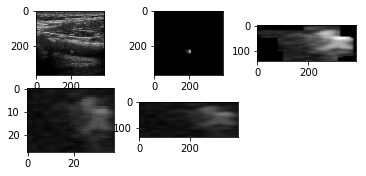

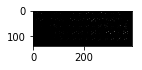

2
3828-AC2_E_0
3828-AC2_E_0.png
3828
E
[ 4.]


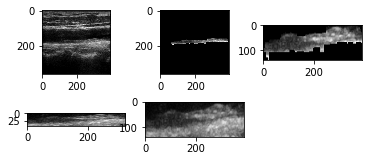

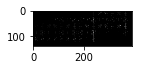

x 143
3118-AC_D_0
3118-AC_D_0.png
3118
D
[ 4.]


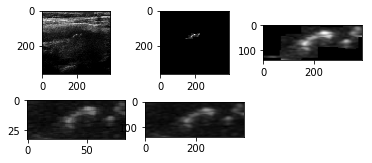

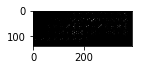

x 3
2141-AC_E_1
2141-AC_E_1.png
2141
E
[ 4.]


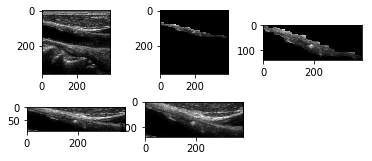

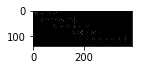

x 47
3850-AC_D_2
3850-AC_D_2.png
3850
D
[ 2.]


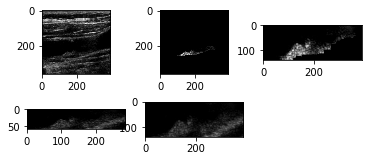

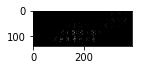

x 180
3675-AC_E_1
3675-AC_E_1.png
3675
E
[ 4.]


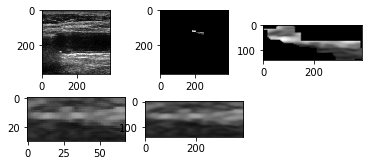

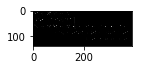

2
2320-AC2_E_0
2320-AC2_E_0.png
2320
E
[ 2.]


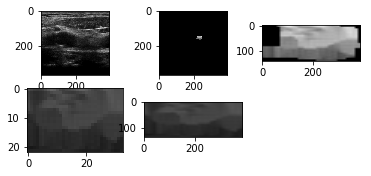

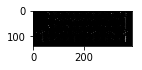

x 140
2954-AC_E_2
2954-AC_E_2.png
2954
E
[ 4.]


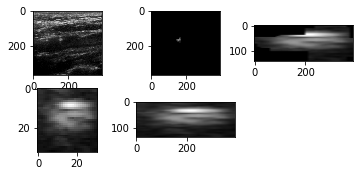

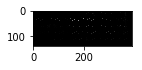

2
3339-AC2_E_0
3339-AC2_E_0.png
3339
E
[ 2.]


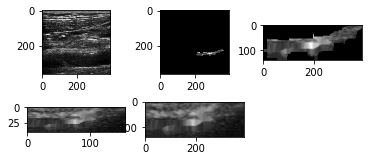

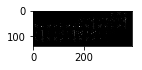

x 120
3830-AC_E_0
3830-AC_E_0.png
3830
E
[ 1.]


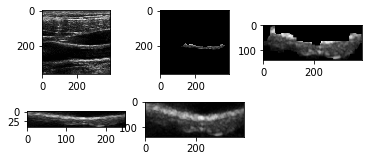

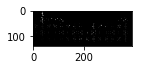

x 156
2956-AC_D_0
2956-AC_D_0.png
2956
D
[ 3.]


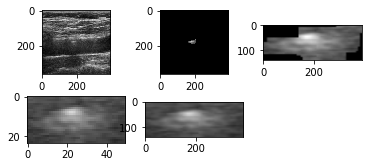

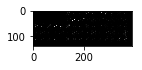

x 229
2773-AC_E_3
2773-AC_E_3.png
2773
E
[ 5.]


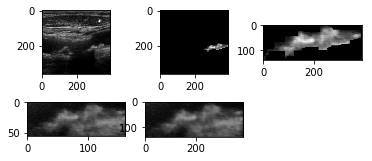

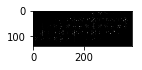

x 138
2011-AC_E_1
2011-AC_E_1.png
2011
E
[ 2.]


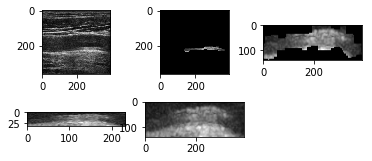

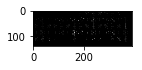

2
2974-AC2_E_1
2974-AC2_E_1.png
2974
E
[ 3.]


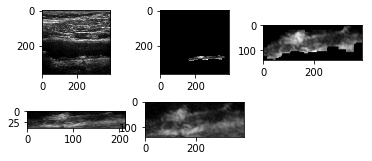

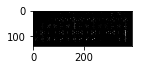

x 120
4020-AC_E_0
4020-AC_E_0.png
4020
E
[ 2.]


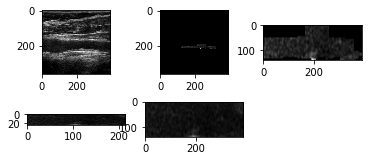

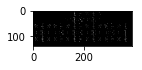

x 102
3498-AC_E_0
3498-AC_E_0.png
3498
E
[ 1.]


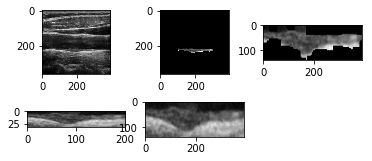

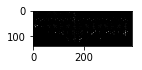

2
2995-AC2_E_0
2995-AC2_E_0.png
2995
E
[ 2.]


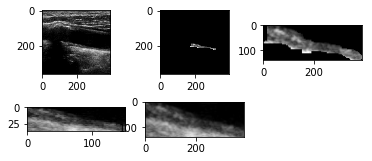

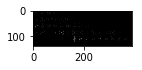

2
4062-AC2_E_1
4062-AC2_E_1.png
4062
E
[ 5.]


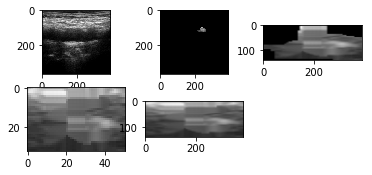

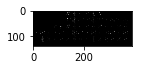

x 122
3960-AC_E_0
3960-AC_E_0.png
3960
E
[ 1.]


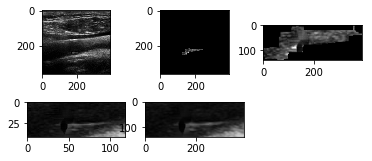

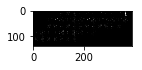

2
2609-AC2_E_1
2609-AC2_E_1.png
2609
E
[ 4.]


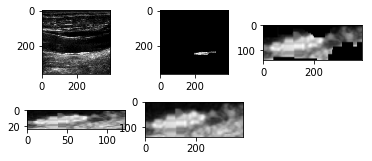

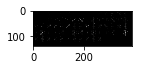

x 140
3283-AC_D_1
3283-AC_D_1.png
3283
D
[ 3.]


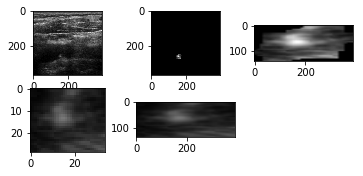

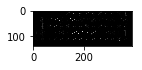

x 180
3316-AC_D_0
3316-AC_D_0.png
3316
D
[ 5.]


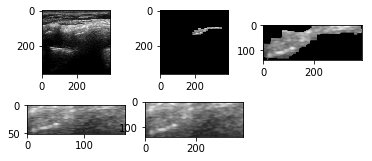

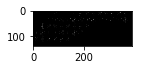

2
1980-AC2_D_0
1980-AC2_D_0.png
1980
D
[ 3.]


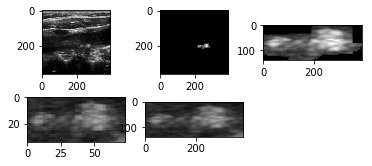

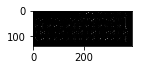

x 167
3467-AC_E_0
3467-AC_E_0.png
3467
E
[ 1.]


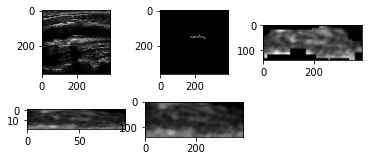

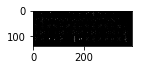

2
3408-AC2_D_0
3408-AC2_D_0.png
3408
D
[ 3.]


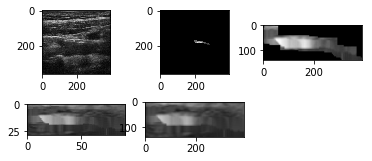

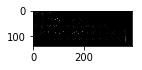

1
2634-AC1_E_1
2634-AC1_E_1.png
2634
E
[ 4.]


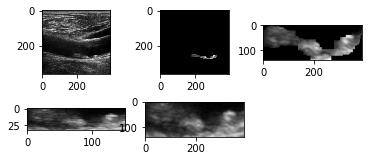

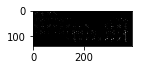

2
2831-AC2_E_2
2831-AC2_E_2.png
2831
E
[ 4.]


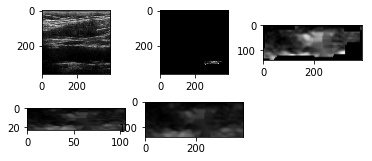

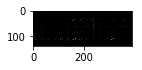

2
2480-AC2_D_1
2480-AC2_D_1.png
2480
D
[ 5.]


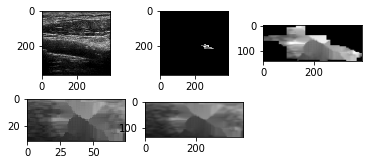

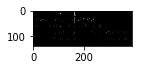

1
2634-AC1_E_0
2634-AC1_E_0.png
2634
E
[ 4.]


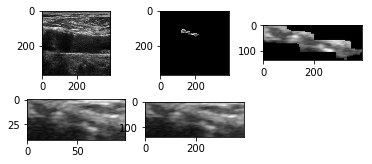

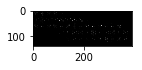

2
2831-AC2_E_3
2831-AC2_E_3.png
2831
E
[ 4.]


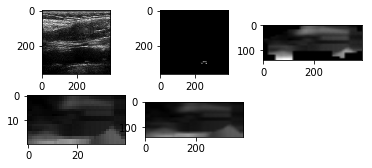

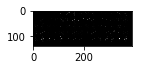

x 13
3467-AC_E_1
3467-AC_E_1.png
3467
E
[ 1.]


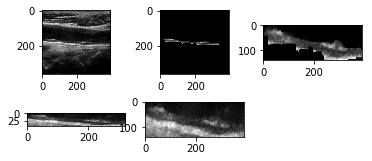

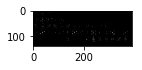

x 120
2364-AC_E_1
2364-AC_E_1.png
2364
E
[ 5.]


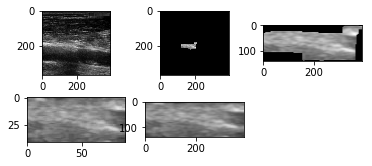

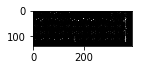

1
2480-AC1_E_0
2480-AC1_E_0.png
2480
E
[ 5.]


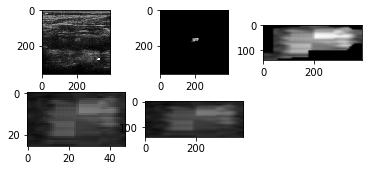

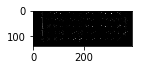

x 175
2236-AC_D_1
2236-AC_D_1.png
2236
D
[ 4.]


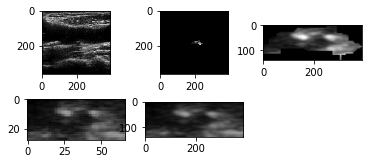

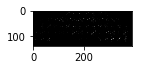

2
2279-AC2_E_1
2279-AC2_E_1.png
2279
E
[ 4.]


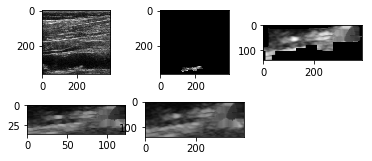

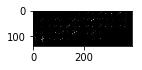

2
4050-AC2_E_1
4050-AC2_E_1.png
4050
E
[ 3.]


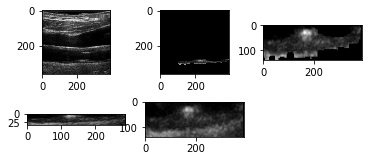

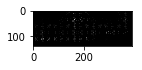

2
3197-AC2_D_0
3197-AC2_D_0.png
3197
D
[ 1.]


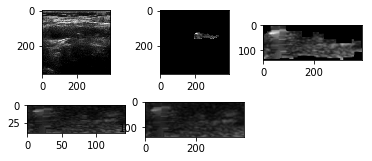

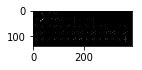

x 102
3419-AC_E_0
3419-AC_E_0.png
3419
E
[ 3.]


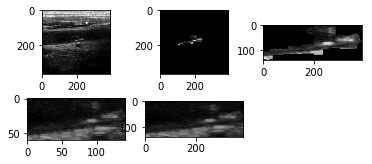

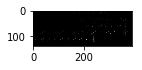

2
4099-AC2_D_2
4099-AC2_D_2.png
4099
D
[ 1.]


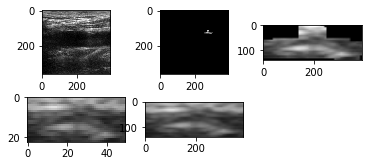

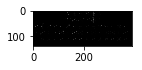

2
2904-AC2_E_0
2904-AC2_E_0.png
2904
E
[ 1.]


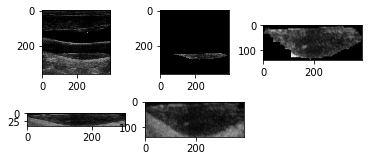

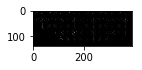

x 247
3911-AC_D_1
3911-AC_D_1.png
3911
D
[ 3.]


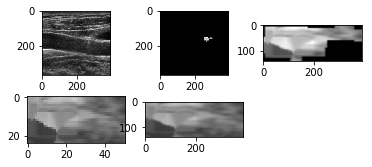

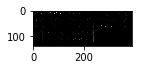

2
2967-AC2_D_0
2967-AC2_D_0.png
2967
D
[ 1.]


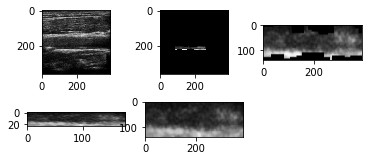

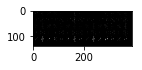

x 102
2773-AC_E_0
2773-AC_E_0.png
2773
E
[ 5.]


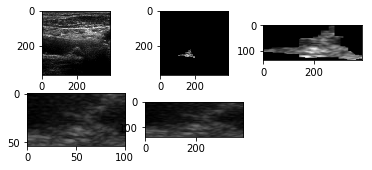

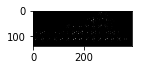

2
2974-AC2_E_0
2974-AC2_E_0.png
2974
E
[ 3.]


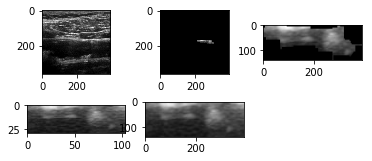

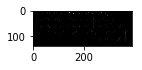

x 4
4048-AC_D_1
4048-AC_D_1.png
4048
D
[ 4.]


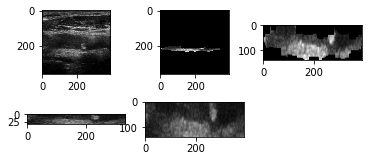

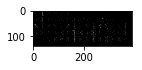

1
2464-AC1_E_0
2464-AC1_E_0.png
2464
E
[ 4.]


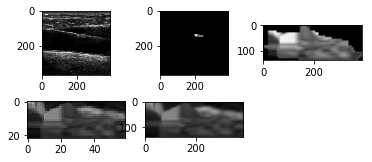

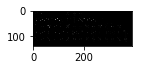

x 139
3507-AC_D_0
3507-AC_D_0.png
3507
D
[ 4.]


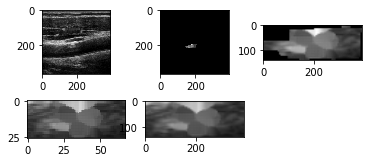

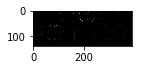

2
2056-AC2_D_0
2056-AC2_D_0.png
2056
D
[ 3.]


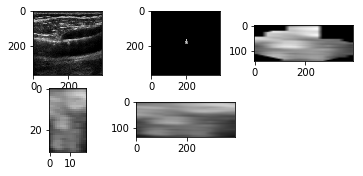

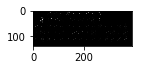

2
3402-AC2_E_1
3402-AC2_E_1.png
3402
E
[ nan]


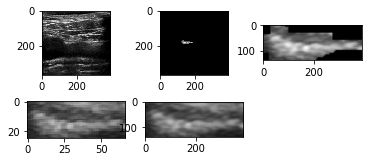

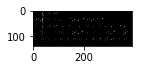

2
3735-AC2_E_0
3735-AC2_E_0.png
3735
E
[ 3.]


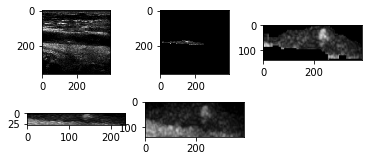

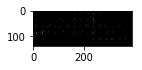

x 235
1925-AC_D_0
1925-AC_D_0.png
1925
D
[ 5.]


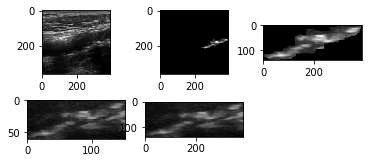

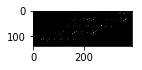

2
3265-AC2_E_0
3265-AC2_E_0.png
3265
E
[ 3.]


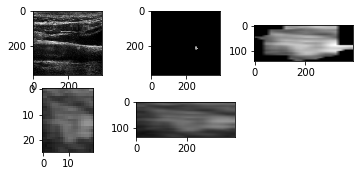

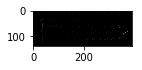

2
2844-AC2_E_2
2844-AC2_E_2.png
2844
E
[ 5.]


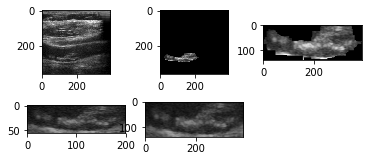

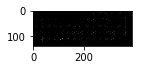

2
2513-AC2_D_2
2513-AC2_D_2.png
2513
D
[ 4.]


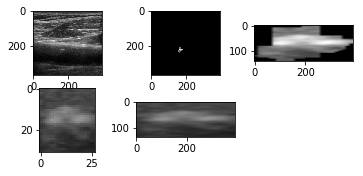

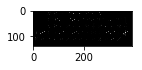

x 0
3634-AC_E_1
3634-AC_E_1.png
3634
E
[ 5.]


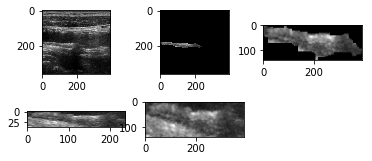

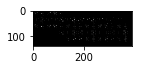

x 48
3921-AC_E_2
3921-AC_E_2.png
3921
E
[ 5.]


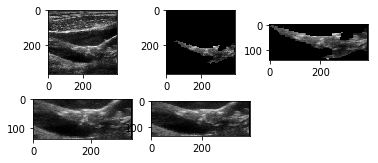

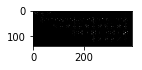

x 211
3182-AC_E_0
3182-AC_E_0.png
3182
E
[ 3.]


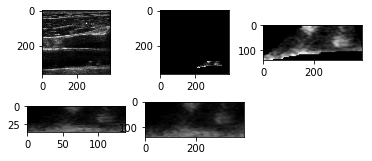

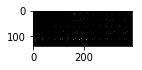

x 161
3923-AC_D_0
3923-AC_D_0.png
3923
D
[ 5.]


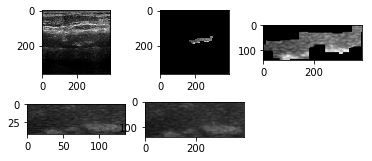

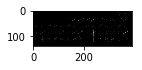

x 87
2904-AC_E_0
2904-AC_E_0.png
2904
E
[ 2.]


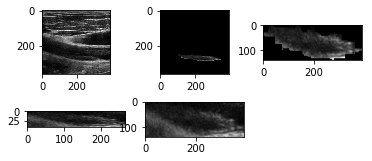

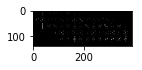

2
2330-AC2_E_0
2330-AC2_E_0.png
2330
E
[ 2.]


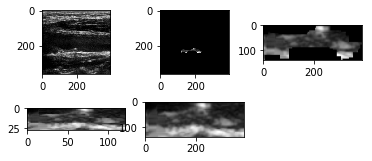

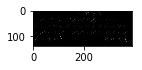

x 67
2933-AC_E_0
2933-AC_E_0.png
2933
E
[ 3.]


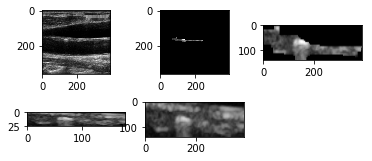

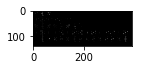

1
2692-AC1_E_1
2692-AC1_E_1.png
2692
E
[ 3.]


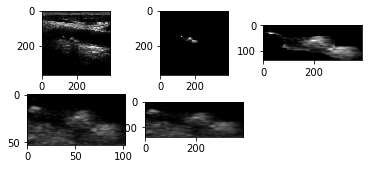

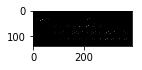

x 180
4187-AC_E_1
4187-AC_E_1.png
4187
E
[ 1.]


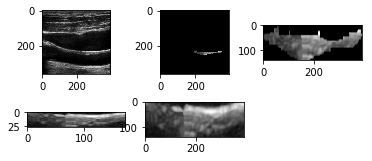

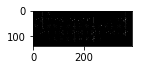

2
3785-AC2_D_0
3785-AC2_D_0.png
3785
D
[ 4.]


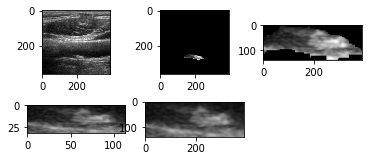

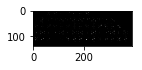

2
3866-AC2_E_0
3866-AC2_E_0.png
3866
E
[ 2.]


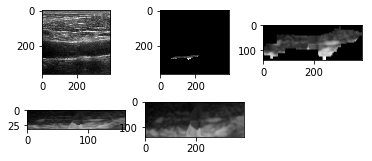

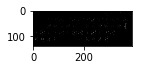

x 247
4177-AC_D_1
4177-AC_D_1.png
4177
D
[ 2.]


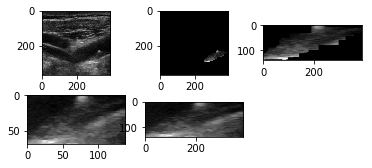

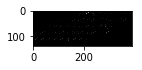

x 67
2845-AC_E_1
2845-AC_E_1.png
2845
E
[ 1.]


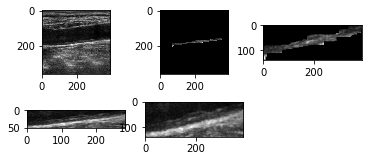

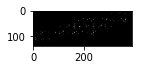

2
3986-AC2_D_0
3986-AC2_D_0.png
3986
D
[ 2.]


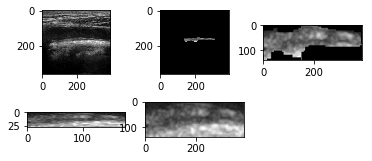

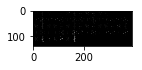

2
2901-AC2_E_0
2901-AC2_E_0.png
2901
E
[ 2.]


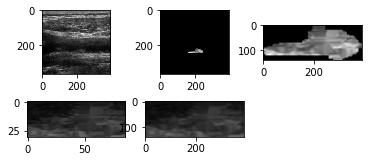

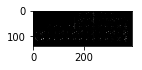

2
3244-AC2_D_0
3244-AC2_D_0.png
3244
D
[ 4.]


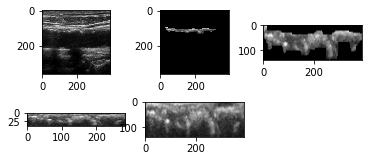

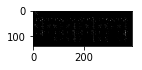

x 174
3634-AC_E_0
3634-AC_E_0.png
3634
E
[ 5.]


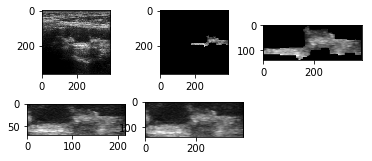

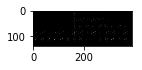

2
1897-AC2_D_1
1897-AC2_D_1.png
1897
D
[ 3.]


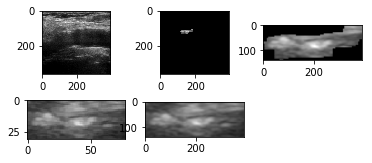

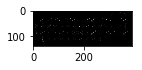

2
2821-AC2_E_1
2821-AC2_E_1.png
2821
E
[ 2.]


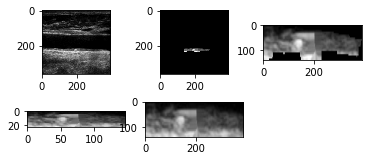

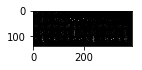

2
2393-AC2_E_1
2393-AC2_E_1.png
2393
E
[ 3.]


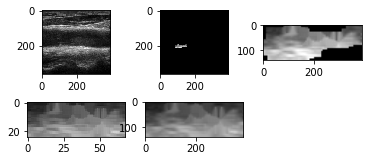

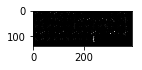

2
2933-AC2_E_1
2933-AC2_E_1.png
2933
E
[ 4.]


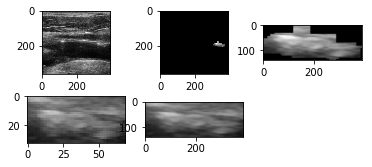

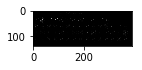

1
2654-AC1_E_0
2654-AC1_E_0.png
2654
E
[ nan]


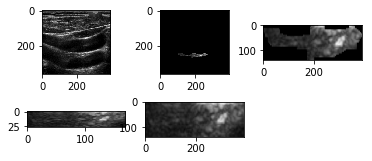

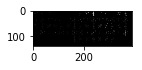

x 207
1885-AC_E_0
1885-AC_E_0.png
1885
E
[ 4.]


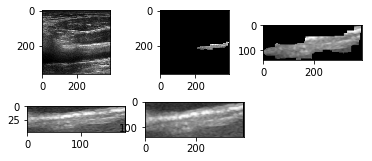

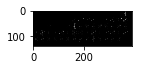

2
3940-AC2_D_0
3940-AC2_D_0.png
3940
D
[ 3.]


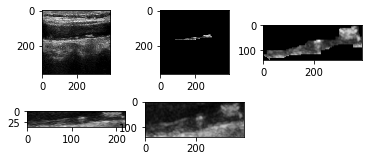

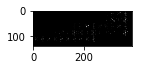

2
2926-AC2_E_1
2926-AC2_E_1.png
2926
E
[ 2.]


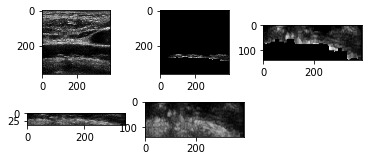

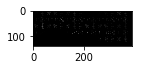

2
2205-AC2_E_0
2205-AC2_E_0.png
2205
E
[ 3.]


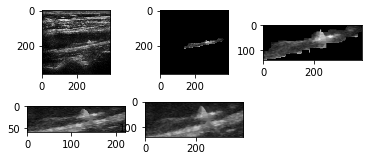

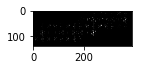

x 97
2509-AC_D_0
2509-AC_D_0.png
2509
D
[ 2.]


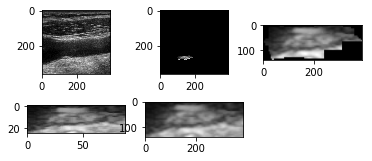

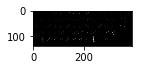

x 174
2032-AC_E_0
2032-AC_E_0.png
2032
E
[ 3.]


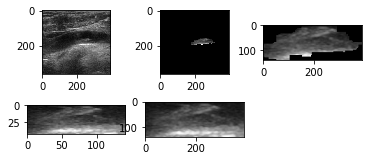

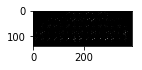

1
2254-AC1_E_1
2254-AC1_E_1.png
2254
E
[ 4.]


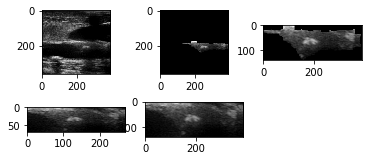

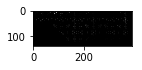

2
3068-AC2_D_0
3068-AC2_D_0.png
3068
D
[ 4.]


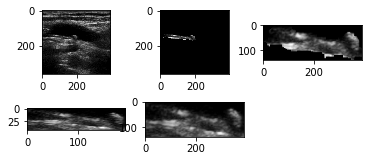

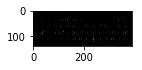

2
2815-AC2_D_0
2815-AC2_D_0.png
2815
D
[ 5.]


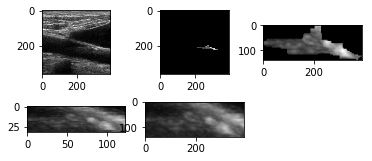

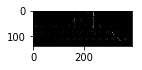

2
2071-AC2_D_0
2071-AC2_D_0.png
2071
D
[ 4.]


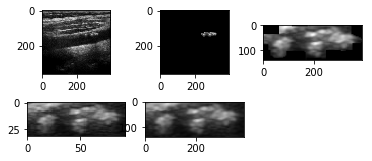

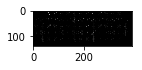

2
2876-AC2_E_0
2876-AC2_E_0.png
2876
E
[ 4.]


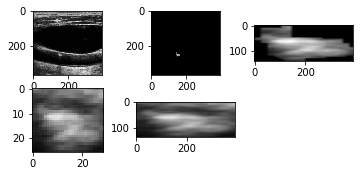

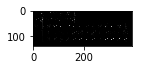

2
4011-AC2_D_0
4011-AC2_D_0.png
4011
D
[ 2.]


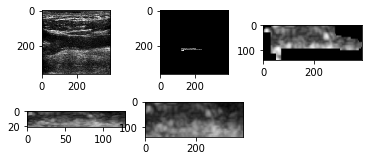

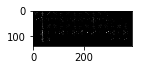

x 77
4177-AC_D_2
4177-AC_D_2.png
4177
D
[ 2.]


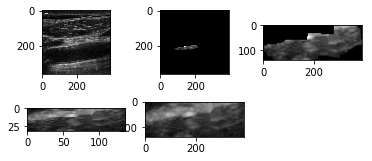

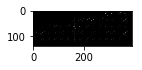

x 175
2906-AC_D_0
2906-AC_D_0.png
2906
D
[ 3.]


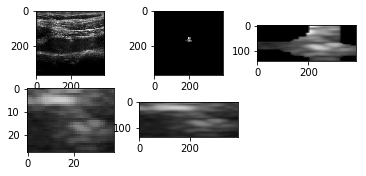

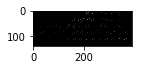

x 138
2084-AC_E_0
2084-AC_E_0.png
2084
E
[ 3.]


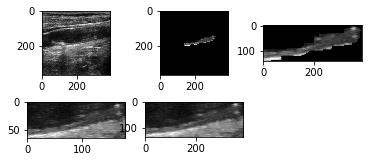

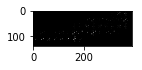

x 115
4003-AC_E_0
4003-AC_E_0.png
4003
E
[ 1.]


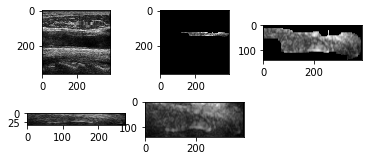

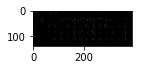

x 266
1899-AC_E_0
1899-AC_E_0.png
1899
E
[ nan]


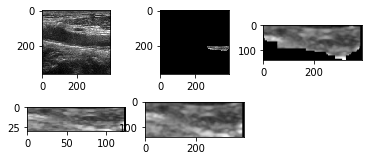

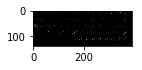

x 121
3921-AC_E_0
3921-AC_E_0.png
3921
E
[ 5.]


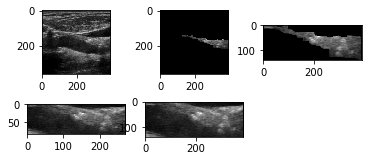

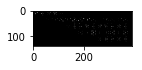

1
2844-AC1_D_0
2844-AC1_D_0.png
2844
D
[ nan]


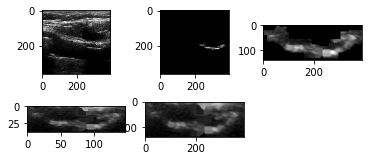

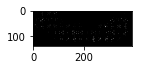

2
3291-AC2_E_1
3291-AC2_E_1.png
3291
E
[ 4.]


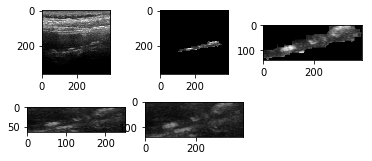

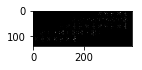

2
2483-AC2_E_1
2483-AC2_E_1.png
2483
E
[ 4.]


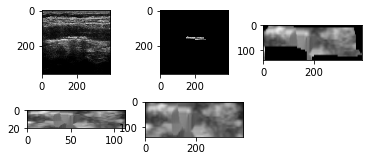

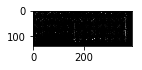

x 142
2393-AC_E_1
2393-AC_E_1.png
2393
E
[ 1.]


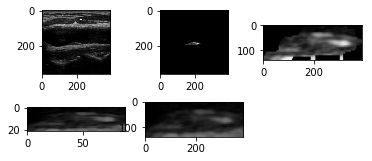

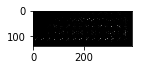

2
1983-AC2_E_0
1983-AC2_E_0.png
1983
E
[ 5.]


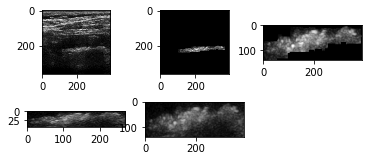

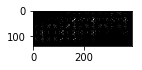

2
2844-AC2_E_0
2844-AC2_E_0.png
2844
E
[ 5.]


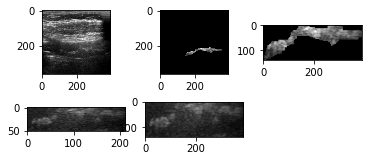

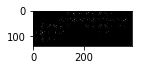

2
3940-AC2_D_1
3940-AC2_D_1.png
3940
D
[ 3.]


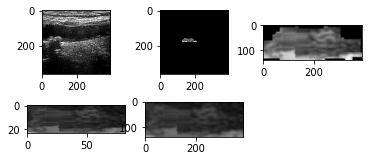

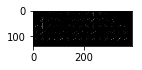

2
2736-AC2_D_1
2736-AC2_D_1.png
2736
D
[ 2.]


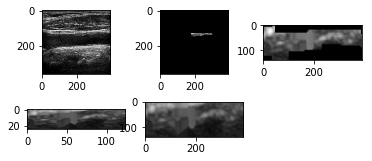

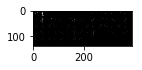

2
2393-AC2_E_2
2393-AC2_E_2.png
2393
E
[ 3.]


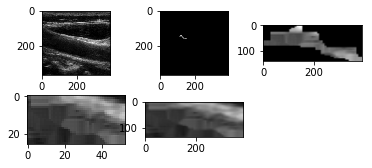

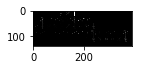

x 229
2068-AC_D_0
2068-AC_D_0.png
2068
D
[ 5.]


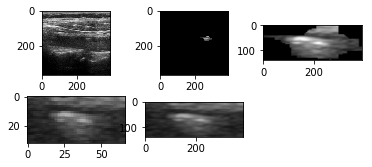

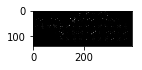

In [16]:
# creation of dataframe to store feature vectors

img_test = mpimg.imread(path_gt+img_name)
coeffs = pywt.WaveletPacket2D(img_test, wavelet="coif1",maxlevel=3)
paths = [node.path for node in coeffs.get_level(3)]

df_features_mean_new = pd.DataFrame(columns = paths[1:])
df_features_std_new = pd.DataFrame(columns = paths[1:])
df_features_mean_new_original = pd.DataFrame(columns = paths[1:])
df_features_std_new_original = pd.DataFrame(columns = paths[1:])

classes = []
codes = []
sides = []
names = []
w_list = []
h_list = []
ppc= 25
hog_GT_images = []
hog_GT_features = []


for image_name in os.listdir(path_gt_new):
    if len(image_name) == 16 :
        img_name_original = image_name[0:12]
        img_orig = mpimg.imread(path_orig_new + img_name_original + ".png")
        img_GT = mpimg.imread(path_gt_new + image_name)
        im_GT_cv = cv2.imread(path_gt_new + image_name)
        im_GT_cv_copy = np.uint8(im_GT_cv)
        im_GT_cv_copy = to_binary(im_GT_cv_copy,0.5)
        x,y,w,h = cv2.boundingRect(im_GT_cv_copy[:,:,0])
        # 1801-AC1_E_0.png
        code = image_name[0:4]
        side = image_name[9]
    elif len(image_name) == 15 :
        img_name_original = image_name[0:11]
        img_orig = mpimg.imread(path_orig_new + img_name_original + ".png")
        img_GT = mpimg.imread(path_gt_new + image_name)
        im_GT_cv = cv2.imread(path_gt_new+image_name)
        im_GT_cv_copy = np.uint8(im_GT_cv)
        im_GT_cv_copy = to_binary(im_GT_cv_copy,0.5)
        x,y,w,h = cv2.boundingRect(im_GT_cv_copy[:,:,0])
        print("x",x)
        
        # 1801-AC1_E_0.png
        code = image_name[0:4]
        side = image_name[8]
        
    else : continue
    if len(image_name) == 15:
        if side == "D":
            type_plaque = df_new[df_new["Códigobiobanco"]==np.int(code)]["clasif_cc_d"].values
        else :
            type_plaque = df_new[df_new["Códigobiobanco"]==np.int(code)]["clasif_cc_i"].values
    elif len(image_name) == 16:
        seguiment = img_name_original[7]
        print(seguiment)
        if seguiment == "1":
            if side == "D":
                type_plaque = df_new[df_new["Códigobiobanco"]==np.int(code)]["clasif_cc_d"].values
            else :
                type_plaque = df_new[df_new["Códigobiobanco"]==np.int(code)]["clasif_cc_i"].values
        else :
            if side == "D":
                type_plaque = df_new[df_new["Códigobiobanco"]==np.int(code)]["clasif_cc_d_24"].values
            else :
                type_plaque = df_new[df_new["Códigobiobanco"]==np.int(code)]["clasif_cc_i_24"].values
            

    print(img_name_original)
    print(image_name)
    print(code)
    print(side)
    print(type_plaque)
    
    classes.append((type_plaque))
    codes.append(code)
    sides.append(side)
    names.append(img_name_original)
    w_list.append(w)
    h_list.append(h)

    
    img_original_= img_orig[:,:,0]*255
    img_GT_ = to_binary(img_GT,0.002)
    img_original_PL = np.where(img_GT_ == 1,img_original_,0)
    crop_img = img_original_PL[y:y+h, x:x+w]
    crop_big = cv2.resize(crop_img , (388,139))
    crop_img_original = img_orig[y:y+h, x:x+w]
    crop_big_original = cv2.resize(crop_img_original , (388,139))
    
    plt.subplot(331)
    plt.imshow(img_original_,cmap=plt.get_cmap('gray'))
    plt.subplot(332)
    plt.imshow(img_original_PL,cmap=plt.get_cmap('gray'))
    plt.subplot(333)
    plt.imshow(crop_big,cmap=plt.get_cmap('gray'))
    plt.subplot(334)
    plt.imshow(crop_img_original ,cmap=plt.get_cmap('gray'))
    plt.subplot(335)
    plt.imshow(crop_big_original,cmap=plt.get_cmap('gray'))
    plt.show()
    
    # compute coeficients wavelet paquets on the whole image or in the crop image
    #coeffs = pywt.WaveletPacket2D(img_original_PL, wavelet="coif1", maxlevel=3)
    #coeffs = pywt.WaveletPacket2D(crop_img, wavelet="coif1", maxlevel=3)
    coeffs = pywt.WaveletPacket2D(crop_big, wavelet="coif1", maxlevel=3)
    coeffs_original = pywt.WaveletPacket2D(crop_big_original[:,:,0], wavelet="coif1", maxlevel=3)
    fd,hog_image = hog(crop_big, orientations=8, pixels_per_cell=(ppc,ppc),cells_per_block=(2, 2),block_norm= 'L2',visualise=True)
    hog_GT_images.append(hog_image)
    hog_GT_features.append(fd)
    
    plt.subplot(336)
    plt.imshow(hog_image,cmap=plt.get_cmap('gray'))
    plt.show()
    
    
    
    feature_row_mean = []
    feature_row_std = []
    feature_row_mean_original = []
    feature_row_std_original = []
    paths = [node.path for node in coeffs.get_level(3)]

    for i, path in enumerate(paths):
        if path != "aaa":
            # creation of features for each path except for path aaa
            feature_row_mean.append(np.mean(coeffs[path].data))
            feature_row_std.append(np.std(coeffs[path].data))   
            feature_row_mean_original.append(np.mean(coeffs_original[path].data))
            feature_row_std_original.append(np.std(coeffs_original[path].data))
            
    df_features_mean_new=df_features_mean_new.append(pd.DataFrame([feature_row_mean],columns = paths[1:]))
    df_features_std_new=df_features_std_new.append(pd.DataFrame([feature_row_std],columns = paths[1:]))

    df_features_mean_new_original=df_features_mean_new_original.append(pd.DataFrame([feature_row_mean_original],columns = paths[1:]))
    df_features_std_new_original=df_features_std_new_original.append(pd.DataFrame([feature_row_std_original],columns = paths[1:]))


Some data manipulationto have all the features from the wavelets coefficients in a dataframe.

In [17]:
# Data manipulation

df_features_mean_new_ = df_features_mean_new.rename(columns=lambda x: x+"_mean")
df_features_std_new_ = df_features_std_new.rename(columns=lambda x: x+"_std")
df_features_mean_new_["class"] = classes
df_features_mean_new_["names"] = names
df_features_std_new_["names"] = names

df_features_mean_new_ = df_features_mean_new_[df_features_mean_new_["class"] >=1]
df_features_mean_new_ = df_features_mean_new_[df_features_mean_new_["class"] <6] #drop class 5
#df_features_std = df_features_std[df_features_std["class"] >=1]

classes_ = []
for i in df_features_mean_new_["class"].values:
    classes_.append(int(i))
    
df_features_mean_new_["class"]=classes_
#df_features_std["class"]=classes_


Understanding the table, the image names are:
1801-AC1_E_0
the first 4 characters corresponds to the code biobank, the two letters the territory, if there is a number after the letters 1 means first revision and 2 after 24 months, after it follows a letter (either E for left and D for right), and then 0 or 1 with no important meaning.

In [18]:
df_new[df_new["Códigobiobanco"]==2586]

,Códigobiobanco,clasif_cc_d,clasif_cc_i,clasif_cc_d_24,clasif_cc_i_24,clasif_fem_sup_d,clasif_fem_sup_i,clasif_fem_sup_d_24,clasif_fem_sup_i_24,clasif_fem_com_d,clasif_fem_com_i,clasif_fem_com_d_24,clasif_fem_com_i_24
739,2586,NaN,4.0,3.0,3.0,NaN,NaN,4.0,NaN,5.0,3.0,5.0,4.0


In [19]:
np.unique(classes_)

array([1, 2, 3, 4, 5])

In [20]:
# join std and mean
df_features_new_ = df_features_mean_new_.set_index(["names"]).join(df_features_std_new_.set_index(["names"]))

df_features_new_.head()

,aah_mean,aav_mean,aad_mean,aha_mean,ahh_mean,ahv_mean,ahd_mean,ava_mean,avh_mean,avv_mean,...,dhv_std,dhd_std,dva_std,dvh_std,dvv_std,dvd_std,dda_std,ddh_std,ddv_std,ddd_std
names,,,,,,,,,,,,,,,,,,,,,
3492-AC1_E_1,0.238454,0.457436,-0.114523,-0.995558,0.560364,0.014219,0.074023,0.218631,-0.097858,-1.057563,...,0.180421,0.181460,0.353642,0.281436,0.382627,0.214212,0.336734,0.327530,0.231795,0.243042
2636-AC2_D_2,0.314475,0.264912,-0.027537,0.251905,1.172146,0.013110,0.048746,0.097645,-0.002243,-0.799827,...,0.043523,0.049618,0.058672,0.127984,0.045769,0.145062,0.070288,0.069305,0.072776,0.060904
3708-AC_E_1,1.278069,0.166029,-0.000032,-0.156001,0.446884,0.000084,0.001495,0.022280,-0.000365,0.058706,...,0.007012,0.010106,0.015796,0.010481,0.015790,0.011069,0.006878,0.012027,0.007166,0.015411
3123-AC2_D_0,-1.220831,-0.097231,-0.073102,-0.334659,-0.833718,-0.031240,0.054507,-0.094559,0.014580,0.023236,...,0.192639,0.171949,0.770523,0.177407,0.675674,0.143758,0.183688,0.156544,0.163948,0.147865
3416-AC2_D_2,-0.315407,0.004357,-0.000203,-0.047830,-0.180561,-0.000010,-0.000038,-0.000095,-0.000056,0.003833,...,0.003380,0.006053,0.007017,0.004261,0.021933,0.008774,0.002862,0.004337,0.005642,0.011341


In [21]:
# drop class column(target) to have just features

df_features_new_ = df_features_new_.drop(["class"], axis = 1)

## In case we want to do some feature selection

This code reduces the number of features.

In [22]:
# feature selection using sklearn

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import mutual_info_classif

# Parameters
n_features = 11


# select most important 11 features


X_new =feature_selection(df_features_new_, classes_,n_features)

# SVM on 3 classes

In [24]:
# from 5 classes to 3

classes_3 = convert_to_3_classes(classes_)

In [23]:
# apply SVM here for this training set and target vector
# reccomendation with small dataset : leave-one-out (it should be somewhere in ML notes) as resampling method to deal with the fact that we have small number of samples
# used kernel = Gaussian radial basis function

#Best parameters set found on development set:

#{'C': 0.2, 'class_weight': None, 'gamma': 0.002, 'kernel': 'rbf'}

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC

# parameters
regularization_param =0.2 #2**5
g_parameter = 0.002# select g_parameter
kernel_name = "rbf" # select kernel

# data
X = df_features_reduced_new.values
y = classes_3

# dividing X, y into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state = 0)

# training a linear SVM classifier

svm_model_gaussian = SVC(kernel = kernel_name, C = regularization_param, gamma=g_parameter, class_weight='balanced').fit(X_train, y_train)
svm_predictions = svm_model_gaussian.predict(X_test)
svm_predictions_train = svm_model_gaussian.predict(X_train)

# model accuracy for X_test  
accuracy_train = svm_model_gaussian.score(X_train, y_train)

# model accuracy for X_test  
accuracy_test = svm_model_gaussian.score(X_test, y_test)
 
# creating a confusion matrix
cm = confusion_matrix(y_test, svm_predictions)

In [27]:
print(classification_report(y_test, svm_predictions))

             precision    recall  f1-score   support

          1       0.50      0.28      0.36        50
          2       0.61      0.56      0.58        81
          3       0.15      0.41      0.22        17

avg / total       0.52      0.45      0.46       148



## SVM predictions using gridsearch for hyperparameter tuning

In this piece of code it is implemented the SVM classification code with GridSearchCV, in order to train for different combinations of parameters to find the combination that give us best accuracy results.

In [65]:
tuned_parameters

[{'C': [0.002],
  'gamma': [20.0, 200.0, 2000.0, 20000.0, 200000.0, 2000000.0],
  'kernel': ['poly']}]

In [ ]:
tuned_parameters = [{'kernel': ['rbf'], 'gamma': [2e-4, 2e-3, 2e-2, 2e-1, 2e0, 2e1, 2e2, 2e3, 2e4, 2e5, 2e6],
                     'C': [2e-3,2e-2,2e-1,2e0, 2e1, 2e2, 2e3,2e4,2e5,2e6]},
                    {'kernel':['poly'], 'gamma': [2e-4, 2e-3, 2e-2, 2e-1, 2e0, 2e1, 2e2, 2e3, 2e4, 2e5, 2e6],
                     'C': [2e-3,2e-2,2e-1,2e0, 2e1, 2e2, 2e3,2e4,2e5,2e6]},
                    {'kernel': ['linear'], 'C': [1, 10, 100, 1000]}]
# data
X = df_features_reduced_new.values
y = classes_3
# dividing X, y into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state = 0)

In [519]:
scores = ['accuracy']
# Set the parameters by cross-validation
#{'C': 0.2, 'class_weight': None, 'gamma': 0.002, 'kernel': 'rbf'}
#0.532 (+/-0.089) for {'C': 0.2, 'class_weight': None, 'gamma': 0.002, 'kernel': 'rbf'}
#0.515 (+/-0.071) for {'C': 0.2, 'class_weight': None, 'gamma': 0.002, 'kernel': 'rbf'}

tuned_parameters = [
                    {'kernel':['rbf'], 'gamma': [0.02 ],
                     'C': [1],
                    'class_weight':[None]}
                    ]


for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    clf = GridSearchCV(SVC(), tuned_parameters, cv=5,
                       scoring='%s' % score)
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for accuracy

Best parameters set found on development set:

{'C': 1, 'class_weight': None, 'gamma': 0.02, 'kernel': 'rbf'}

Grid scores on development set:

0.544 (+/-0.071) for {'C': 1, 'class_weight': None, 'gamma': 0.02, 'kernel': 'rbf'}

Detailed classification report:

The model is trained on the full development set.
The scores are computed on the full evaluation set.

             precision    recall  f1-score   support

          1       0.48      0.20      0.28        50
          2       0.56      0.88      0.68        81
          3       0.00      0.00      0.00        17

avg / total       0.47      0.55      0.47       148




/Users/jonatanpinol/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## How Wavelet Decomposition looks like

In [25]:
img_original_= crop_big_original[:,:,0]*255

In [26]:
img_GT_ = to_binary(img_GT,0.004)

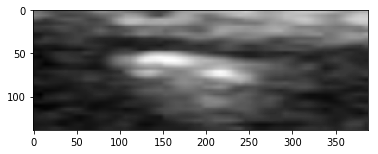

In [29]:
plt.imshow(img_original_,cmap=plt.get_cmap('gray'))
plt.show()

In [30]:
# Discrete wavelet transformation
# coeffs = pywt.wavedec2(img_original_PL,  wavelet="coif1",level=1)

# Wavelets Packet
coeffs =pywt.WaveletPacket2D(img_original_, wavelet="coif1",maxlevel=3)

# to path throught the tree :
# a = approximative
# v = vertical features
# h = horizontal features
# d = diagonal features

# deeper levels : 
# aa = approximative from first level approximative
# dav = vertical features from the second level approximative from the first level diagonal feature



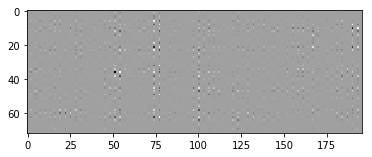

In [31]:
plt.imshow(coeffs["d"].data,cmap=plt.get_cmap('gray'))
plt.show()

In [32]:
(coeffs["hah"].data).mean()

0.19136316

In [33]:
#up_1 = np.concatenate((coeffs["aa"].data,coeffs["ah"].data), axis = 1)
#up_2 = np.concatenate((coeffs["av"].data,coeffs["ad"].data), axis = 1)
#up_total = np.concatenate((up_1, up_2))

up = np.concatenate((coeffs["aaa"].data,coeffs["aah"].data), axis = 1)
bottom = np.concatenate((coeffs["aav"].data,coeffs["aad"].data), axis = 1)
up_bottom = np.concatenate((up, bottom))

In the following image we show the wavelet decomposition of the first layer of the example image. From left to right and up to bottom: the approximated image, the horizontal subimage, the vertical subimage and the diagonal subimage.

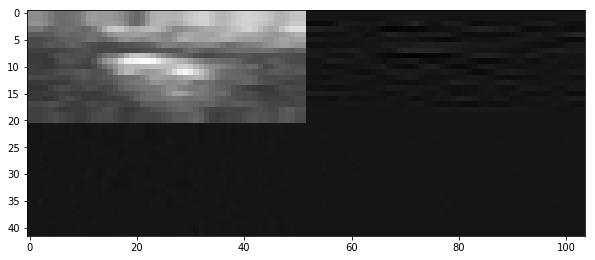

In [34]:
plt.figure(figsize=[10,10])
plt.imshow(up_bottom,cmap=plt.get_cmap('gray'))
plt.show()

In [35]:
feature_row_mean = []
feature_row_std = []
paths = [node.path for node in coeffs.get_level(3)]
df_features_mean = pd.DataFrame(columns = paths[1:])
df_features_std = pd.DataFrame(columns = paths[1:])
for i, path in enumerate(paths):
    if path != "aaa":
        # creation of features for each path except for path aaa
        feature_row_mean.append(np.mean(coeffs[path].data))
        feature_row_std.append(np.std(coeffs[path].data))        
df_features_mean.append(pd.DataFrame([feature_row_mean],columns = paths[1:]))
df_features_std.append(pd.DataFrame([feature_row_std],columns = paths[1:]))
    

,aah,aav,aad,aha,ahh,ahv,ahd,ava,avh,avv,...,dhv,dhd,dva,dvh,dvv,dvd,dda,ddh,ddv,ddd
0,27.780691,4.286714,1.552972,7.700475,8.321667,0.391935,0.705279,1.065652,0.394631,1.092221,...,0.007651,0.013149,0.028893,0.015768,0.024033,0.012067,0.007661,0.011973,0.006712,0.010003
